<a href="https://colab.research.google.com/github/pungji/Artificial_Inteligence_test/blob/master/Artificial_Inteligence.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
print("Hello world")

Hello world


<ipython-input-3-2323749813>:42: UserWarning: Glyph 44552 (\N{HANGUL SYLLABLE GEUM}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-3-2323749813>:42: UserWarning: Glyph 52380 (\N{HANGUL SYLLABLE CEON}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-3-2323749813>:42: UserWarning: Glyph 44396 (\N{HANGUL SYLLABLE GU}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-3-2323749813>:42: UserWarning: Glyph 46020 (\N{HANGUL SYLLABLE DO}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-3-2323749813>:42: UserWarning: Glyph 48393 (\N{HANGUL SYLLABLE BONG}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-3-2323749813>:42: UserWarning: Glyph 44053 (\N{HANGUL SYLLABLE GANG}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-3-2323749813>:42: UserWarning: Glyph 48513 (\N{HANGUL SYLLABLE BUG}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-3-23237498

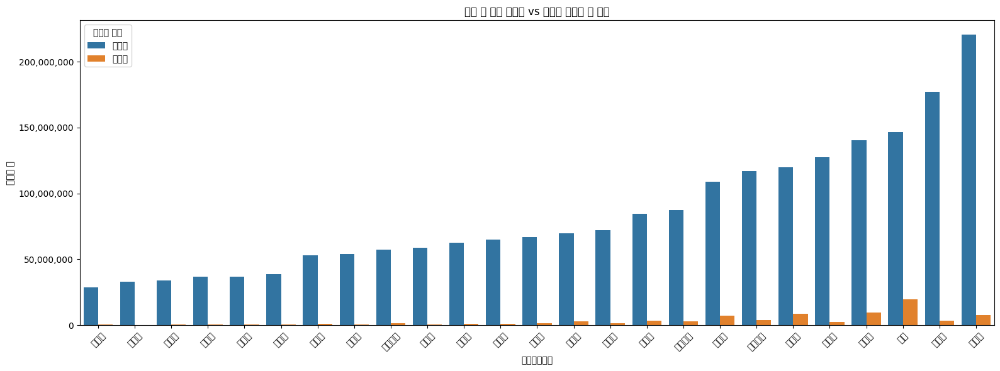

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter

# 엑셀 파일 로딩
df = pd.read_excel('/content/drive/MyDrive/빅데이터처리/지자체별_총방문자수_비율분석.xlsx')

# 기초지자체명을 기준으로 정렬 (내국인 기준)
df = df.sort_values(by='기초지자체 방문자 수', ascending=True)

# 데이터 변형: long-form으로 melt
df_melted = df.melt(id_vars='기초지자체명',
                    value_vars=['기초지자체 방문자 수', '외국인 방문자수'],
                    var_name='방문자 유형', value_name='방문자 수')

# 방문자 유형 이름 변경
df_melted['방문자 유형'] = df_melted['방문자 유형'].replace({
    '기초지자체 방문자 수': '내국인',
    '외국인 방문자수': '외국인'
})

# 천 단위 콤마 포맷
def comma_formatter(x, pos):
    return f'{int(x):,}'

formatter = FuncFormatter(comma_formatter)

# 한글 폰트 설정
plt.rcParams['font.family'] = 'NanumGothic'
plt.rcParams['axes.unicode_minus'] = False

# 포개서 그리기
plt.figure(figsize=(16, 6))
sns.barplot(x='기초지자체명', y='방문자 수', hue='방문자 유형', data=df_melted)

plt.title('서울 각 구별 내국인 vs 외국인 방문자 수 비교')
plt.xticks(rotation=45)
plt.gca().yaxis.set_major_formatter(formatter)
plt.ylabel('방문자 수')
plt.legend(title='방문자 유형')
plt.tight_layout()
plt.show()


In [ ]:
# ✅ 1. 설치
!pip install folium openpyxl
!apt-get -qq install -y fonts-nanum

# ✅ 2. 한글 폰트 강제 등록
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm

font_path = '/usr/share/fonts/truetype/nanum/NanumGothic.ttf'
font_prop = fm.FontProperties(fname=font_path)
plt.rcParams['axes.unicode_minus'] = False

# ✅ 3. 라이브러리 로딩
import pandas as pd
import seaborn as sns
import folium
import json
import re
import base64
import os
from folium import IFrame

# ✅ 4. Google Drive 마운트
from google.colab import drive
drive.mount('/content/drive')

# ✅ 5. 파일 경로
excel_path = "/content/drive/MyDrive/빅데이터처리/honjap.xlsx"
station_path = "/content/drive/MyDrive/빅데이터처리/지하철역_GEOM (역사마스터).csv"
geojson_path = "/content/drive/MyDrive/빅데이터처리/seoul_municipalities_geo.json"

# ✅ 6. 데이터 불러오기
df = pd.read_excel(excel_path)
df_stations = pd.read_csv(station_path, encoding='utf-8')
with open(geojson_path, encoding='utf-8') as f:
    seoul_geo = json.load(f)

# ✅ 7. 대상 역 설정
gangnam_station_list = [
    '강남', '역삼', '삼성', '선릉', '신논현', '언주', '도곡', '매봉', '양재',
    '학여울', '대치', '개포동', '구룡', '일원', '수서', '청담', '봉은사', '한티'
]
junggu_station_list = [
    '서울역', '회현', '명동', '충무로', '을지로3가', '을지로4가',
    '동대문역사문화공원', '신당', '약수', '버티고개', '청구'
]
total_stations = sorted(set(gangnam_station_list + junggu_station_list))
df_selected = df[df['출발역'].isin(total_stations)].copy()

# ✅ 8. 시간 열 처리 및 평균 계산
time_columns = [col for col in df_selected.columns if re.match(r'^\d{1,2}시\d{2}분$', col)]
hourly_groups = {}
for col in time_columns:
    hour = col[:col.index('시')].zfill(2) + ":00"
    hourly_groups.setdefault(hour, []).append(col)

df_hourly = df_selected[['출발역']].copy()
for hour, cols in hourly_groups.items():
    df_numeric = df_selected[cols].apply(pd.to_numeric, errors='coerce')
    df_hourly[hour] = df_numeric.mean(axis=1)

df_melted = df_hourly.melt(id_vars=["출발역"], var_name="시간대", value_name="혼잡도").dropna()
df_grouped = df_melted.groupby(['출발역', '시간대'])['혼잡도'].mean().reset_index()
pivot_table = df_grouped.pivot(index="출발역", columns="시간대", values="혼잡도")

# ✅ 9. 역 좌표 결합
df_geo = df_stations[df_stations['역한글명칭'].isin(pivot_table.index)]

# ✅ 10. 히트맵 저장 (글씨 크기 확대)
heatmap_dir = "/content/station_heatmaps"
os.makedirs(heatmap_dir, exist_ok=True)

for station in pivot_table.index:
    station_data = pivot_table.loc[station].dropna()
    station_df = pd.DataFrame(station_data).T
    station_df.index = [station]

    plt.figure(figsize=(14, 3.5))
    sns.heatmap(
        station_df, annot=True, fmt=".1f", cmap="YlOrRd",
        cbar=True, linewidths=0.3,
        annot_kws={"fontsize": 15},
        xticklabels=station_df.columns,
        yticklabels=station_df.index
    )
    plt.title(f"{station} 혼잡도", fontproperties=font_prop, fontsize=24)
    plt.xlabel("시간대", fontproperties=font_prop, fontsize=20)
    plt.ylabel("혼잡도", fontproperties=font_prop, fontsize=18)
    plt.xticks(fontproperties=font_prop, fontsize=16, rotation=45)
    plt.yticks(fontproperties=font_prop, fontsize=16)
    plt.tight_layout()
    plt.savefig(os.path.join(heatmap_dir, f"{station}_heatmap.png"))
    plt.close()

# ✅ 11. 지도 생성
m = folium.Map(location=[37.5665, 126.9780], zoom_start=12)

# ✅ 12. 자치구 배경 색상 지정 (중구: 초록, 강남구: 파랑)
def district_color(feature):
    name = feature['properties']['name']
    if name == '중구':
        return {'fillColor': 'green', 'color': 'green', 'weight': 1, 'fillOpacity': 0.3}
    elif name == '강남구':
        return {'fillColor': 'blue', 'color': 'blue', 'weight': 1, 'fillOpacity': 0.3}
    else:
        return {'fillColor': 'lightgray', 'color': 'gray', 'weight': 0.5, 'fillOpacity': 0.1}

folium.GeoJson(
    seoul_geo,
    name="자치구 배경",
    style_function=district_color
).add_to(m)

# ✅ 13. 마커 및 팝업 추가
for _, row in df_geo.iterrows():
    station = row['역한글명칭']
    image_path = f"{heatmap_dir}/{station}_heatmap.png"

    if station in gangnam_station_list:
        marker_color = 'blue'
    elif station in junggu_station_list:
        marker_color = 'green'
    else:
        marker_color = 'gray'

    try:
        with open(image_path, 'rb') as img_file:
            encoded = base64.b64encode(img_file.read()).decode('utf-8')
        html = f"""
        <div style="text-align:center;">
            <h4 style="margin-bottom:8px;">{station} 혼잡도</h4>
            <img src="data:image/png;base64,{encoded}" style="width:520px; border:1px solid gray;"/>
        </div>
        """
    except FileNotFoundError:
        html = f"{station} 히트맵 이미지 없음"

    iframe = IFrame(html, width=540, height=300)
    popup = folium.Popup(iframe, max_width=560)
    folium.Marker(
        location=[row['환승역Y좌표'], row['환승역X좌표']],
        popup=popup,
        icon=folium.Icon(color=marker_color, icon='info-sign')
    ).add_to(m)

# ✅ 14. 지도 출력 및 저장 + 다운로드용 링크 만들기
map_path = "/content/seoul_congestion_map.html"
m.save(map_path)

# 지도 출력
m

# ✅ 15. 다운로드 링크 제공
from IPython.display import HTML

def create_download_link(filepath):
    filename = os.path.basename(filepath)
    return HTML(f'<a href="{filepath}" download="{filename}" target="_blank">📥 혼잡도 지도 HTML 다운로드</a>')

create_download_link(map_path)


Selecting previously unselected package fonts-nanum.
(Reading database ... 124947 files and directories currently installed.)
Preparing to unpack .../fonts-nanum_20200506-1_all.deb ...
Unpacking fonts-nanum (20200506-1) ...
Setting up fonts-nanum (20200506-1) ...
Processing triggers for fontconfig (2.13.1-4.2ubuntu5) ...
Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


/usr/local/lib/python3.11/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 44053 (\N{HANGUL SYLLABLE GANG}) missing from font(s) DejaVu Sans.
  fig.canvas.draw()
/usr/local/lib/python3.11/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 45224 (\N{HANGUL SYLLABLE NAM}) missing from font(s) DejaVu Sans.
  fig.canvas.draw()
/usr/local/lib/python3.11/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 45824 (\N{HANGUL SYLLABLE DAE}) missing from font(s) DejaVu Sans.
  fig.canvas.draw()
/usr/local/lib/python3.11/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 52824 (\N{HANGUL SYLLABLE CI}) missing from font(s) DejaVu Sans.
  fig.canvas.draw()
/usr/local/lib/python3.11/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 46020 (\N{HANGUL SYLLABLE DO}) missing from font(s) DejaVu Sans.
  fig.canvas.draw()
/usr/local/lib/python3.11/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 44257 (\N{HANGUL SYLLABLE GOG}) missing from font(s) DejaVu Sans.
  fig.canvas.draw()
/usr/

In [ ]:
# 1단계: 나눔고딕 폰트 설치 및 캐시 초기화
!apt-get update -qq
!apt-get install -y fonts-nanum
!fc-cache -fv
!rm -rf ~/.cache/matplotlib  # 캐시 삭제

W: Skipping acquire of configured file 'main/source/Sources' as repository 'https://r2u.stat.illinois.edu/ubuntu jammy InRelease' does not seem to provide it (sources.list entry misspelt?)
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following NEW packages will be installed:
  fonts-nanum
0 upgraded, 1 newly installed, 0 to remove and 35 not upgraded.
Need to get 10.3 MB of archives.
After this operation, 34.1 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/universe amd64 fonts-nanum all 20200506-1 [10.3 MB]
Fetched 10.3 MB in 1s (11.3 MB/s)
Selecting previously unselected package fonts-nanum.
(Reading database ... 126111 files and directories currently installed.)
Preparing to unpack .../fonts-nanum_20200506-1_all.deb ...
Unpacking fonts-nanum (20200506-1) ...
Setting up fonts-nanum (20200506-1) ...
Processing triggers for fontconfig (2.13.1-4.2ubuntu5) ...
/usr/share/fonts: caching, new cac

In [ ]:
#  설치
!pip install folium openpyxl
!apt-get -qq install -y fonts-nanum

#  한글 강제 등록
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
font_path = '/usr/share/fonts/truetype/nanum/NanumGothic.ttf'
font_prop = fm.FontProperties(fname=font_path)
plt.rcParams['axes.unicode_minus'] = False


import pandas as pd
import seaborn as sns
import folium
import json
import re
import base64
import os
from folium import IFrame

#  드라이브 마운트
from google.colab import drive
drive.mount('/content/drive')

# 각 파일 경로 변수 저장
honjap_path = "/content/drive/MyDrive/빅데이터처리/honjap.xlsx"
station_path = "/content/drive/MyDrive/빅데이터처리/지하철역_GEOM (역사마스터).csv"
geojson_path = "/content/drive/MyDrive/빅데이터처리/seoul_municipalities_geo.json"

# 파일 불러오기
df = pd.read_excel(honjap_path)
df_stations = pd.read_csv(station_path, encoding='utf-8')
with open(geojson_path, encoding='utf-8') as f:
    seoul_geo = json.load(f)

# 리스트에 중구 강남구 포함 역 저장
gangnam_station_list = [
    '강남', '역삼', '삼성', '선릉', '신논현', '언주', '도곡', '매봉', '양재',
    '학여울', '대치', '개포동', '구룡', '일원', '수서', '청담', '봉은사', '한티'
]
junggu_station_list = [
    '서울역', '회현', '명동', '충무로', '을지로3가', '을지로4가',
    '동대문역사문화공원', '신당', '약수', '버티고개', '청구'
]
total_stations = sorted(set(gangnam_station_list + junggu_station_list))
df_selected = df[df['출발역'].isin(total_stations)].copy()

# honjap.xlsx 파일에 있는 혼잡도 값 추출
time_columns = [col for col in df_selected.columns if re.match(r'^\d{1,2}시\d{2}분$', col)]
hourly_groups = {}
for col in time_columns:
    hour = col[:col.index('시')].zfill(2) + ":00"
    hourly_groups.setdefault(hour, []).append(col)

df_hourly = df_selected[['출발역']].copy()
for hour, cols in hourly_groups.items():
    df_numeric = df_selected[cols].apply(pd.to_numeric, errors='coerce')
    df_hourly[hour] = df_numeric.mean(axis=1)

df_melted = df_hourly.melt(id_vars=["출발역"], var_name="시간대", value_name="혼잡도").dropna()
df_grouped = df_melted.groupby(['출발역', '시간대'])['혼잡도'].mean().reset_index()
pivot_table = df_grouped.pivot(index="출발역", columns="시간대", values="혼잡도")

# 역 좌표 데이터 결합
df_geo = df_stations[df_stations['역한글명칭'].isin(pivot_table.index)]

# 각 역에 추출된 히트맵 값 저장
heatmap_dir = "/content/station_heatmaps"
os.makedirs(heatmap_dir, exist_ok=True)

for station in pivot_table.index:
    station_data = pivot_table.loc[station].dropna()
    station_df = pd.DataFrame(station_data).T
    station_df.index = [station]

    plt.figure(figsize=(14, 3.5))
    sns.heatmap(
        station_df, annot=True, fmt=".1f", cmap="YlOrRd",
        cbar=True, linewidths=0.3,
        annot_kws={"fontsize": 15},
        xticklabels=station_df.columns,
        yticklabels=station_df.index
    )
    plt.title(f"{station} 혼잡도", fontproperties=font_prop, fontsize=24)
    plt.xlabel("시간대", fontproperties=font_prop, fontsize=20)
    plt.ylabel("혼잡도", fontproperties=font_prop, fontsize=18)
    plt.xticks(fontproperties=font_prop, fontsize=16, rotation=45)
    plt.yticks(fontproperties=font_prop, fontsize=16)
    plt.tight_layout()
    plt.savefig(os.path.join(heatmap_dir, f"{station}_heatmap.png"))
    plt.close()

# 서울시 좌표로 지도 저장
m = folium.Map(location=[37.5665, 126.9780], zoom_start=12)

# 배경 색상 지정 (중구: 초록, 강남구: 파랑)
def district_color(feature):
    name = feature['properties']['name']
    if name == '중구':
        return {'fillColor': 'green', 'color': 'green', 'weight': 1, 'fillOpacity': 0.3}
    elif name == '강남구':
        return {'fillColor': 'blue', 'color': 'blue', 'weight': 1, 'fillOpacity': 0.3}
    else:
        return {'fillColor': 'lightgray', 'color': 'gray', 'weight': 0.5, 'fillOpacity': 0.1}
# json 배경 지도에 적용
folium.GeoJson(
    seoul_geo,
    name="자치구 배경",
    style_function=district_color
).add_to(m)

#마커 및 팝업 추가
for _, row in df_geo.iterrows():
    station = row['역한글명칭']
    image_path = f"{heatmap_dir}/{station}_heatmap.png"

    if station in gangnam_station_list:
        marker_color = 'blue'
    elif station in junggu_station_list:
        marker_color = 'green'
    else:
        marker_color = 'gray'

    try:
        with open(image_path, 'rb') as img_file:
            encoded = base64.b64encode(img_file.read()).decode('utf-8')
        html = f"""
        <div style="text-align:center;">
            <h4 style="margin-bottom:8px;">{station} 혼잡도</h4>
            <img src="data:image/png;base64,{encoded}" style="width:520px; border:1px solid gray;"/>
        </div>
        """
    except FileNotFoundError:
        html = f"{station} 히트맵 이미지 없음"

    iframe = IFrame(html, width=540, height=300)
    popup = folium.Popup(iframe, max_width=560)
    folium.Marker(
        location=[row['환승역Y좌표'], row['환승역X좌표']],
        popup=popup,
        icon=folium.Icon(color=marker_color, icon='info-sign')
    ).add_to(m)

# 지도 출력
m


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


/usr/local/lib/python3.11/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 44053 (\N{HANGUL SYLLABLE GANG}) missing from font(s) DejaVu Sans.
  fig.canvas.draw()
/usr/local/lib/python3.11/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 45224 (\N{HANGUL SYLLABLE NAM}) missing from font(s) DejaVu Sans.
  fig.canvas.draw()
/usr/local/lib/python3.11/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 45824 (\N{HANGUL SYLLABLE DAE}) missing from font(s) DejaVu Sans.
  fig.canvas.draw()
/usr/local/lib/python3.11/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 52824 (\N{HANGUL SYLLABLE CI}) missing from font(s) DejaVu Sans.
  fig.canvas.draw()
/usr/local/lib/python3.11/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 46020 (\N{HANGUL SYLLABLE DO}) missing from font(s) DejaVu Sans.
  fig.canvas.draw()
/usr/local/lib/python3.11/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 44257 (\N{HANGUL SYLLABLE GOG}) missing from font(s) DejaVu Sans.
  fig.canvas.draw()
/usr/

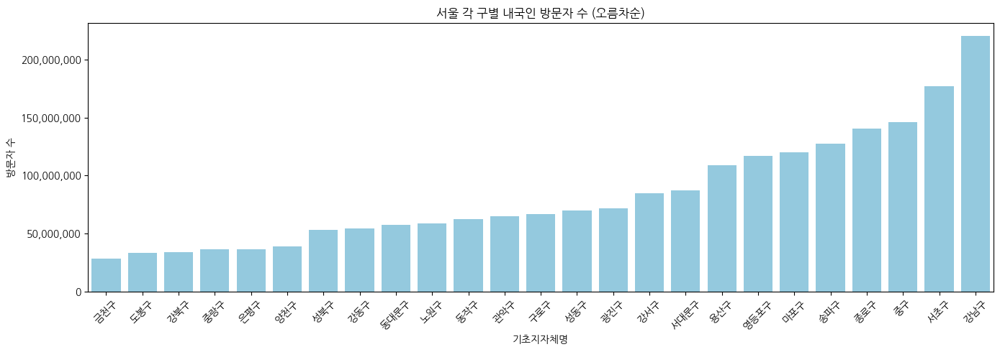

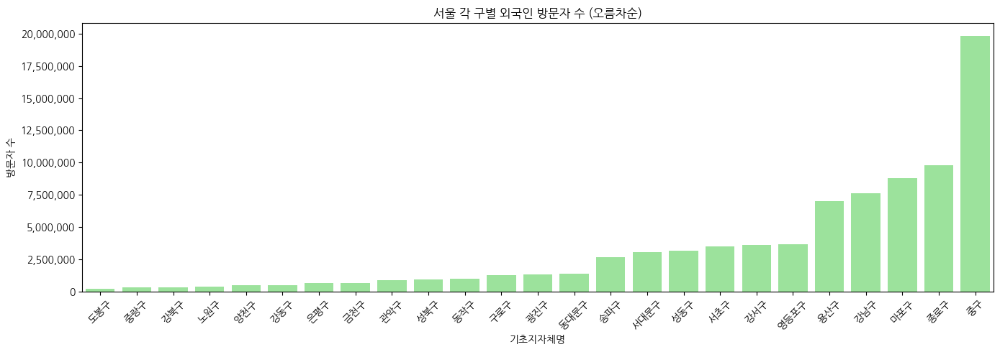

In [ ]:
####내국인 외국인 방문자수#####
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter

# 엑셀 파일 로딩
df = pd.read_excel('/content/drive/MyDrive/빅데이터처리/지자체별_총방문자수_비율분석.xlsx')

# 내국인 방문자 수 기준 정렬 (오름차순)
df_sorted_korean = df.sort_values(by='기초지자체 방문자 수', ascending=True)
gu_order_korean = df_sorted_korean['기초지자체명']

# 외국인 방문자 수 기준 정렬 (오름차순)
df_sorted_foreign = df.sort_values(by='외국인 방문자수', ascending=True)
gu_order_foreign = df_sorted_foreign['기초지자체명']

# 천 단위 콤마 포맷
def comma_formatter(x, pos):
    return f'{int(x):,}'

formatter = FuncFormatter(comma_formatter)

# 한글 폰트 설정
plt.rcParams['font.family'] = 'NanumGothic'
plt.rcParams['axes.unicode_minus'] = False

# 🔹 내국인 그래프
plt.figure(figsize=(14, 5))
sns.barplot(x='기초지자체명', y='기초지자체 방문자 수', data=df_sorted_korean, order=gu_order_korean, color='skyblue')
plt.title('서울 각 구별 내국인 방문자 수 (오름차순)')
plt.xticks(rotation=45)
plt.gca().yaxis.set_major_formatter(formatter)
plt.ylabel('방문자 수')
plt.tight_layout()
plt.show()

# 🔹 외국인 그래프
plt.figure(figsize=(14, 5))
sns.barplot(x='기초지자체명', y='외국인 방문자수', data=df_sorted_foreign, order=gu_order_foreign, color='lightgreen')
plt.title('서울 각 구별 외국인 방문자 수 (오름차순)')
plt.xticks(rotation=45)
plt.gca().yaxis.set_major_formatter(formatter)
plt.ylabel('방문자 수')
plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd

# Colab에 파일 업로드
from google.colab import files
uploaded = files.upload()

# CSV 파일 불러오기 (파일 이름에 맞게 수정하세요)
df = pd.read_csv("/content/drive/MyDrive/빅데이터처리/서울교통공사_서울 도시철도 열차운행시각표_20250430.csv", encoding='cp949')

# 중구에 포함되는 지하철역 목록
중구_역_목록 = [
    '충정로', '서울역', '회현', '시청', '을지로입구', '을지로3가', '을지로4가',
    '명동', '충무로', '동대입구', '약수', '동대문역사문화공원', '신당', '청구'
]

# 열 이름 확인 후 역이름 필드 정제 (예: '역명', '도착역명', '승강장역명' 등)
# 아래는 '도착역명' 컬럼 기준 예시입니다.
if '도착역명' in df.columns:
    역컬럼 = '도착역명'
elif '역명' in df.columns:
    역컬럼 = '역명'
else:
    역컬럼 = df.columns[df.columns.str.contains('역')][0]  # 첫 번째 '역' 포함 컬럼 자동 선택

# 중구 역 필터링
df_filtered = df[df[역컬럼].isin(중구_역_목록)]

# 역별 열차 도착 횟수 계산
df_result = df_filtered[역컬럼].value_counts().reset_index()
df_result.columns = ['지하철역', '열차횟수']

# 엑셀로 저장
df_result.to_excel("중구_지하철역_열차배차횟수.xlsx", index=False)
files.download("중구_지하철역_열차배차횟수.xlsx")


Saving 서울교통공사_서울 도시철도 열차운행시각표_20250430.csv to 서울교통공사_서울 도시철도 열차운행시각표_20250430.csv


<ipython-input-2-296268717>:8: DtypeWarning: Columns (7) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv("/content/drive/MyDrive/빅데이터처리/서울교통공사_서울 도시철도 열차운행시각표_20250430.csv", encoding='cp949')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

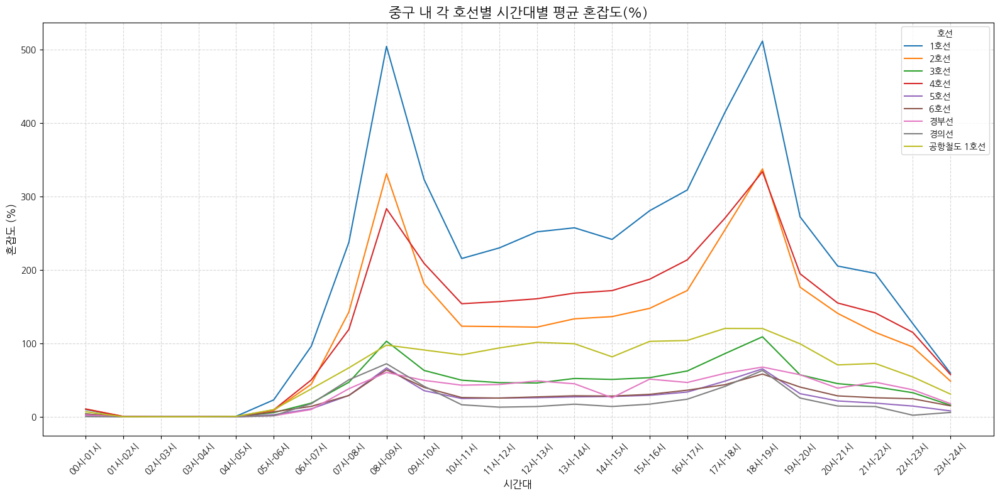

In [ ]:
# 라이브러리 불러오기
import pandas as pd
import matplotlib.pyplot as plt

# 엑셀 파일 불러오기 (Colab에 먼저 업로드 필요)
df = pd.read_excel('/content/sample_data/중구내역_시간대별_혼잡도_최종.xlsx')

# 시간대 컬럼 추출
time_columns = [col for col in df.columns if '시-' in col or '시' in col]

# 호선별로 시간대 평균 혼잡도 계산
df_avg = df.groupby('호선명')[time_columns].mean().T  # 전치로 행=시간대, 열=호선

# 그래프 스타일 설정
plt.figure(figsize=(16, 8))

# 선 그래프 그리기
for col in df_avg.columns:
    plt.plot(df_avg.index, df_avg[col], label=col)

# 시각적 설정
plt.title('중구 내 각 호선별 시간대별 평균 혼잡도(%)', fontsize=16)
plt.xlabel('시간대', fontsize=12)
plt.ylabel('혼잡도 (%)', fontsize=12)
plt.xticks(rotation=45)
plt.grid(True, linestyle='--', alpha=0.5)
plt.legend(title='호선', fontsize=10)
plt.tight_layout()

# 그래프 출력
plt.show()


✅ 나눔고딕 설치됨: /usr/share/fonts/truetype/nanum/NanumGothicBold.ttf
✅ 나눔고딕 설치됨: /usr/share/fonts/truetype/nanum/NanumGothicCoding.ttf
✅ 나눔고딕 설치됨: /usr/share/fonts/truetype/nanum/NanumGothic.ttf
✅ 나눔고딕 설치됨: /usr/share/fonts/truetype/nanum/NanumGothicCodingBold.ttf


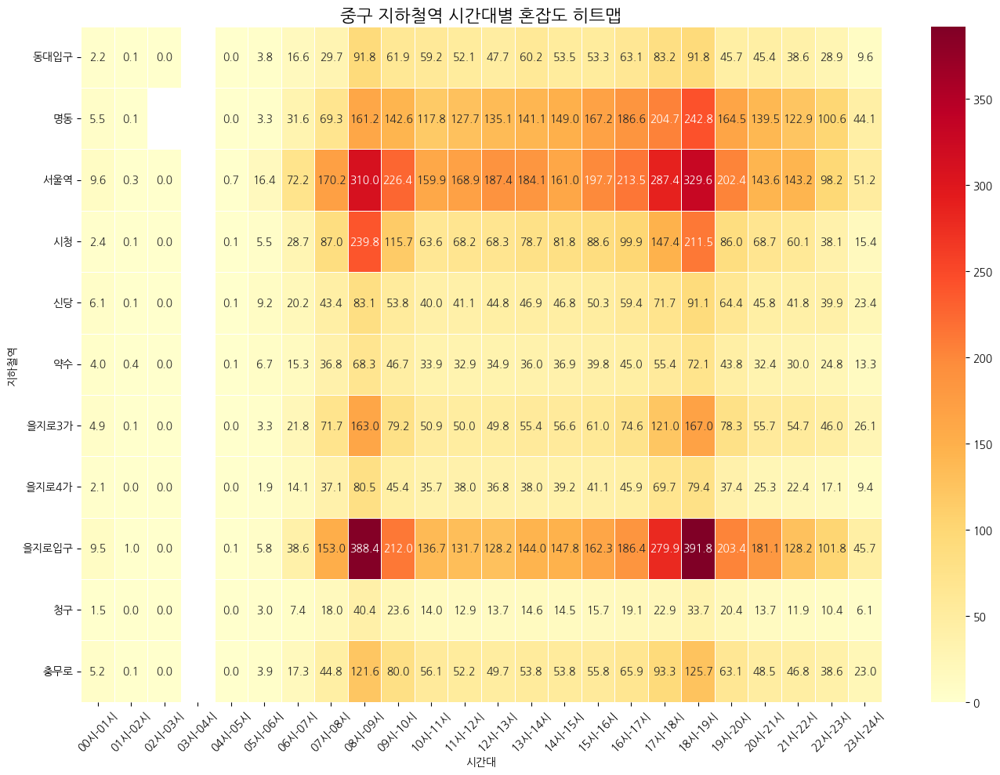

In [ ]:

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.font_manager as fm

# 폰트 설정
for font in fm.findSystemFonts(fontpaths=None, fontext='ttf'):
    if 'NanumGothic' in font:
        print("나눔고딕 설치됨:", font)

plt.rc('font', family='NanumGothic')
plt.rcParams['axes.unicode_minus'] = False

# 파일 경로 설정
passenger_path = "/content/drive/MyDrive/빅데이터처리/중구_포함역.xlsx"
train_path = "/content/drive/MyDrive/빅데이터처리/중구_선택역_요일_방향별_열차횟수(삭제금지).xlsx"

# 데이터 불러오기
df_passenger = pd.read_excel(passenger_path)
df_trains = pd.read_excel(train_path)

# 기본값 지정
capacity = 1600
days = 31

#시간대 추출
time_columns = [col for col in df_passenger.columns if '시' in col]
time_hours = [int(col.split('시')[0]) for col in time_columns]

# 혼잡도 계산
results = []

for station in df_passenger['지하철역'].unique():
    station_passenger = df_passenger[df_passenger['지하철역'] == station]

    for col, hour in zip(time_columns, time_hours):
        # 열차 수 추출
        matching_trains = df_trains[
            (df_trains['지하철역'] == station) &
            (df_trains['요일구분(day/sat/end)'] == 'DAY')
        ]
        total_trains = matching_trains['열차횟수'].sum()
        time_slot_trains = total_trains / len(time_columns) if total_trains > 0 else 0

        # 혼잡도 계산 (인원수%days)/1600(열차수)*역의 열차배차횟수
        passengers = station_passenger[col].sum()
        if time_slot_trains > 0:
            avg_per_day = passengers / days
            max_capacity = time_slot_trains * capacity
            congestion = (avg_per_day / max_capacity) * 100
        else:
            congestion = None

        results.append({
            '지하철역': station,
            '시간대': col,
            '혼잡도(%)': round(congestion, 2) if congestion else None
        })

# 데이터프레임 생성 및 피벗
df_result = pd.DataFrame(results)
df_pivot = df_result.pivot(index='지하철역', columns='시간대', values='혼잡도(%)')

# 히트맵 시각화
plt.figure(figsize=(14, 10))
sns.heatmap(df_pivot, annot=True, fmt=".1f", cmap='YlOrRd', linewidths=0.5)
plt.title("중구 지하철역 시간대별 혼잡도 히트맵", fontsize=16)
plt.xlabel("시간대")
plt.ylabel("지하철역")
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()


✅ 나눔고딕 설치됨: /usr/share/fonts/truetype/nanum/NanumGothic.ttf
✅ 나눔고딕 설치됨: /usr/share/fonts/truetype/nanum/NanumGothicCodingBold.ttf
✅ 나눔고딕 설치됨: /usr/share/fonts/truetype/nanum/NanumGothicBold.ttf
✅ 나눔고딕 설치됨: /usr/share/fonts/truetype/nanum/NanumGothicCoding.ttf


/usr/local/lib/python3.11/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 49884 (\N{HANGUL SYLLABLE SI}) missing from font(s) DejaVu Sans.
  fig.canvas.draw()
/usr/local/lib/python3.11/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 46041 (\N{HANGUL SYLLABLE DONG}) missing from font(s) DejaVu Sans.
  fig.canvas.draw()
/usr/local/lib/python3.11/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 45824 (\N{HANGUL SYLLABLE DAE}) missing from font(s) DejaVu Sans.
  fig.canvas.draw()
/usr/local/lib/python3.11/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 51077 (\N{HANGUL SYLLABLE IB}) missing from font(s) DejaVu Sans.
  fig.canvas.draw()
/usr/local/lib/python3.11/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 44396 (\N{HANGUL SYLLABLE GU}) missing from font(s) DejaVu Sans.
  fig.canvas.draw()
/usr/local/lib/python3.11/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 47749 (\N{HANGUL SYLLABLE MYEONG}) missing from font(s) DejaVu Sans.
  fig.canvas.draw()
/us

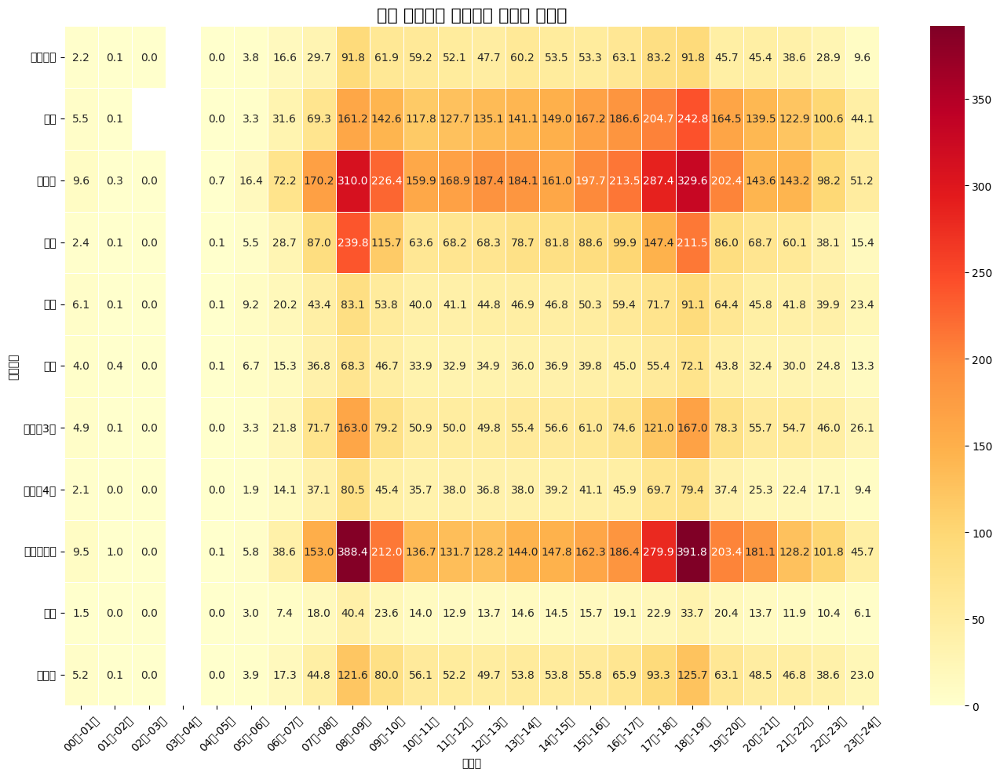

In [ ]:
# 📌 필요 라이브러리 임포트
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.font_manager as fm

# 📌 한글 폰트 설정 (나눔고딕)
for font in fm.findSystemFonts(fontpaths=None, fontext='ttf'):
    if 'NanumGothic' in font:
        print("✅ 나눔고딕 설치됨:", font)

plt.rc('font', family='NanumGothic')
plt.rcParams['axes.unicode_minus'] = False

# 📌 파일 경로 설정 (Google Drive에 마운트한 경로로 수정)
passenger_path = "/content/drive/MyDrive/빅데이터처리/중구_포함역.xlsx"
train_path = "/content/drive/MyDrive/빅데이터처리/중구_선택역_요일_방향별_열차횟수(삭제금지).xlsx"

# 📌 데이터 불러오기
df_passenger = pd.read_excel(passenger_path)
df_trains = pd.read_excel(train_path)

# 📌 기본 설정
capacity = 1600
days = 31

# 📌 시간대 추출
time_columns = [col for col in df_passenger.columns if '시' in col]
time_hours = [int(col.split('시')[0]) for col in time_columns]

# 📌 혼잡도 계산
results = []

for station in df_passenger['지하철역'].unique():
    station_passenger = df_passenger[df_passenger['지하철역'] == station]

    for col, hour in zip(time_columns, time_hours):
        # 열차 수 추출
        matching_trains = df_trains[
            (df_trains['지하철역'] == station) &
            (df_trains['요일구분(day/sat/end)'] == 'DAY')
        ]
        total_trains = matching_trains['열차횟수'].sum()
        time_slot_trains = total_trains / len(time_columns) if total_trains > 0 else 0

        # 혼잡도 계산
        passengers = station_passenger[col].sum()
        if time_slot_trains > 0:
            avg_per_day = passengers / days
            max_capacity = time_slot_trains * capacity
            congestion = (avg_per_day / max_capacity) * 100
        else:
            congestion = None

        results.append({
            '지하철역': station,
            '시간대': col,
            '혼잡도(%)': round(congestion, 2) if congestion else None
        })

# 📌 데이터프레임 생성 및 피벗
df_result = pd.DataFrame(results)
df_pivot = df_result.pivot(index='지하철역', columns='시간대', values='혼잡도(%)')

# 📌 히트맵 시각화
plt.figure(figsize=(14, 10))
sns.heatmap(df_pivot, annot=True, fmt=".1f", cmap='YlOrRd', linewidths=0.5)
plt.title("중구 지하철역 시간대별 혼잡도 히트맵", fontsize=16)
plt.xlabel("시간대")
plt.ylabel("지하철역")
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()


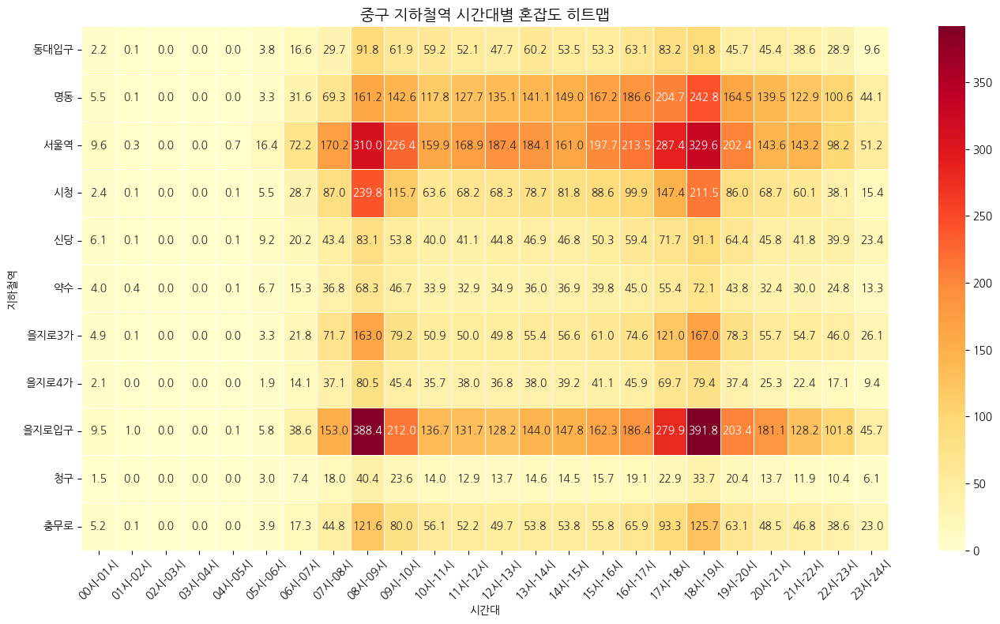

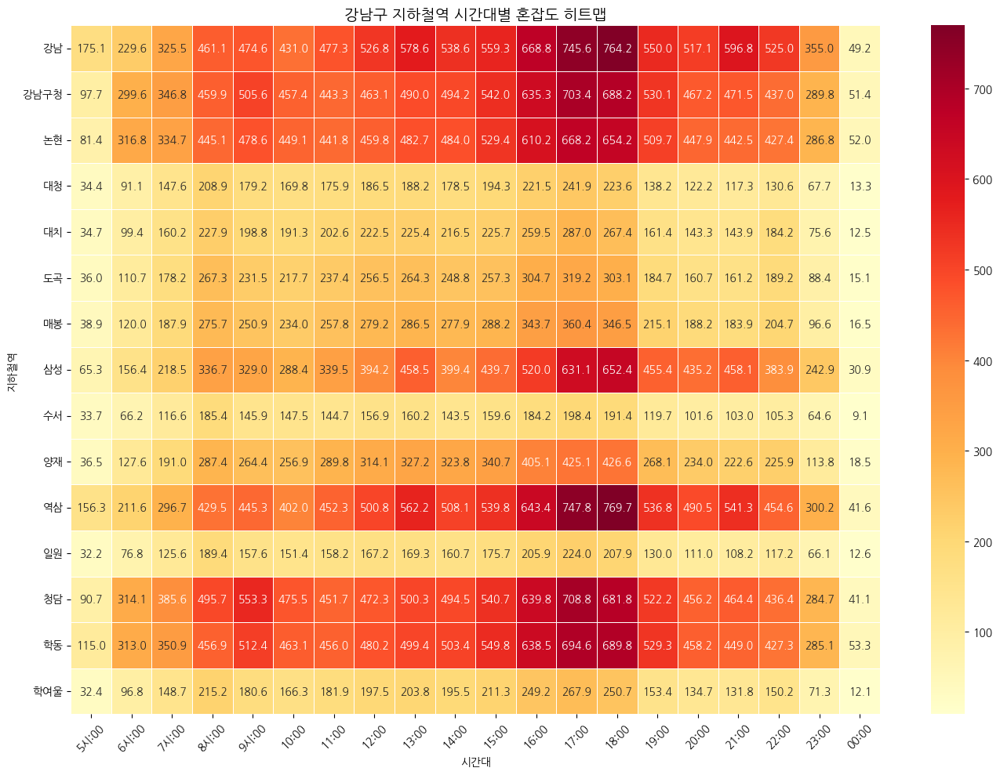

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.font_manager as fm

# ✅ 나눔고딕 폰트 설치 (Colab 전용)
!apt-get -qq install -y fonts-nanum
plt.rc('font', family='NanumGothic')
plt.rcParams['axes.unicode_minus'] = False

# ✅ 엑셀 파일 경로 (경로에 맞게 수정 필요)
path_junggu = "/content/drive/MyDrive/빅데이터처리/중구_혼잡도_최최최종종종.xlsx"
path_gangnam = "/content/drive/MyDrive/빅데이터처리/강남구_혼잡도_1시간단위.xlsx"

# ✅ 파일 불러오기
df_junggu = pd.read_excel(path_junggu)
df_gangnam = pd.read_excel(path_gangnam)

# ✅ 필요 없는 열 제거
df_junggu = df_junggu.loc[:, ~df_junggu.columns.str.contains("^Unnamed")]
df_gangnam = df_gangnam.loc[:, ~df_gangnam.columns.str.contains("^Unnamed")]

# ✅ 중구 히트맵
plt.figure(figsize=(14, 8))
sns.heatmap(df_junggu.set_index("지하철역"), annot=True, fmt=".1f", cmap='YlOrRd', linewidths=0.5)
plt.title("중구 지하철역 시간대별 혼잡도 히트맵", fontsize=14)
plt.xlabel("시간대")
plt.ylabel("지하철역")
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

# ✅ 강남구 히트맵
plt.figure(figsize=(14, 10))
sns.heatmap(df_gangnam.set_index("지하철역"), annot=True, fmt=".1f", cmap='YlOrRd', linewidths=0.5)
plt.title("강남구 지하철역 시간대별 혼잡도 히트맵", fontsize=14)
plt.xlabel("시간대")
plt.ylabel("지하철역")
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()


✅ 나눔고딕 설치됨: /usr/share/fonts/truetype/nanum/NanumGothicCodingBold.ttf
✅ 나눔고딕 설치됨: /usr/share/fonts/truetype/nanum/NanumGothic.ttf
✅ 나눔고딕 설치됨: /usr/share/fonts/truetype/nanum/NanumGothicBold.ttf
✅ 나눔고딕 설치됨: /usr/share/fonts/truetype/nanum/NanumGothicCoding.ttf


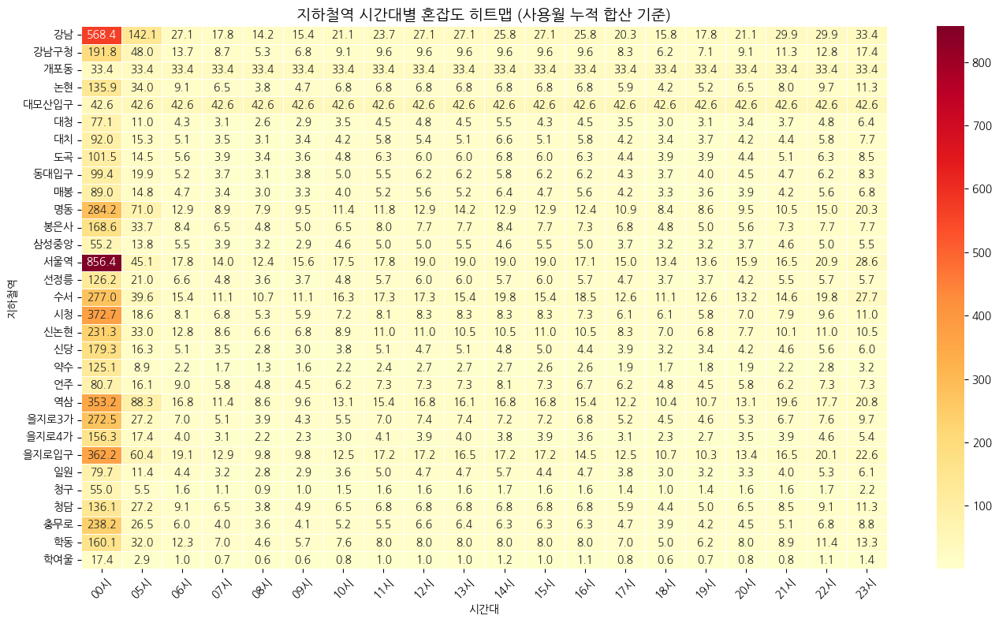

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.font_manager as fm

# ✅ 나눔고딕 설치 확인 및 설정
for font in fm.findSystemFonts(fontpaths=None, fontext='ttf'):
    if 'NanumGothic' in font:
        print("✅ 나눔고딕 설치됨:", font)

plt.rc('font', family='NanumGothic')
plt.rcParams['axes.unicode_minus'] = False

# ✅ 엑셀 파일 불러오기 (경로 수정 필요)
file_path = "/content/drive/MyDrive/빅데이터처리/중구_강남구_하루총합기반_혼잡도_시간대분배.xlsx"
df = pd.read_excel(file_path)

# ✅ 'Unnamed' 열 제거 및 숫자형 합계
df = df.loc[:, ~df.columns.str.contains('^Unnamed')]
df = df.drop(columns=['사용월'], errors='ignore')
df_grouped = df.groupby('지하철역', as_index=False).sum(numeric_only=True)

# ✅ 히트맵 시각화
plt.figure(figsize=(14, 8))
sns.heatmap(df_grouped.set_index("지하철역"),
            annot=True, fmt=".1f", cmap='YlOrRd', linewidths=0.5)

plt.title("지하철역 시간대별 혼잡도 히트맵 (사용월 누적 합산 기준)", fontsize=14)
plt.xlabel("시간대")
plt.ylabel("지하철역")
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

/usr/local/lib/python3.11/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 49884 (\N{HANGUL SYLLABLE SI}) missing from font(s) DejaVu Sans.
  fig.canvas.draw()
/usr/local/lib/python3.11/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 46041 (\N{HANGUL SYLLABLE DONG}) missing from font(s) DejaVu Sans.
  fig.canvas.draw()
/usr/local/lib/python3.11/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 45824 (\N{HANGUL SYLLABLE DAE}) missing from font(s) DejaVu Sans.
  fig.canvas.draw()
/usr/local/lib/python3.11/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 51077 (\N{HANGUL SYLLABLE IB}) missing from font(s) DejaVu Sans.
  fig.canvas.draw()
/usr/local/lib/python3.11/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 44396 (\N{HANGUL SYLLABLE GU}) missing from font(s) DejaVu Sans.
  fig.canvas.draw()
/usr/local/lib/python3.11/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 47749 (\N{HANGUL SYLLABLE MYEONG}) missing from font(s) DejaVu Sans.
  fig.canvas.draw()
/us

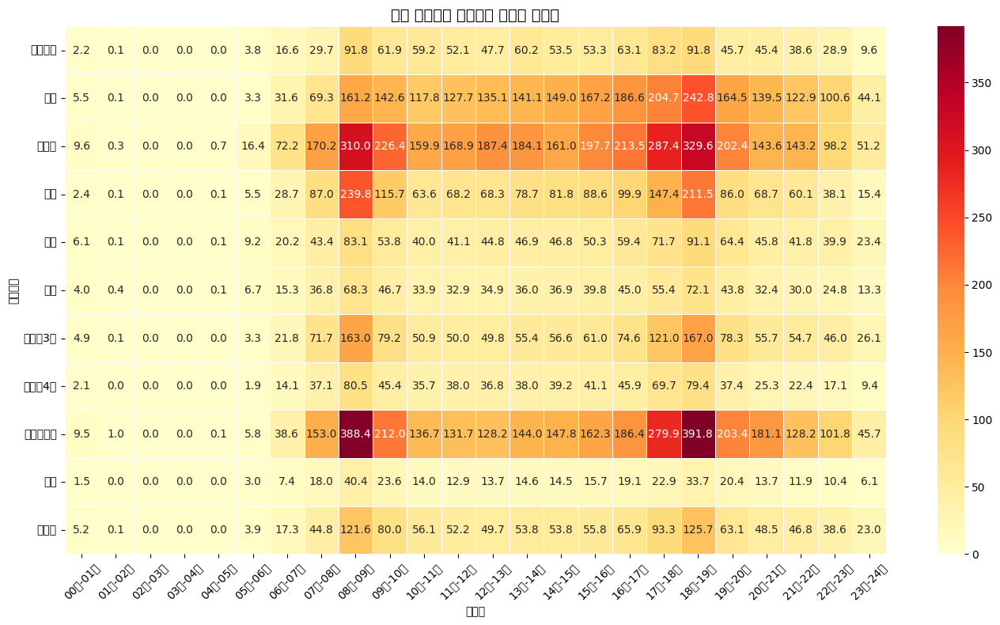

/usr/local/lib/python3.11/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 49884 (\N{HANGUL SYLLABLE SI}) missing from font(s) DejaVu Sans.
  fig.canvas.draw()
/usr/local/lib/python3.11/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 44053 (\N{HANGUL SYLLABLE GANG}) missing from font(s) DejaVu Sans.
  fig.canvas.draw()
/usr/local/lib/python3.11/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 45224 (\N{HANGUL SYLLABLE NAM}) missing from font(s) DejaVu Sans.
  fig.canvas.draw()
/usr/local/lib/python3.11/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 44396 (\N{HANGUL SYLLABLE GU}) missing from font(s) DejaVu Sans.
  fig.canvas.draw()
/usr/local/lib/python3.11/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 52397 (\N{HANGUL SYLLABLE CEONG}) missing from font(s) DejaVu Sans.
  fig.canvas.draw()
/usr/local/lib/python3.11/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 45436 (\N{HANGUL SYLLABLE NON}) missing from font(s) DejaVu Sans.
  fig.canvas.draw()
/us

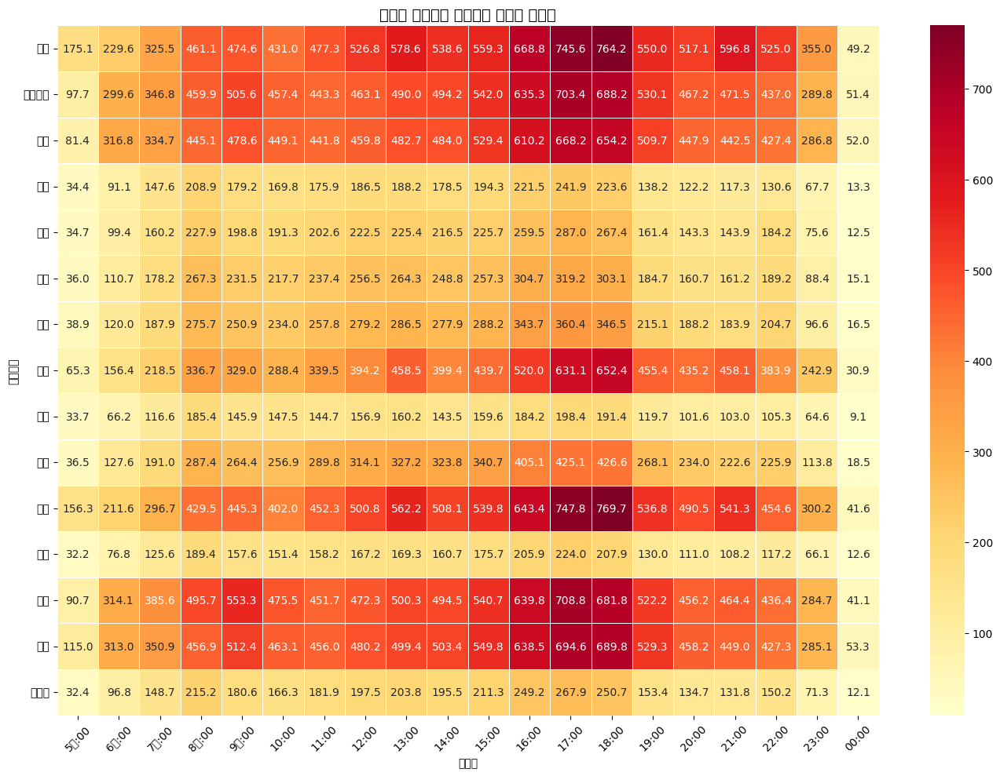

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.font_manager as fm

# ✅ 나눔고딕 폰트 설치 (Colab 환경)
!apt-get -qq install -y fonts-nanum
plt.rc('font', family='NanumGothic')
plt.rcParams['axes.unicode_minus'] = False

# ✅ 엑셀 파일 경로
path_junggu = "/content/drive/MyDrive/빅데이터처리/중구_혼잡도_최최최종종종.xlsx"
path_gangnam = "/content/drive/MyDrive/빅데이터처리/강남구_혼잡도_1시간단위.xlsx"

# ✅ 파일 불러오기
df_junggu = pd.read_excel(path_junggu)
df_gangnam = pd.read_excel(path_gangnam)

# ✅ 열 정리
df_junggu = df_junggu.loc[:, ~df_junggu.columns.str.contains("^Unnamed")]
df_gangnam = df_gangnam.loc[:, ~df_gangnam.columns.str.contains("^Unnamed")]

# ✅ 중구 히트맵 저장
plt.figure(figsize=(14, 8))
sns.heatmap(df_junggu.set_index("지하철역"), annot=True, fmt=".1f", cmap='YlOrRd', linewidths=0.5)
plt.title("중구 지하철역 시간대별 혼잡도 히트맵", fontsize=14)
plt.xlabel("시간대")
plt.ylabel("지하철역")
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.savefig("/content/junggu_heatmap.png")
plt.show()

# ✅ 강남구 히트맵 저장
plt.figure(figsize=(14, 10))
sns.heatmap(df_gangnam.set_index("지하철역"), annot=True, fmt=".1f", cmap='YlOrRd', linewidths=0.5)
plt.title("강남구 지하철역 시간대별 혼잡도 히트맵", fontsize=14)
plt.xlabel("시간대")
plt.ylabel("지하철역")
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.savefig("/content/gangnam_heatmap.png")
plt.show()


✅ 나눔고딕 설치됨: /usr/share/fonts/truetype/nanum/NanumGothicBold.ttf
✅ 나눔고딕 설치됨: /usr/share/fonts/truetype/nanum/NanumGothicCoding.ttf
✅ 나눔고딕 설치됨: /usr/share/fonts/truetype/nanum/NanumGothic.ttf
✅ 나눔고딕 설치됨: /usr/share/fonts/truetype/nanum/NanumGothicCodingBold.ttf


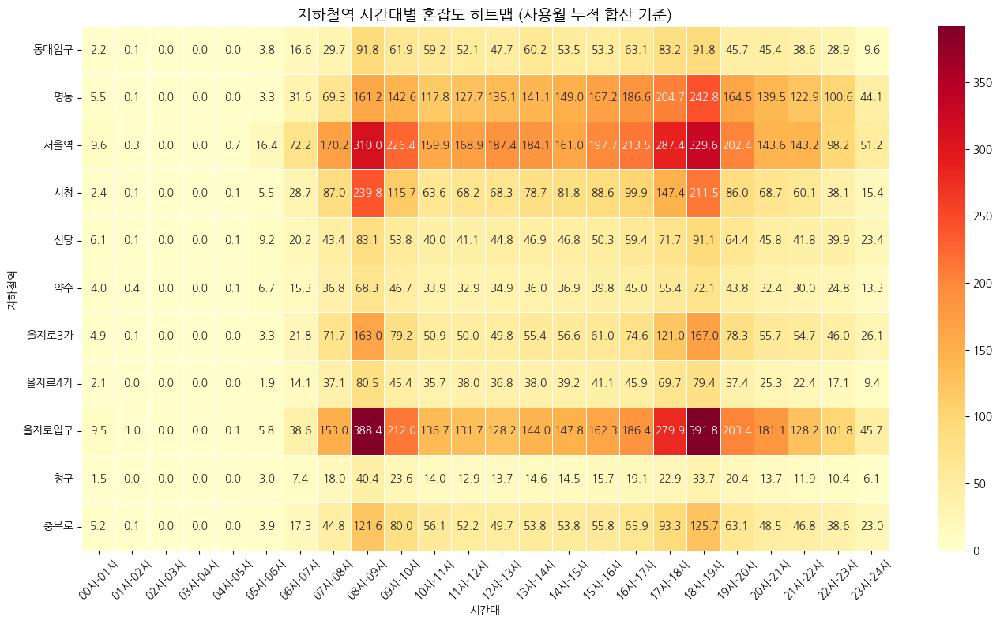

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.font_manager as fm

# ✅ 나눔고딕 설치 확인 및 설정
for font in fm.findSystemFonts(fontpaths=None, fontext='ttf'):
    if 'NanumGothic' in font:
        print("✅ 나눔고딕 설치됨:", font)

plt.rc('font', family='NanumGothic')
plt.rcParams['axes.unicode_minus'] = False

# ✅ 엑셀 파일 불러오기 (경로 수정 필요)
file_path = "/content/drive/MyDrive/빅데이터처리/중구_혼잡도_최최최종종종.xlsx"
df = pd.read_excel(file_path)

# ✅ 'Unnamed' 열 제거 및 숫자형 합계
df = df.loc[:, ~df.columns.str.contains('^Unnamed')]
df = df.drop(columns=['사용월'], errors='ignore')
df_grouped = df.groupby('지하철역', as_index=False).sum(numeric_only=True)

# ✅ 히트맵 시각화
plt.figure(figsize=(14, 8))
sns.heatmap(df_grouped.set_index("지하철역"),
            annot=True, fmt=".1f", cmap='YlOrRd', linewidths=0.5)

plt.title("지하철역 시간대별 혼잡도 히트맵 (사용월 누적 합산 기준)", fontsize=14)
plt.xlabel("시간대")
plt.ylabel("지하철역")
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()


✅ 나눔고딕 설치됨: /usr/share/fonts/truetype/nanum/NanumGothicBold.ttf
✅ 나눔고딕 설치됨: /usr/share/fonts/truetype/nanum/NanumGothicCoding.ttf
✅ 나눔고딕 설치됨: /usr/share/fonts/truetype/nanum/NanumGothic.ttf
✅ 나눔고딕 설치됨: /usr/share/fonts/truetype/nanum/NanumGothicCodingBold.ttf


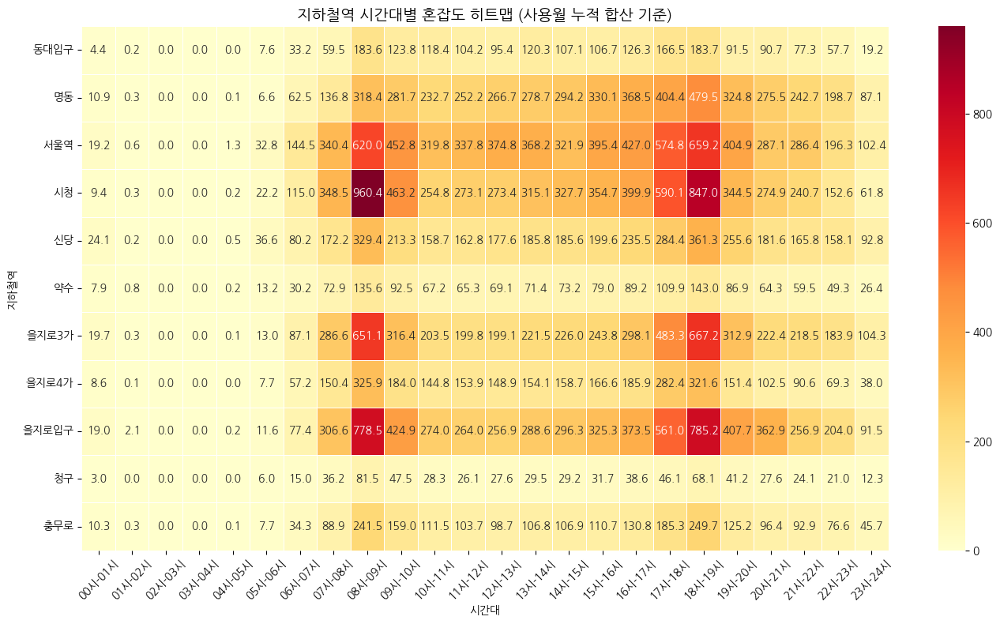

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.font_manager as fm

# ✅ 나눔고딕 설치 확인 및 설정
for font in fm.findSystemFonts(fontpaths=None, fontext='ttf'):
    if 'NanumGothic' in font:
        print("✅ 나눔고딕 설치됨:", font)

plt.rc('font', family='NanumGothic')
plt.rcParams['axes.unicode_minus'] = False

# ✅ CSV 파일 불러오기 (경로는 상황에 맞게 수정하세요)
df = pd.read_csv("/content/drive/MyDrive/빅데이터처리/혼잡도구함.csv")

# ✅ 불필요한 열 제거 및 지하철역 기준 합산
df = df.loc[:, ~df.columns.str.contains('^Unnamed')]  # 'Unnamed' 열 제거
df_grouped = df.drop(columns=['사용월'], errors='ignore')  # 사용월 제거
df_grouped = df_grouped.groupby('지하철역', as_index=False).sum(numeric_only=True)

# ✅ 히트맵 시각화
plt.figure(figsize=(14, 8))
sns.heatmap(df_grouped.set_index("지하철역"),
            annot=True, fmt=".1f", cmap='YlOrRd', linewidths=0.5)

plt.title("지하철역 시간대별 혼잡도 히트맵 (사용월 누적 합산 기준)", fontsize=14)
plt.xlabel("시간대")
plt.ylabel("지하철역")
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()


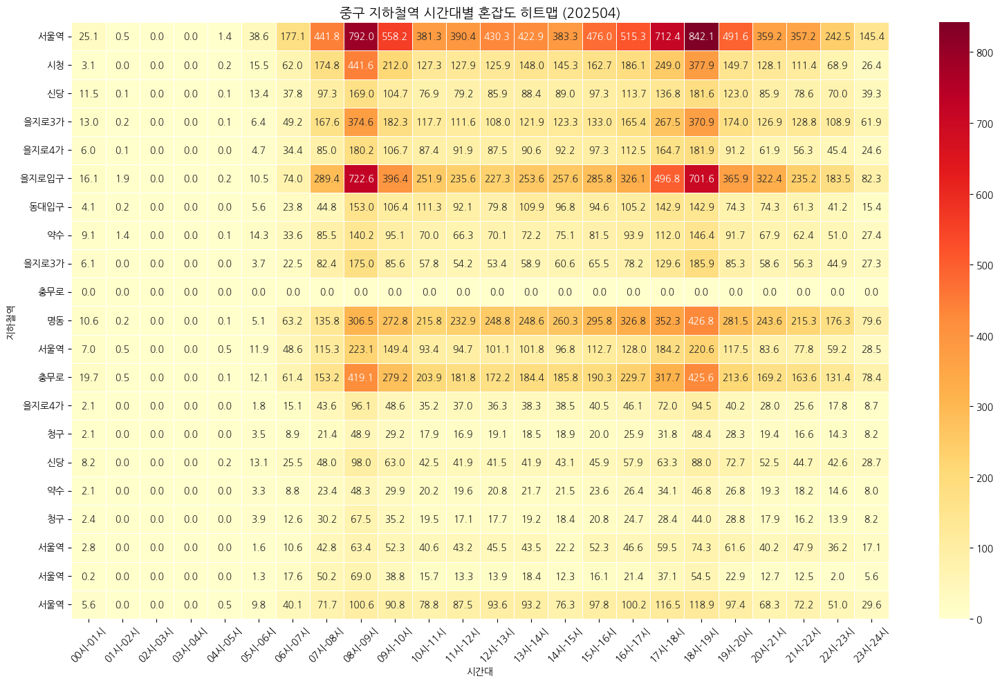

In [ ]:

###중구 지하철 역 혼잡도 #######

# 라이브러리
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# 엑셀 파일 불러오기 (Colab에 먼저 업로드해야 함)
df = pd.read_excel('/content/sample_data/중구내역_시간대별_혼잡도_최종.xlsx')

# 시간대 컬럼만 추출
time_columns = [col for col in df.columns if '시-' in col or '시' in col]

# 원하는 월 기준 (예: 최신 월만 보기)
df_latest = df[df['사용월'] == df['사용월'].max()]

# 역 이름을 index로 하고 시간대를 column으로 피벗
df_heatmap = df_latest.set_index('지하철역')[time_columns]

# 시각화: 히트맵
plt.figure(figsize=(16, 10))
sns.heatmap(df_heatmap, annot=True, fmt=".1f", cmap='YlOrRd', linewidths=0.5)

plt.title(f"중구 지하철역 시간대별 혼잡도 히트맵 ({int(df_latest['사용월'].max())})", fontsize=14)
plt.xlabel("시간대")
plt.ylabel("지하철역")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [ ]:
# ✅ 1. 필수 라이브러리 설치 및 한글 폰트 설정
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
import seaborn as sns
import pandas as pd

# 한글 폰트 설치 (Colab 전용)
!apt-get -qq install -y fonts-nanum

# 런타임 재시작 없이 폰트 적용
plt.rc('font', family='NanumGothic')
plt.rcParams['axes.unicode_minus'] = False

# ✅ 2. 엑셀 파일 불러오기
# 파일을 Colab에 먼저 업로드해야 함 (예: 파일명: 중구내역_시간대별_혼잡도_최종.xlsx)
df = pd.read_excel('/content/중구내역_시간대별_혼잡도_최종.xlsx')

# ✅ 3. 시간대 컬럼만 추출
time_columns = [col for col in df.columns if '시-' in col or '시' in col]

# ✅ 4. 가장 최근 사용월 기준 데이터 필터링
df_latest = df[df['사용월'] == df['사용월'].max()]

# ✅ 5. 피벗 형태로 변환 (역 이름을 index로)
df_heatmap = df_latest.set_index('지하철역')[time_columns]

# ✅ 6. 히트맵 시각화
plt.figure(figsize=(16, 10))
sns.heatmap(df_heatmap, annot=True, fmt=".1f", cmap='YlOrRd', linewidths=0.5)

plt.title(f"중구 지하철역 시간대별 혼잡도 히트맵 ({int(df_latest['사용월'].max())})", fontsize=14)
plt.xlabel("시간대")
plt.ylabel("지하철역")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [ ]:
# 필수 라이브러리 설치 (처음 한 번만)
!pip install folium

import folium
import pandas as pd
import json

# ✅ 혼잡도 데이터 준비 (자치구 이름과 혼잡도)
data = pd.DataFrame({
    'name': ['중구', '강남구'],
    '혼잡도': [65, 300]  # 예시값, 실제 평균 혼잡도에 맞게 수정 가능
})

# ✅ GeoJSON 파일 경로 (Colab에서 업로드한 파일 기준)
geojson_path = '/content/drive/MyDrive/빅데이터처리/seoul_municipalities_geo.json'

# GeoJSON 불러오기
with open(geojson_path, encoding='utf-8') as f:
    seoul_geo = json.load(f)

# ✅ 지도 생성
m = folium.Map(location=[37.5665, 126.9780], zoom_start=11)

# Choropleth 레이어 추가
folium.Choropleth(
    geo_data=seoul_geo,
    data=data,
    columns=['name', '혼잡도'],
    key_on='feature.properties.name',
    fill_color='YlOrRd',
    fill_opacity=0.7,
    line_opacity=0.3,
    legend_name='자치구 평균 혼잡도'
).add_to(m)

# 혼잡도 수치를 팝업으로 표시
for _, row in data.iterrows():
    folium.Marker(
        location=[37.5665 + (0.01 if row['name'] == '강남구' else -0.01), 126.9780],
        popup=f"{row['name']} 혼잡도: {row['혼잡도']:.1f}",
        icon=folium.Icon(color='red' if row['name'] == '강남구' else 'blue')
    ).add_to(m)

# ✅ 지도 출력
m.save('seoul_congestion_map.html')
m


In [ ]:
# ✅ 설치 (처음 한 번만)
!pip install folium

# ✅ 라이브러리 불러오기
import pandas as pd
import folium
import json

# ✅ 혼잡도 데이터 (자치구 기준)
data = pd.DataFrame({
    'name': ['중구', '강남구'],
    '혼잡도': [65, 300]  # 실제 평균 혼잡도 값으로 수정 가능
})

# ✅ Google Drive 마운트 (한 번만 실행)
from google.colab import drive
drive.mount('/content/drive')

# ✅ GeoJSON 파일 경로 (Google Drive에 업로드한 경우)
geojson_path = "/content/drive/MyDrive/빅데이터처리/seoul_municipalities_geo.json"

# ✅ 지하철역 위치 데이터 경로
station_path = "/content/drive/MyDrive/빅데이터처리/지하철역_GEOM (역사마스터).csv"

# ✅ GeoJSON 파일 로드
with open(geojson_path, encoding='utf-8') as f:
    seoul_geo = json.load(f)

# ✅ 지하철역 데이터 불러오기
df_stations = pd.read_csv(station_path, encoding='utf-8')

# ✅ 강남구 + 중구 주요 지하철역
target_stations = [
    '강남', '역삼', '삼성', '선릉', '신논현', '언주', '도곡', '매봉', '양재',
    '학여울', '대치', '개포동', '구룡', '일원', '수서', '청담', '봉은사', '한티',
    '서울역', '회현', '명동', '충무로', '을지로3가', '을지로4가',
    '동대문역사문화공원', '신당', '약수', '버티고개', '청구'
]
df_filtered = df_stations[df_stations['역한글명칭'].isin(target_stations)]

# ✅ 자치구 중심 좌표
gu_centers = {
    '강남구': [37.517236, 127.047325],
    '중구': [37.563757, 126.997833]
}

# ✅ 지도 생성
m = folium.Map(location=[37.5665, 126.9780], zoom_start=11)

# ✅ 혼잡도 색상 지도
folium.Choropleth(
    geo_data=seoul_geo,
    data=data,
    columns=['name', '혼잡도'],
    key_on='feature.properties.name',
    fill_color='YlOrRd',
    fill_opacity=0.7,
    line_opacity=0.3,
    legend_name='자치구 평균 혼잡도'
).add_to(m)

# ✅ 혼잡도 마커
for _, row in data.iterrows():
    gu_name = row['name']
    if gu_name in gu_centers:
        folium.Marker(
            location=gu_centers[gu_name],
            popup=f"{gu_name} 혼잡도: {row['혼잡도']:.1f}",
            icon=folium.Icon(color='red' if gu_name == '강남구' else 'blue')
        ).add_to(m)

# ✅ 지하철역 마커
for _, row in df_filtered.iterrows():
    folium.Marker(
        location=[row['환승역Y좌표'], row['환승역X좌표']],
        popup=row['역한글명칭'],
        icon=folium.Icon(color='green', icon='train', prefix='fa')
    ).add_to(m)

# ✅ 지도 저장 및 출력
m.save("/content/seoul_congestion_with_stations.html")
m


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


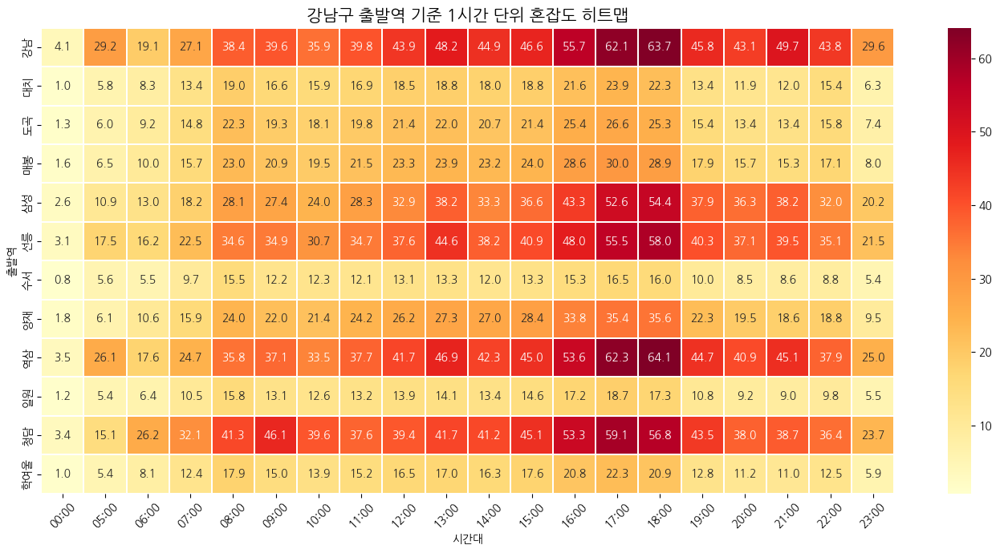

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


# 한글 폰트 설치 (Colab 전용)
!apt-get -qq install -y fonts-nanum

# 런타임 재시작 없이 폰트 적용
plt.rc('font', family='NanumGothic')
plt.rcParams['axes.unicode_minus'] = False

# 데이터 불러오기
df = pd.read_excel("/content/drive/MyDrive/빅데이터처리/honjap.xlsx")

# 강남구 지하철역 목록
gangnam_station_list = [
    '강남', '역삼', '삼성', '선릉', '신논현', '언주', '도곡', '매봉', '양재',
    '학여울', '대치', '개포동', '구룡', '일원', '수서', '청담', '봉은사', '한티'
]

# 강남구 역 필터링
df_gangnam = df[df['출발역'].isin(gangnam_station_list)].copy()

# 30분 단위 열 이름 필터링
time_columns = [col for col in df_gangnam.columns if re.match(r'^\d{1,2}시\d{2}분$', col)]

# 시간대별 그룹핑 (예: 08시00분, 08시30분 → 08:00)
hourly_groups = {}
for col in time_columns:
    hour = col[:col.index('시')].zfill(2) + ":00"
    hourly_groups.setdefault(hour, []).append(col)

# 시간대별 평균 혼잡도 계산
df_hourly = df_gangnam[['출발역']].copy()
for hour, cols in hourly_groups.items():
    df_numeric = df_gangnam[cols].apply(pd.to_numeric, errors='coerce')
    df_hourly[hour] = df_numeric.mean(axis=1)

# 히트맵용 데이터 변환
df_heatmap = df_hourly.melt(id_vars=["출발역"], var_name="시간대", value_name="혼잡도")
df_heatmap = df_heatmap.dropna(subset=['혼잡도'])

# ✅ 중복 제거: 출발역-시간대별 평균 혼잡도 계산
df_grouped = df_heatmap.groupby(['출발역', '시간대'])['혼잡도'].mean().reset_index()

# ✅ 피벗 테이블 생성
pivot_table = df_grouped.pivot(index="출발역", columns="시간대", values="혼잡도")

# ✅ 시간대 정렬
pivot_table = pivot_table[sorted(pivot_table.columns, key=lambda x: int(x.split(":")[0]))]

# ✅ 히트맵 시각화
plt.figure(figsize=(14, 7))
sns.heatmap(pivot_table, cmap="YlOrRd", linewidths=0.3, annot=True, fmt=".1f")
plt.title("강남구 출발역 기준 1시간 단위 혼잡도 히트맵", fontsize=15)
plt.xlabel("시간대")
plt.ylabel("출발역")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [ ]:
# ✅ 1. 설치
!pip install folium openpyxl
!apt-get -qq install -y fonts-nanum

# ✅ 2. 라이브러리 로딩 및 한글 폰트 강제 등록
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
import pandas as pd
import seaborn as sns
import folium
import json
import re
import base64
import os
from folium import IFrame

# ✅ 나눔고딕 폰트 강제 등록
font_path = '/usr/share/fonts/truetype/nanum/NanumGothic.ttf'
font_prop = fm.FontProperties(fname=font_path)
plt.rcParams['axes.unicode_minus'] = False

# ✅ 3. 구글 드라이브 마운트
from google.colab import drive
drive.mount('/content/drive')

# ✅ 4. 경로 설정
excel_path = "/content/drive/MyDrive/빅데이터처리/honjap.xlsx"
station_path = "/content/drive/MyDrive/빅데이터처리/지하철역_GEOM (역사마스터).csv"
geojson_path = "/content/drive/MyDrive/빅데이터처리/seoul_municipalities_geo.json"

# ✅ 5. 데이터 불러오기
df = pd.read_excel(excel_path)
df_stations = pd.read_csv(station_path, encoding='utf-8')
with open(geojson_path, encoding='utf-8') as f:
    seoul_geo = json.load(f)

# ✅ 6. 대상 역 설정
gangnam_station_list = [
    '강남', '역삼', '삼성', '선릉', '신논현', '언주', '도곡', '매봉', '양재',
    '학여울', '대치', '개포동', '구룡', '일원', '수서', '청담', '봉은사', '한티'
]
junggu_station_list = [
    '서울역', '회현', '명동', '충무로', '을지로3가', '을지로4가',
    '동대문역사문화공원', '신당', '약수', '버티고개', '청구'
]
total_stations = sorted(set(gangnam_station_list + junggu_station_list))
df_selected = df[df['출발역'].isin(total_stations)].copy()

# ✅ 7. 시간 열 정리 및 평균 혼잡도 계산
time_columns = [col for col in df_selected.columns if re.match(r'^\d{1,2}시\d{2}분$', col)]
hourly_groups = {}
for col in time_columns:
    hour = col[:col.index('시')].zfill(2) + ":00"
    hourly_groups.setdefault(hour, []).append(col)

df_hourly = df_selected[['출발역']].copy()
for hour, cols in hourly_groups.items():
    df_numeric = df_selected[cols].apply(pd.to_numeric, errors='coerce')
    df_hourly[hour] = df_numeric.mean(axis=1)

df_melted = df_hourly.melt(id_vars=["출발역"], var_name="시간대", value_name="혼잡도").dropna()
df_grouped = df_melted.groupby(['출발역', '시간대'])['혼잡도'].mean().reset_index()
pivot_table = df_grouped.pivot(index="출발역", columns="시간대", values="혼잡도")

# ✅ 8. 좌표 결합
df_geo = df_stations[df_stations['역한글명칭'].isin(pivot_table.index)]

# ✅ 9. 히트맵 저장 (FontProperties 사용)
heatmap_dir = "/content/station_heatmaps"
os.makedirs(heatmap_dir, exist_ok=True)

for station in pivot_table.index:
    station_data = pivot_table.loc[station].dropna()
    station_df = pd.DataFrame(station_data).T
    station_df.index = [station]

    plt.figure(figsize=(10, 1.5))
    sns.heatmap(
        station_df, annot=True, fmt=".1f", cmap="YlOrRd",
        cbar=True, linewidths=0.3,
        xticklabels=station_df.columns,
        yticklabels=station_df.index
    )
    plt.title(f"{station} 히트맵", fontproperties=font_prop, fontsize=14)
    plt.xlabel("시간대", fontproperties=font_prop)
    plt.ylabel("혼잡도", fontproperties=font_prop)
    plt.xticks(fontproperties=font_prop, rotation=45)
    plt.yticks(fontproperties=font_prop)
    plt.tight_layout()
    plt.savefig(os.path.join(heatmap_dir, f"{station}_heatmap.png"))
    plt.close()

# ✅ 10. 평균 혼잡도 → 색상 분류
station_mean = df_grouped.groupby('출발역')['혼잡도'].mean()
color_bins = pd.qcut(station_mean, q=3, labels=['green', 'orange', 'red'])

# ✅ 11. 자치구 평균 혼잡도 계산
district_avg = pd.DataFrame({
    'name': ['강남구', '중구'],
    '혼잡도': [
        station_mean[station_mean.index.isin(gangnam_station_list)].mean(),
        station_mean[station_mean.index.isin(junggu_station_list)].mean()
    ]
})

# ✅ 12. 지도 생성
m = folium.Map(location=[37.5665, 126.9780], zoom_start=12)
folium.Choropleth(
    geo_data=seoul_geo,
    data=district_avg,
    columns=['name', '혼잡도'],
    key_on='feature.properties.name',
    fill_color='YlOrRd',
    fill_opacity=0.6,
    line_opacity=0.2,
    legend_name='자치구 평균 혼잡도'
).add_to(m)

# ✅ 13. 마커 + 이미지 팝업
for _, row in df_geo.iterrows():
    station = row['역한글명칭']
    color = color_bins.get(station, 'blue')
    image_path = f"{heatmap_dir}/{station}_heatmap.png"
    try:
        with open(image_path, 'rb') as img_file:
            encoded = base64.b64encode(img_file.read()).decode('utf-8')
        html = f"""
        <div style="text-align:center;">
            <h4 style="margin-bottom:8px;">{station} 히트맵</h4>
            <img src="data:image/png;base64,{encoded}" style="width:400px; border:1px solid gray;"/>
        </div>
        """
    except FileNotFoundError:
        html = f"{station} 히트맵 이미지 없음"

    iframe = IFrame(html, width=420, height=240)
    popup = folium.Popup(iframe, max_width=450)
    folium.Marker(
        location=[row['환승역Y좌표'], row['환승역X좌표']],
        popup=popup,
        icon=folium.Icon(color=color, icon='info-sign')
    ).add_to(m)

# ✅ 14. 지도 표시
m


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


/usr/local/lib/python3.11/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 44053 (\N{HANGUL SYLLABLE GANG}) missing from font(s) DejaVu Sans.
  fig.canvas.draw()
/usr/local/lib/python3.11/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 45224 (\N{HANGUL SYLLABLE NAM}) missing from font(s) DejaVu Sans.
  fig.canvas.draw()
/usr/local/lib/python3.11/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 45824 (\N{HANGUL SYLLABLE DAE}) missing from font(s) DejaVu Sans.
  fig.canvas.draw()
/usr/local/lib/python3.11/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 52824 (\N{HANGUL SYLLABLE CI}) missing from font(s) DejaVu Sans.
  fig.canvas.draw()
/usr/local/lib/python3.11/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 46020 (\N{HANGUL SYLLABLE DO}) missing from font(s) DejaVu Sans.
  fig.canvas.draw()
/usr/local/lib/python3.11/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 44257 (\N{HANGUL SYLLABLE GOG}) missing from font(s) DejaVu Sans.
  fig.canvas.draw()
/usr/

It is strongly recommended to use Async PRAW: https://asyncpraw.readthedocs.io.
See https://praw.readthedocs.io/en/latest/getting_started/multiple_instances.html#discord-bots-and-asynchronous-environments for more info.

It is strongly recommended to use Async PRAW: https://asyncpraw.readthedocs.io.
See https://praw.readthedocs.io/en/latest/getting_started/multiple_instances.html#discord-bots-and-asynchronous-environments for more info.

It is strongly recommended to use Async PRAW: https://asyncpraw.readthedocs.io.
See https://praw.readthedocs.io/en/latest/getting_started/multiple_instances.html#discord-bots-and-asynchronous-environments for more info.

It is strongly recommended to use Async PRAW: https://asyncpraw.readthedocs.io.
See https://praw.readthedocs.io/en/latest/getting_started/multiple_instances.html#discord-bots-and-asynchronous-environments for more info.

It is strongly recommended to use Async PRAW: https://asyncpraw.readthedocs.io.
See https://praw.readthedocs.io/en/l

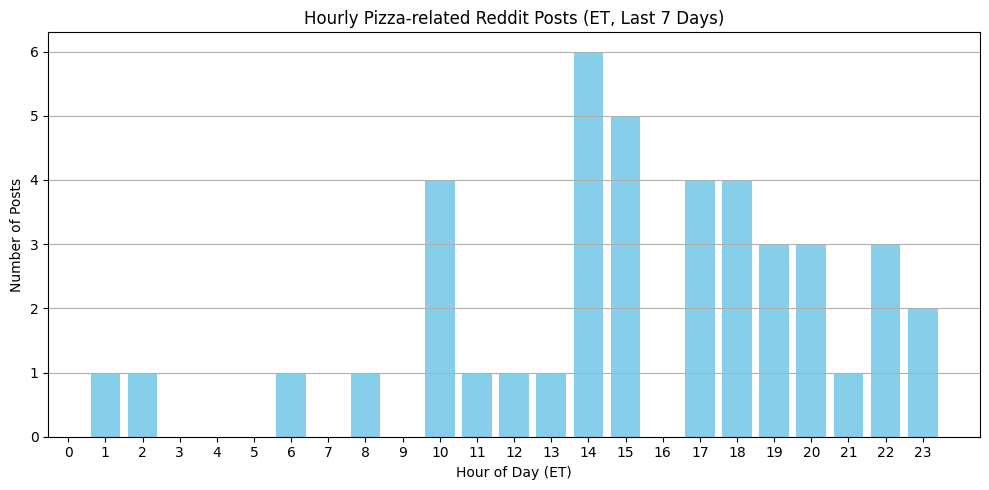

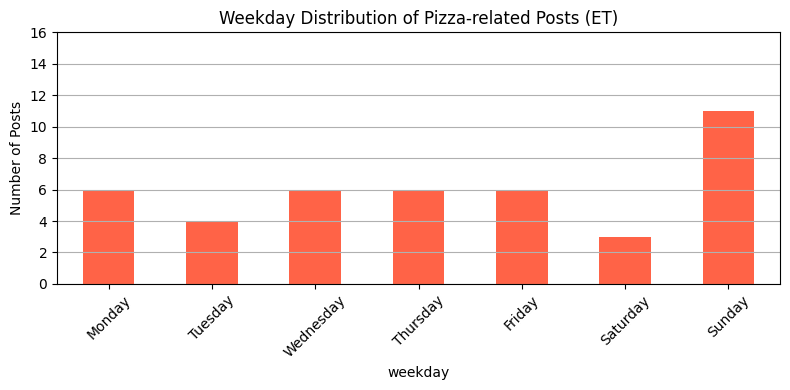

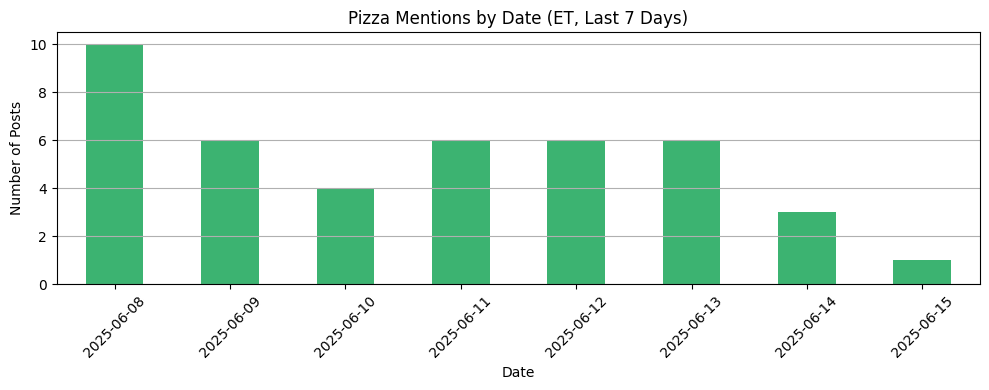

,created_et,date,hour,weekday,title,score
0,2025-06-15 01:13:39,2025-06-15,1,Sunday,Made ([homemade] technically) ham and pepper j...,3
38,2025-06-14 23:44:57,2025-06-14,23,Saturday,Can anyone explain fire safety in newer buildi...,0
1,2025-06-14 22:42:39,2025-06-14,22,Saturday,[Homemade] Grandma's S'mores pizza,111
2,2025-06-14 17:59:54,2025-06-14,17,Saturday,Made [homemade] pizza for the first time.,281
3,2025-06-13 20:37:11,2025-06-13,20,Friday,[Homemade] Pizza oven pizza. Under the mozzare...,38
4,2025-06-13 20:18:26,2025-06-13,20,Friday,"[I Ate] A slice of prosciutto, mushroom & red ...",19
35,2025-06-13 17:00:17,2025-06-13,17,Friday,Pentagon pizza monitor predicted ‘busy night’ ...,1814
34,2025-06-13 17:00:17,2025-06-13,17,Friday,Pentagon pizza monitor predicted ‘busy night’ ...,1810
5,2025-06-13 14:01:13,2025-06-13,14,Friday,[homemade] grilled bbq chicken pizza and sausa...,193
6,2025-06-13 06:17:52,2025-06-13,6,Friday,[homemade] pizza,150


In [ ]:
# 1. 필수 라이브러리 설치
!pip install praw pytz

# 2. 라이브러리 임포트
import praw
import pandas as pd
from datetime import datetime, timedelta
import pytz
import matplotlib.pyplot as plt

# 3. Reddit API 인증 정보
reddit = praw.Reddit(
    client_id="pM5nfe_RlTCTmx604p0V7w",
    client_secret="ZP3Rz53vcbDesrrs-XeAV-apMsm4bA",
    user_agent="pizza analysis"
)

# 4. 키워드 및 서브레딧 설정
keywords = ["pizza", "order pizza", "late night pizza", "best pizza"]
subreddits = ["food", "newyorkcity", "washingtondc", "AskNYC", "nyc", "arlingtonva", "nova", "foodporn"]

# 5. 시간 설정 (미국 동부 기준)
et = pytz.timezone('US/Eastern')
now_et = datetime.now(et)
week_ago_et = now_et - timedelta(days=7)

# 6. 데이터 수집
data = []

for sub in subreddits:
    for keyword in keywords:
        for submission in reddit.subreddit(sub).search(keyword, sort='new', limit=100):
            utc_time = datetime.utcfromtimestamp(submission.created_utc).replace(tzinfo=pytz.utc)
            et_time = utc_time.astimezone(et)
            if et_time >= week_ago_et:
                data.append({
                    'title': submission.title,
                    'date': et_time.date().isoformat(),  # 날짜 추가
                    'hour': et_time.hour,
                    'weekday': et_time.strftime('%A'),
                    'created_et': et_time.strftime('%Y-%m-%d %H:%M:%S'),
                    'url': submission.url,
                    'score': submission.score
                })

# 7. DataFrame 생성 및 확인
df = pd.DataFrame(data)
df = df.sort_values("created_et", ascending=False)

# 8. 시간대별 그래프 (ET 기준)
hourly_counts = df['hour'].value_counts().sort_index()

plt.figure(figsize=(10, 5))
plt.bar(hourly_counts.index, hourly_counts.values, color='skyblue')
plt.title("Hourly Pizza-related Reddit Posts (ET, Last 7 Days)")
plt.xlabel("Hour of Day (ET)")
plt.ylabel("Number of Posts")
plt.xticks(range(0, 24))
plt.grid(axis='y')
plt.tight_layout()
plt.show()

# 9. 요일별 그래프
weekday_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
weekday_counts = df['weekday'].value_counts().reindex(weekday_order)

plt.figure(figsize=(8, 4))
weekday_counts.plot(kind='bar', color='tomato')
plt.title("Weekday Distribution of Pizza-related Posts (ET)")
plt.ylabel("Number of Posts")
plt.xticks(rotation=45)
plt.ylim(0, weekday_counts.max() + 5)
plt.grid(axis='y')
plt.tight_layout()
plt.show()

# 10. 날짜별 트렌드 그래프
date_counts = df['date'].value_counts().sort_index()

plt.figure(figsize=(10, 4))
date_counts.plot(kind='bar', color='mediumseagreen')
plt.title("Pizza Mentions by Date (ET, Last 7 Days)")
plt.xlabel("Date")
plt.ylabel("Number of Posts")
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.tight_layout()
plt.show()

# 11. 데이터 미리보기
df[['created_et', 'date', 'hour', 'weekday', 'title', 'score']].head(10)


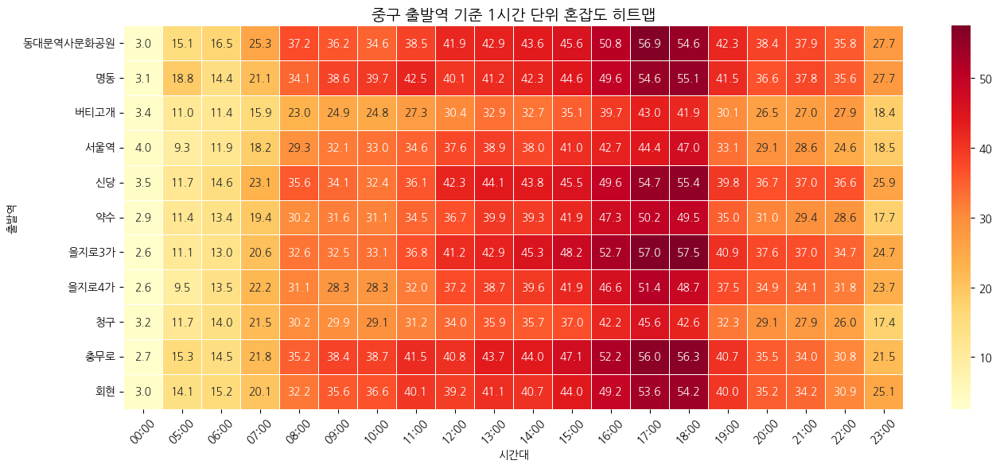

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import re

# 한글 폰트 설치 (Colab 전용)
!apt-get -qq install -y fonts-nanum

# 런타임 재시작 없이 폰트 적용
plt.rc('font', family='NanumGothic')
plt.rcParams['axes.unicode_minus'] = False

# ✅ 엑셀 파일 로드
df = pd.read_excel("/content/drive/MyDrive/빅데이터처리/honjap.xlsx")  # 파일명 바꿔도 됨

# ✅ 중구에 있는 출발역 리스트
junggu_station_list = [
    '서울역', '회현', '명동', '충무로', '을지로3가', '을지로4가',
    '동대문역사문화공원', '신당', '약수', '버티고개', '청구'
]

# ✅ 중구 출발역만 추출
df_junggu = df[df['출발역'].isin(junggu_station_list)].copy()

# ✅ 시간대 열 추출 (예: '08시30분' 같은 열)
time_columns = [col for col in df_junggu.columns if re.match(r'^\d{1,2}시\d{2}분$', col)]

# ✅ 1시간 단위로 묶기
hourly_groups = {}
for col in time_columns:
    hour = col[:col.index('시')].zfill(2) + ":00"  # '8시30분' → '08:00'
    hourly_groups.setdefault(hour, []).append(col)

# ✅ 숫자형으로 변환 후 평균 혼잡도 계산
df_hourly = df_junggu[['출발역']].copy()
for hour, cols in hourly_groups.items():
    df_numeric = df_junggu[cols].apply(pd.to_numeric, errors='coerce')
    df_hourly[hour] = df_numeric.mean(axis=1)

# ✅ melt 후 평균 혼잡도 계산
df_melted = df_hourly.melt(id_vars=["출발역"], var_name="시간대", value_name="혼잡도")
df_melted = df_melted.dropna(subset=['혼잡도'])

# ✅ 중복 제거 후 피벗
df_grouped = df_melted.groupby(['출발역', '시간대'])['혼잡도'].mean().reset_index()
pivot_table = df_grouped.pivot(index="출발역", columns="시간대", values="혼잡도")

# ✅ 시간대 정렬
pivot_table = pivot_table[sorted(pivot_table.columns, key=lambda x: int(x.split(":")[0]))]

# ✅ 히트맵 시각화
plt.figure(figsize=(14, 6))
sns.heatmap(pivot_table, cmap="YlOrRd", linewidths=0.5, annot=True, fmt=".1f")
plt.title("중구 출발역 기준 1시간 단위 혼잡도 히트맵", fontsize=14)
plt.xlabel("시간대")
plt.ylabel("출발역")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [ ]:
#####################전처리 코드################

import pandas as pd

# 파일 업로드
from google.colab import files
uploaded = files.upload()

# CSV 파일 불러오기
df_passenger = pd.read_csv("/content/sample_data/시간별 승 하차 인원.csv", encoding='cp949')

# 대상 설정
target_months = [f"2024{str(m).zfill(2)}" for m in range(6, 13)] + [f"2025{str(m).zfill(2)}" for m in range(1, 5)]
target_months = list(map(int, target_months))
target_stations = [
    '충정로', '서울역', '회현', '시청', '을지로입구', '을지로3가', '을지로4가',
    '명동', '충무로', '동대입구', '약수', '동대문역사문화공원', '신당', '청구'
]

# melt 처리
time_columns = [col for col in df_passenger.columns if '승차' in col or '하차' in col]
df_long = df_passenger.melt(
    id_vars=['사용월', '호선명', '지하철역'],
    value_vars=time_columns,
    var_name='시간대',
    value_name='인원수'
)
df_long['시간대'] = df_long['시간대'].str.replace(' 승차인원', '', regex=False)
df_long['시간대'] = df_long['시간대'].str.replace(' 하차인원', '', regex=False)

# 필터링
df_filtered = df_long[
    (df_long['사용월'].isin(target_months)) &
    (df_long['지하철역'].isin(target_stations))
]

# 피벗 테이블
df_pivot = df_filtered.pivot_table(
    index=['사용월', '호선명', '지하철역'],
    columns='시간대',
    values='인원수',
    aggfunc='sum'
)

# 엑셀 저장
df_pivot.to_excel("중구_선택역_시청_1호선_포함_이용인원.xlsx")
files.download("중구_선택역_시청_1호선_포함_이용인원.xlsx")


Saving 시간별 승 하차 인원.csv to 시간별 승 하차 인원.csv


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

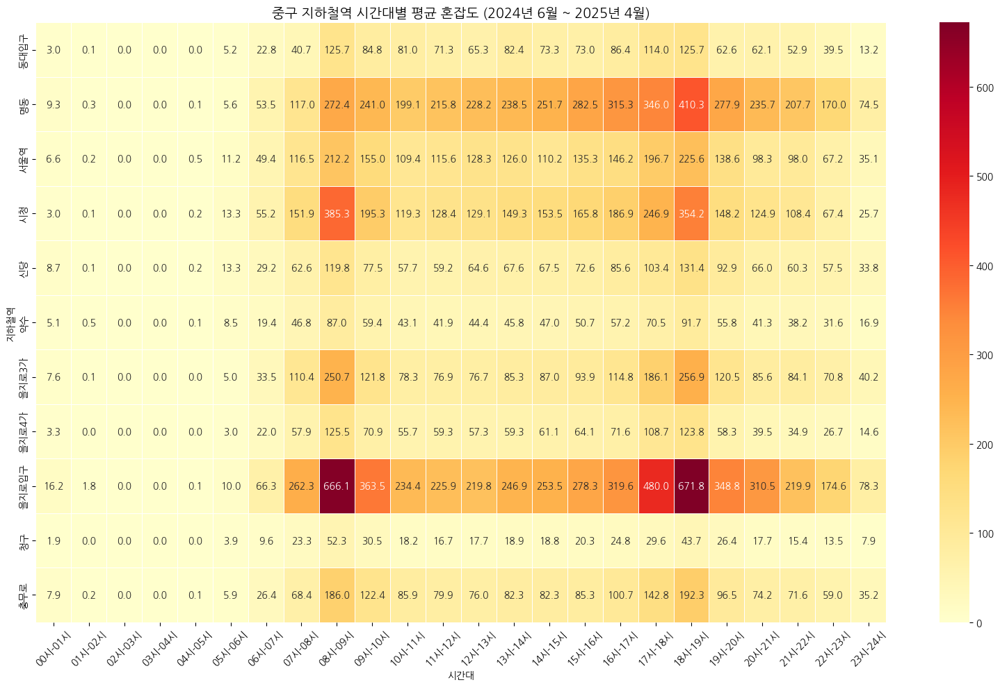

In [ ]:
# 라이브러리
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# 엑셀 파일 로드 (Colab에 업로드 먼저 해야 함)
df = pd.read_excel('/content/sample_data/중구내역_시간대별_혼잡도_최종.xlsx')

# 시간대 컬럼 추출
time_columns = [col for col in df.columns if '시-' in col or '시' in col]

# 필터: 202406 ~ 202504 월만 포함
df = df[df['사용월'].between(202406, 202504)]

# 월별 평균 → 역 기준으로 평균 혼잡도 계산
df_grouped = df.groupby('지하철역')[time_columns].mean()

# 히트맵 시각화
plt.figure(figsize=(16, 10))
sns.heatmap(df_grouped, annot=True, fmt=".1f", cmap='YlOrRd', linewidths=0.5)

plt.title("중구 지하철역 시간대별 평균 혼잡도 (2024년 6월 ~ 2025년 4월)", fontsize=14)
plt.xlabel("시간대")
plt.ylabel("지하철역")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [ ]:
# 필요한 라이브러리
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LinearRegression
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import matplotlib.font_manager as fm
import warnings

##warnings.filterwarnings("ignore")

# 나눔고딕 폰트 설정
for font in fm.findSystemFonts(fontpaths=None, fontext='ttf'):
    if 'NanumGothic' in font:
        plt.rc('font', family='NanumGothic')
        break
plt.rcParams['axes.unicode_minus'] = False

# ==== 혼잡도 예측 (선형 회귀) ====
def predict_congestion(df_honjap, station_name):
    time_cols = df_honjap.columns[6:-1]
    df_station = df_honjap[df_honjap['출발역'] == station_name]
    df_station['평균혼잡도'] = df_station[time_cols].mean(axis=1)

    X = np.arange(len(time_cols)).reshape(-1, 1)  # 시간대 인덱스
    y = df_station[time_cols].mean().values

    model = LinearRegression()
    model.fit(X, y)
    y_pred = model.predict(X)

    plt.figure(figsize=(10, 3))
    plt.plot(time_cols, y, label='실제 혼잡도', marker='o')
    plt.plot(time_cols, y_pred, label='예측 혼잡도', linestyle='--')
    plt.title(f"{station_name}역 시간대별 혼잡도 예측")
    plt.xticks(rotation=45)
    plt.legend()
    plt.tight_layout()
    plt.show()

    peak_index = np.argmax(y_pred)
    peak_time = time_cols[peak_index]
    print(f"🔮 예측: '{station_name}'역은 '{peak_time}' 시간대에 가장 혼잡할 것으로 예상됩니다.")

# ==== 군집화 (KMeans) ====
def cluster_congestion_patterns(df_honjap, station_name, n_clusters=3):
    time_cols = df_honjap.columns[6:-1]
    df_station = df_honjap[df_honjap['출발역'] == station_name]
    congestion_data = df_station[time_cols]

    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(congestion_data)

    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    df_station['패턴그룹'] = kmeans.fit_predict(scaled_data)

    print(f"📊 '{station_name}'역 군집화 결과 (도착역별 패턴 그룹):")
    print(df_station[['도착역', '패턴그룹']].head())

    return df_station[['도착역', '패턴그룹']]

# ==== 우회 추천 알고리즘 ====
def recommend_alternative(df_honjap, station_name, threshold=100):
    time_cols = df_honjap.columns[6:-1]
    df_station = df_honjap[df_honjap['출발역'] == station_name]
    avg_congestion = df_station[time_cols].mean()

    high_congestion_times = avg_congestion[avg_congestion > threshold]
    if high_congestion_times.empty:
        print(f"✅ '{station_name}'역은 전반적으로 우회가 필요 없는 수준입니다.")
    else:
        print(f"🚧 혼잡 시간대 (>{threshold}%): {', '.join(high_congestion_times.index)}")
        print("⏩ 추천: 해당 시간대를 피해서 다음 시간대에 방문하거나 인근 역 이용을 고려하세요.")

# === 메인 실행 함수 ===
def run_advanced_analysis(honjap_path, station_name):
    df_honjap = pd.read_excel(honjap_path, engine="openpyxl")

    print(f"\n🔮 [혼잡도 예측] - {station_name}역")
    predict_congestion(df_honjap, station_name)

    print(f"\n📊 [군집화 분석] - {station_name}역")
    cluster_congestion_patterns(df_honjap, station_name)

    print(f"\n⛔ [우회 추천] - {station_name}역")
    recommend_alternative(df_honjap, station_name)


In [ ]:
# 1단계: 나눔고딕 폰트 설치 및 캐시 초기화
!apt-get update -qq
!apt-get install -y fonts-nanum
!fc-cache -fv
!rm -rf ~/.cache/matplotlib  # 캐시 삭제

W: Skipping acquire of configured file 'main/source/Sources' as repository 'https://r2u.stat.illinois.edu/ubuntu jammy InRelease' does not seem to provide it (sources.list entry misspelt?)
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following NEW packages will be installed:
  fonts-nanum
0 upgraded, 1 newly installed, 0 to remove and 35 not upgraded.
Need to get 10.3 MB of archives.
After this operation, 34.1 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/universe amd64 fonts-nanum all 20200506-1 [10.3 MB]
Fetched 10.3 MB in 1s (12.7 MB/s)
Selecting previously unselected package fonts-nanum.
(Reading database ... 126111 files and directories currently installed.)
Preparing to unpack .../fonts-nanum_20200506-1_all.deb ...
Unpacking fonts-nanum (20200506-1) ...
Setting up fonts-nanum (20200506-1) ...
Processing triggers for fontconfig (2.13.1-4.2ubuntu5) ...
/usr/share/fonts: caching, new cac

✅ 나눔고딕 설치됨: /usr/share/fonts/truetype/nanum/NanumGothicBold.ttf
✅ 나눔고딕 설치됨: /usr/share/fonts/truetype/nanum/NanumGothicCodingBold.ttf
✅ 나눔고딕 설치됨: /usr/share/fonts/truetype/nanum/NanumGothicCoding.ttf
✅ 나눔고딕 설치됨: /usr/share/fonts/truetype/nanum/NanumGothic.ttf


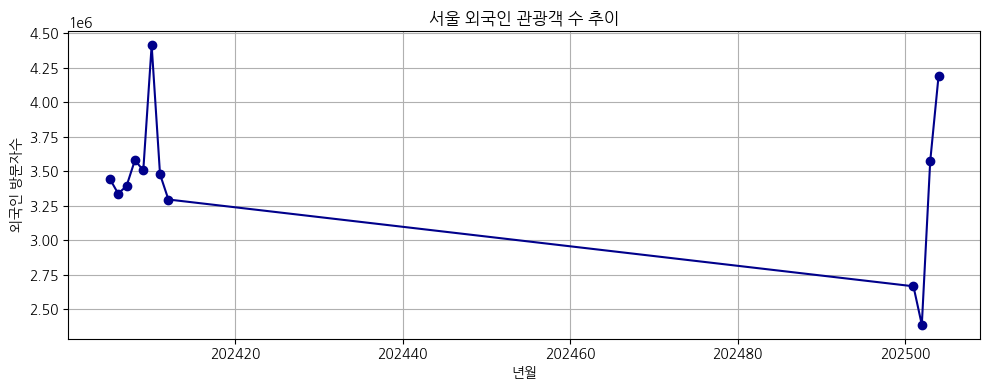


🔍 [관광지: 경복궁] → 지하철역: 경복궁 (3호선)


<ipython-input-2-4223401945>:61: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


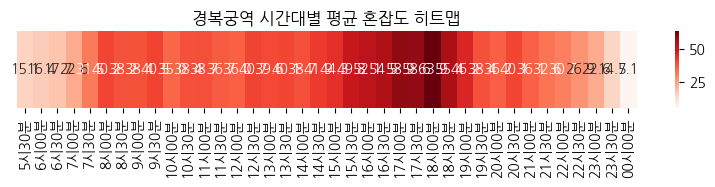

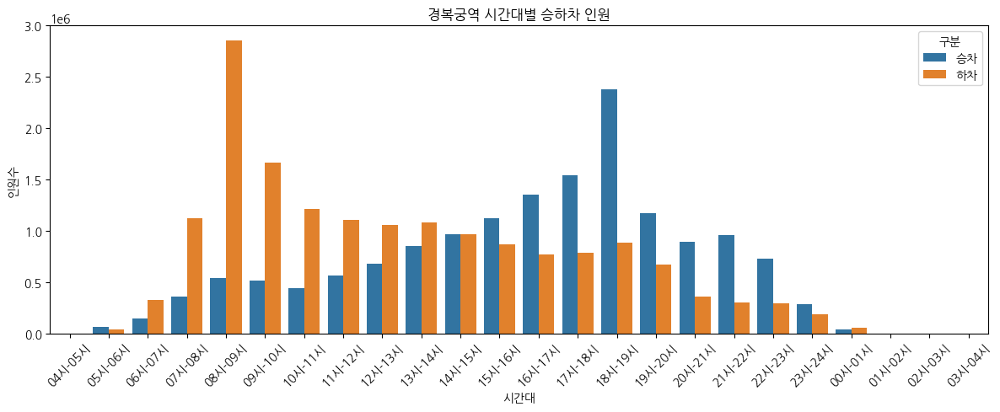

📢 경복궁역은 '18시00분'에 가장 혼잡합니다. 이 시간대를 피하거나 인근 역을 이용하세요.

🔍 [관광지: 남산타워] → 지하철역: 명동 (4호선)


<ipython-input-2-4223401945>:61: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


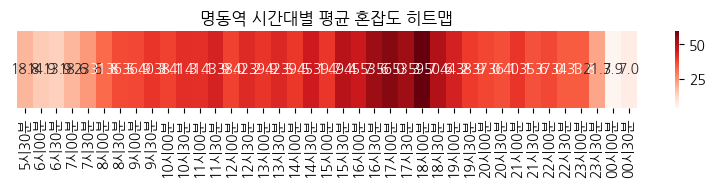

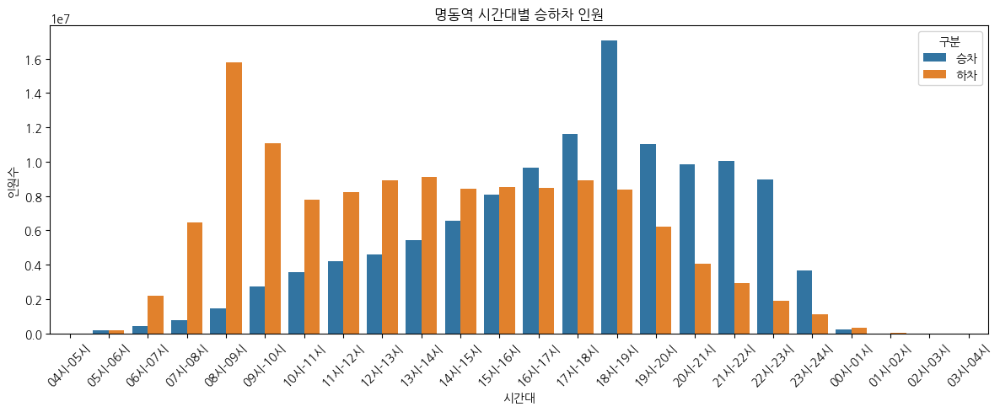

📢 명동역은 '18시00분'에 가장 혼잡합니다. 이 시간대를 피하거나 인근 역을 이용하세요.

🔍 [관광지: 명동거리] → 지하철역: 명동 (4호선)


<ipython-input-2-4223401945>:61: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


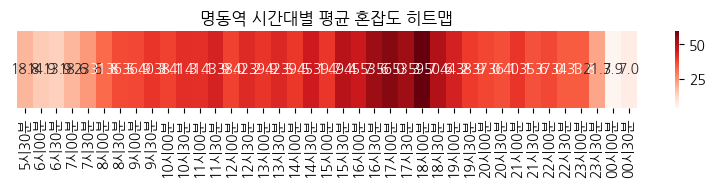

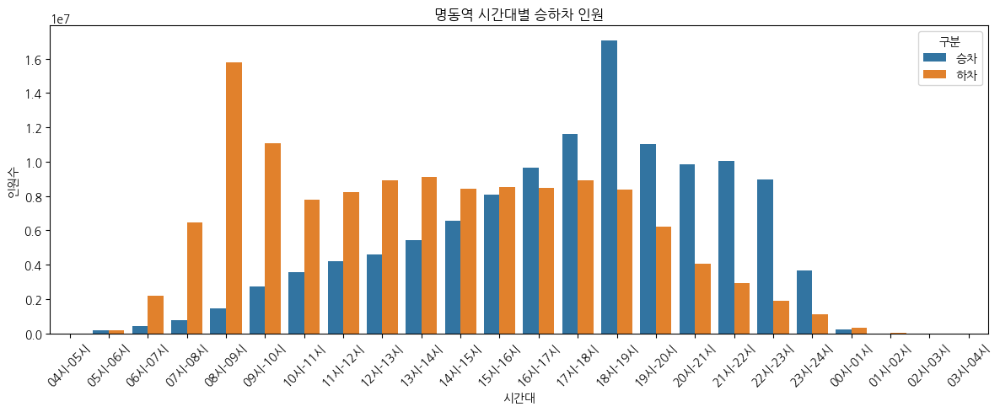

📢 명동역은 '18시00분'에 가장 혼잡합니다. 이 시간대를 피하거나 인근 역을 이용하세요.

🔍 [관광지: DDP] → 지하철역: 동대문역사문화공원 (2,4,5호선)


<ipython-input-2-4223401945>:61: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


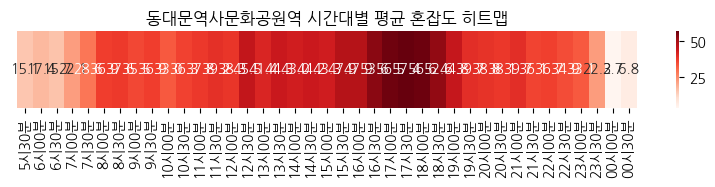

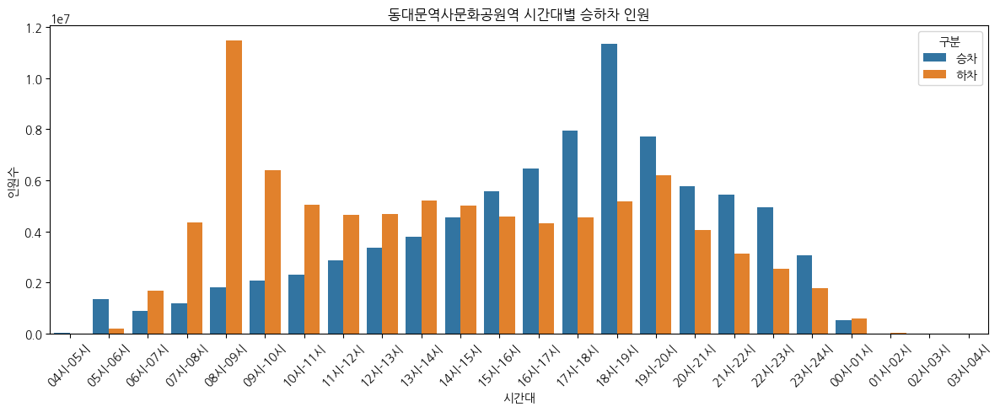

📢 동대문역사문화공원역은 '17시30분'에 가장 혼잡합니다. 이 시간대를 피하거나 인근 역을 이용하세요.

🔍 [관광지: 북촌한옥마을] → 지하철역: 안국 (3호선)


<ipython-input-2-4223401945>:61: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


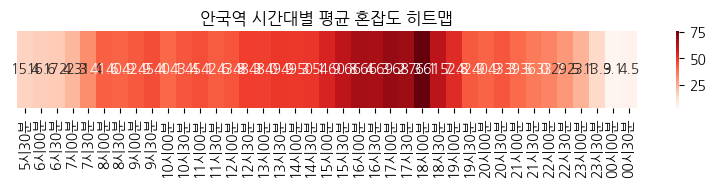

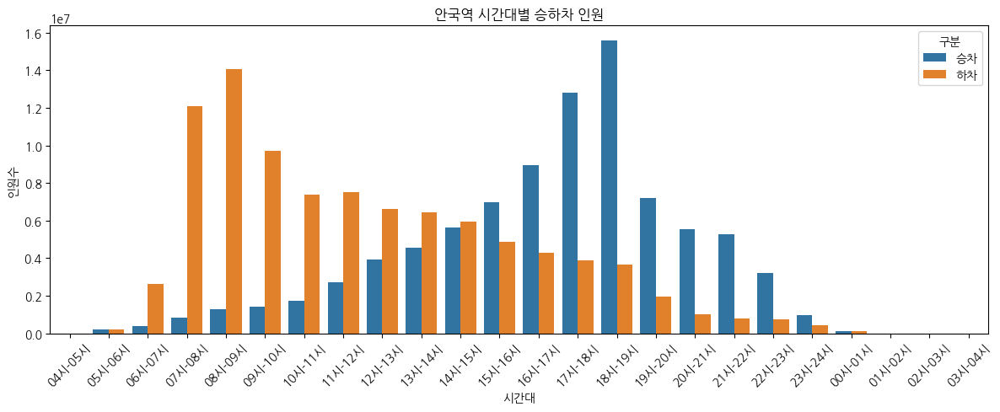

📢 안국역은 '18시00분'에 가장 혼잡합니다. 이 시간대를 피하거나 인근 역을 이용하세요.


In [ ]:
# 라이브러리 임포트
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.font_manager as fm

# 나눔고딕이 설치되어 있는지 확인
for font in fm.findSystemFonts(fontpaths=None, fontext='ttf'):
    if 'NanumGothic' in font:
        print("✅ 나눔고딕 설치됨:", font)

# 나눔고딕 폰트 설정
plt.rc('font', family='NanumGothic')
plt.rcParams['axes.unicode_minus'] = False

# 데이터 불러오기
df_honjap = pd.read_excel("/content/sample_data/honjap.xlsx", engine="openpyxl")
df_passenger = pd.read_csv("/content/sample_data/시간별 승 하차 인원.csv", encoding='cp949')
df_foreign = pd.read_csv("/content/sample_data/서울 외국인 방문자.csv", encoding='utf-8-sig')

# 관광지-역 매핑
tourist_spots = {
    "경복궁": {"역": "경복궁", "호선": "3호선"},
    "남산타워": {"역": "명동", "호선": "4호선"},
    "명동거리": {"역": "명동", "호선": "4호선"},
    "DDP": {"역": "동대문역사문화공원", "호선": "2,4,5호선"},
    "북촌한옥마을": {"역": "안국", "호선": "3호선"},
}

# 외국인 방문자 시각화
plt.figure(figsize=(10, 4))
plt.plot(df_foreign['날짜'], df_foreign['외국인 방문자수'], marker='o', color='darkblue')
plt.title("서울 외국인 관광객 수 추이")
plt.xlabel("년월")
plt.ylabel("외국인 방문자수")
plt.grid(True)
plt.tight_layout()
plt.show()

# 분석 함수
def analyze_station(station_name):
    time_cols = df_honjap.columns[6:-1]
    df_honjap['평균혼잡도'] = df_honjap[time_cols].mean(axis=1)
    congestion = df_honjap[df_honjap['출발역'] == station_name]
    avg_congestion = congestion[time_cols].mean().to_frame('혼잡도').reset_index()
    avg_congestion.columns = ['시간대', '혼잡도']

    passenger = df_passenger[df_passenger['지하철역'] == station_name]
    time_use_cols = [c for c in df_passenger.columns if '승차' in c or '하차' in c]
    passenger_sum = passenger[time_use_cols].sum().reset_index()
    passenger_sum.columns = ['시간대', '인원수']
    passenger_sum['구분'] = passenger_sum['시간대'].apply(lambda x: '승차' if '승차' in x else '하차')
    passenger_sum['시간대'] = passenger_sum['시간대'].str.extract(r'(\d+시-\d+시)')

    # 혼잡도 히트맵
    plt.figure(figsize=(10, 1))
    sns.heatmap([avg_congestion['혼잡도']], cmap='Reds', annot=True, fmt=".1f", xticklabels=avg_congestion['시간대'])
    plt.title(f"{station_name}역 시간대별 평균 혼잡도 히트맵")
    plt.yticks([])
    plt.tight_layout()
    plt.show()

    # 승하차 그래프
    plt.figure(figsize=(12, 5))
    sns.barplot(data=passenger_sum, x='시간대', y='인원수', hue='구분')
    plt.title(f"{station_name}역 시간대별 승하차 인원")
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

    # 자동 분석
    peak_times = avg_congestion[avg_congestion['혼잡도'] > avg_congestion['혼잡도'].mean() + 5]
    if not peak_times.empty:
        worst = peak_times.sort_values('혼잡도', ascending=False).iloc[0]
        print(f"📢 {station_name}역은 '{worst['시간대']}'에 가장 혼잡합니다. 이 시간대를 피하거나 인근 역을 이용하세요.")
    else:
        print(f"✅ {station_name}역은 전반적으로 혼잡도가 높지 않습니다.")

# 반복 실행
for name, info in tourist_spots.items():
    print(f"\n🔍 [관광지: {name}] → 지하철역: {info['역']} ({info['호선']})")
    analyze_station(info['역'])


In [ ]:
# 필요한 라이브러리
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LinearRegression
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import matplotlib.font_manager as fm
import warnings

warnings.filterwarnings("ignore")

# 나눔고딕 폰트 설정
for font in fm.findSystemFonts(fontpaths=None, fontext='ttf'):
    if 'NanumGothic' in font:
        plt.rc('font', family='NanumGothic')
        break
plt.rcParams['axes.unicode_minus'] = False

# ==== 혼잡도 예측 (선형 회귀) ====
def predict_congestion(df_honjap, station_name):
    time_cols = df_honjap.columns[6:-1]
    df_station = df_honjap[df_honjap['출발역'] == station_name]
    df_station['평균혼잡도'] = df_station[time_cols].mean(axis=1)

    X = np.arange(len(time_cols)).reshape(-1, 1)  # 시간대 인덱스
    y = df_station[time_cols].mean().values

    model = LinearRegression()
    model.fit(X, y)
    y_pred = model.predict(X)

    plt.figure(figsize=(10, 3))
    plt.plot(time_cols, y, label='실제 혼잡도', marker='o')
    plt.plot(time_cols, y_pred, label='예측 혼잡도', linestyle='--')
    plt.title(f"{station_name}역 시간대별 혼잡도 예측")
    plt.xticks(rotation=45)
    plt.legend()
    plt.tight_layout()
    plt.show()

    peak_index = np.argmax(y_pred)
    peak_time = time_cols[peak_index]
    print(f"🔮 예측: '{station_name}'역은 '{peak_time}' 시간대에 가장 혼잡할 것으로 예상됩니다.")

# ==== 군집화 (KMeans) ====
def cluster_congestion_patterns(df_honjap, station_name, n_clusters=3):
    time_cols = df_honjap.columns[6:-1]
    df_station = df_honjap[df_honjap['출발역'] == station_name]
    congestion_data = df_station[time_cols]

    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(congestion_data)

    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    df_station['패턴그룹'] = kmeans.fit_predict(scaled_data)

    print(f"📊 '{station_name}'역 군집화 결과 (도착역별 패턴 그룹):")
    print(df_station[['도착역', '패턴그룹']].head())

    return df_station[['도착역', '패턴그룹']]

# ==== 우회 추천 알고리즘 ====
def recommend_alternative(df_honjap, station_name, threshold=100):
    time_cols = df_honjap.columns[6:-1]
    df_station = df_honjap[df_honjap['출발역'] == station_name]
    avg_congestion = df_station[time_cols].mean()

    high_congestion_times = avg_congestion[avg_congestion > threshold]
    if high_congestion_times.empty:
        print(f"✅ '{station_name}'역은 전반적으로 우회가 필요 없는 수준입니다.")
    else:
        print(f"🚧 혼잡 시간대 (>{threshold}%): {', '.join(high_congestion_times.index)}")
        print("⏩ 추천: 해당 시간대를 피해서 다음 시간대에 방문하거나 인근 역 이용을 고려하세요.")

# === 메인 실행 함수 ===
def run_advanced_analysis(honjap_path, station_name):
    df_honjap = pd.read_excel(honjap_path, engine="openpyxl")

    print(f"\n🔮 [혼잡도 예측] - {station_name}역")
    predict_congestion(df_honjap, station_name)

    print(f"\n📊 [군집화 분석] - {station_name}역")
    cluster_congestion_patterns(df_honjap, station_name)

    print(f"\n⛔ [우회 추천] - {station_name}역")
    recommend_alternative(df_honjap, station_name)


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

data=pd.read_excel('/content/sample_data/health_screenings_2020_1000ea.xlsx')


data6=data.loc[:,['gender','height','weight','waist','drinking','smoking']]
data6.loc[data6['gender']==1,'gender']='남자'
data6.loc[data6['gender']==2,'gender']='여자'
data6.loc[data6['drinking']==0,['drinking']]='Non-drinking'
data6.loc[data6['drinking']==1,['drinking']]='Drinking'
data6.loc[(data6['smoking']==1)|(data6['smoking']==2),['smoking']]='Non-smoking'
data6.loc[data6['smoking']==3,['smoking']]='Smoking'
drinking = data6.groupby(['gender','drinking'])['drinking'].count()
smoking = data6.groupby(['gender','smoking'])['smoking'].count()
smoking=smoking.to_frame(name='count')
drinking=drinking.to_frame(name='count')
drinking=drinking.reset_index()
smoking=smoking.reset_index()


male_data=data6.loc[data6.gender=='남자',['gender','weight','waist','drinking','smoking']]
female_data=data6.loc[data6.gender=='여자',['gender','weight','waist','drinking','smoking']]
plt.figure(figsize=(10,5))
plt.title('Seaborn Strip Plot Graph')
sns.stripplot(data=male_data, x='waist',y='weight')
sns.stripplot(data=female_data, x='waist',y='weight')
plt.xticks(np.arange(0,127,63),labels=[53,90.5,128])
plt.show()

FileNotFoundError: [Errno 2] No such file or directory: '/content/sample_data/health_screenings_2020_1000ea.xlsx'

In [ ]:
!apt-get -qq install -y fonts-nanum

W: Skipping acquire of configured file 'main/source/Sources' as repository 'https://r2u.stat.illinois.edu/ubuntu jammy InRelease' does not seem to provide it (sources.list entry misspelt?)
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
fonts-nanum is already the newest version (20200506-1).
0 upgraded, 0 newly installed, 0 to remove and 39 not upgraded.
/usr/share/fonts: caching, new cache contents: 0 fonts, 1 dirs
/usr/share/fonts/truetype: caching, new cache contents: 0 fonts, 3 dirs
/usr/share/fonts/truetype/humor-sans: caching, new cache contents: 1 fonts, 0 dirs
/usr/share/fonts/truetype/liberation: caching, new cache contents: 16 fonts, 0 dirs
/usr/share/fonts/truetype/nanum: caching, new cache contents: 12 fonts, 0 dirs
/usr/local/share/fonts: caching, new cache contents: 0 fonts, 0 dirs
/root/.local/share/fonts: skipping, no such directory
/root/.fonts: skipping, no such directory
/usr/share/fonts/truetype: skipping, looped dire

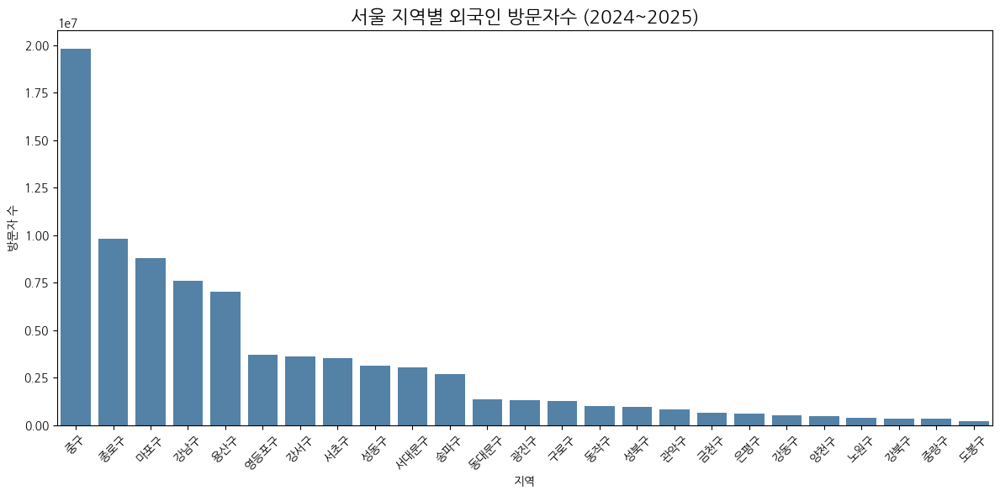

In [ ]:
# 1단계: 나눔고딕 폰트 설치 및 캐시 초기화
!apt-get update -qq
!apt-get install -y fonts-nanum
!fc-cache -fv
!rm -rf ~/.cache/matplotlib  # 캐시 삭제

# 2단계: matplotlib에 나눔고딕 폰트 설정
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
import seaborn as sns
import pandas as pd

font_path = '/usr/share/fonts/truetype/nanum/NanumGothic.ttf'
font_prop = fm.FontProperties(fname=font_path)
plt.rc('font', family=font_prop.get_name())
plt.rcParams['axes.unicode_minus'] = False  # 음수 부호 깨짐 방지

# 3단계: 데이터 불러오기 (경로 수정해서 사용)
file_path = '/content/sample_data/2024_2025외국인_방문객_서울_지역별_방문추이.csv'
df = pd.read_csv(file_path)

# 4단계: 시각화 (palette 경고 해결 위해 color 단일색 사용)
df_sorted = df.sort_values(by='외국인 방문자수', ascending=False)

plt.figure(figsize=(12, 6))
sns.barplot(data=df_sorted, x='지역', y='외국인 방문자수', color='steelblue')
plt.title('서울 지역별 외국인 방문자수 (2024~2025)', fontsize=16)
plt.xlabel('지역')
plt.ylabel('방문자 수')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


Selecting previously unselected package fonts-nanum.
(Reading database ... 124947 files and directories currently installed.)
Preparing to unpack .../fonts-nanum_20200506-1_all.deb ...
Unpacking fonts-nanum (20200506-1) ...
Setting up fonts-nanum (20200506-1) ...
Processing triggers for fontconfig (2.13.1-4.2ubuntu5) ...


<ipython-input-1-a6603b4aff97>:30: UserWarning: Glyph 51473 (\N{HANGUL SYLLABLE JUNG}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-1-a6603b4aff97>:30: UserWarning: Glyph 44396 (\N{HANGUL SYLLABLE GU}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-1-a6603b4aff97>:30: UserWarning: Glyph 51333 (\N{HANGUL SYLLABLE JONG}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-1-a6603b4aff97>:30: UserWarning: Glyph 47196 (\N{HANGUL SYLLABLE RO}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-1-a6603b4aff97>:30: UserWarning: Glyph 47560 (\N{HANGUL SYLLABLE MA}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-1-a6603b4aff97>:30: UserWarning: Glyph 54252 (\N{HANGUL SYLLABLE PO}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-1-a6603b4aff97>:30: UserWarning: Glyph 44053 (\N{HANGUL SYLLABLE GANG}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input

Saving 2024_2025외국인_방문객_서울_지역별_방문추이.csv to 2024_2025외국인_방문객_서울_지역별_방문추이.csv


<ipython-input-1-a6603b4aff97>:30: UserWarning: Glyph 50872 (\N{HANGUL SYLLABLE UL}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-1-a6603b4aff97>:30: UserWarning: Glyph 48324 (\N{HANGUL SYLLABLE BYEOL}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-1-a6603b4aff97>:30: UserWarning: Glyph 50808 (\N{HANGUL SYLLABLE OE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-1-a6603b4aff97>:30: UserWarning: Glyph 44397 (\N{HANGUL SYLLABLE GUG}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-1-a6603b4aff97>:30: UserWarning: Glyph 51064 (\N{HANGUL SYLLABLE IN}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-1-a6603b4aff97>:30: UserWarning: Glyph 44061 (\N{HANGUL SYLLABLE GAEG}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 48169 (\N{HANGUL SYLLABLE BANG}) missing from font(s) DejaVu Sa

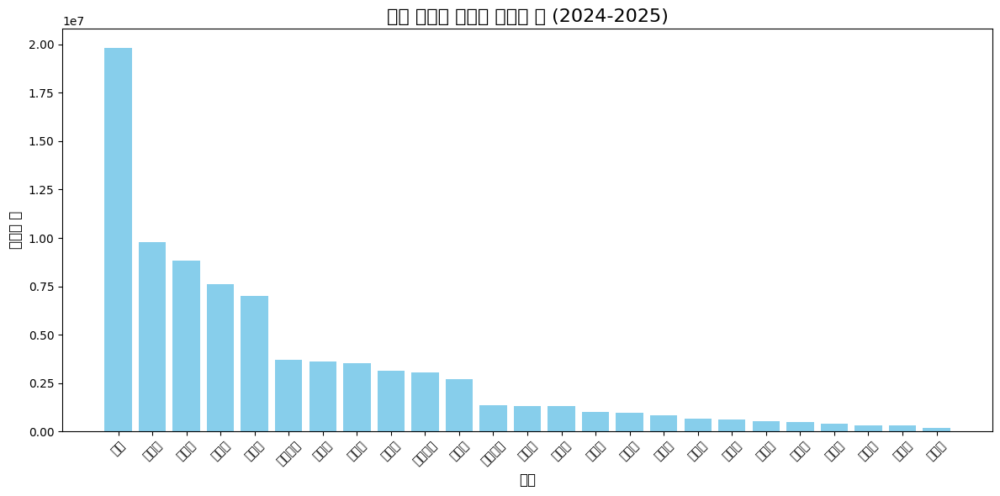

In [ ]:
# 1. 나눔고딕 폰트 설치
!apt-get -qq install fonts-nanum
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
import pandas as pd

# 2. 한글 폰트 설정
plt.rc('font', family='NanumGothic')
plt.rcParams['axes.unicode_minus'] = False

# 3. CSV 파일 불러오기 (예시: 코랩에 업로드한 경우)
from google.colab import files
uploaded = files.upload()

# 파일 이름 자동 추출
import io
file_name = list(uploaded.keys())[0]
df = pd.read_csv(io.BytesIO(uploaded[file_name]))

# 4. 데이터 정렬
df_sorted = df.sort_values(by="외국인 방문자수", ascending=False)

# 5. 그래프 그리기
plt.figure(figsize=(12, 6))
plt.bar(df_sorted["지역"], df_sorted["외국인 방문자수"], color='skyblue')
plt.title("서울 지역별 외국인 방문객 수 (2024-2025)", fontsize=16)
plt.xlabel("지역", fontsize=12)
plt.ylabel("방문자 수", fontsize=12)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


<ipython-input-8-44c4073e8c63>:13: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '남자' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  data6.loc[data6['gender'] == 1, 'gender'] = '남자'
<ipython-input-8-44c4073e8c63>:15: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'Non-drinking' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  data6.loc[data6['drinking'] == 0, 'drinking'] = 'Non-drinking'
<ipython-input-8-44c4073e8c63>:17: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'Non-smoking' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  data6.loc[(data6['smoking'] == 1) | (data6['smoking'] == 2), 'smoking'] = 'Non-smoking'
/usr/local

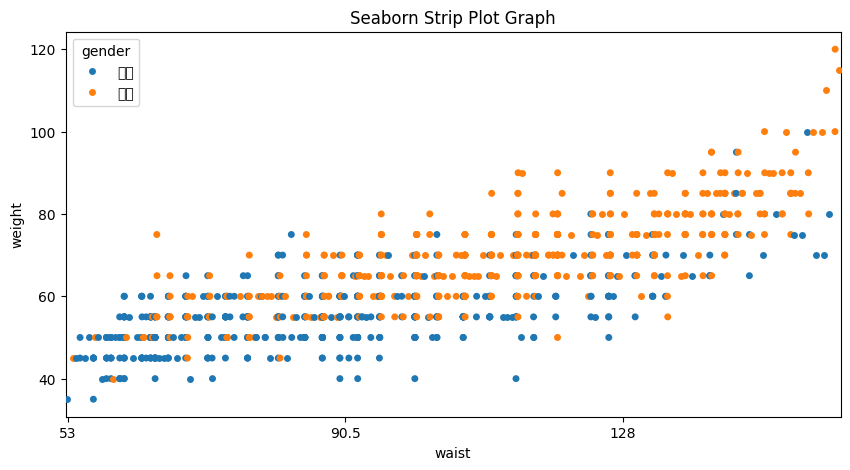

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# 데이터 로드
data = pd.read_excel('/content/sample_data/health_screenings_2020_1000ea.xlsx')

# 필요한 열 선택
data6 = data.loc[:, ['gender', 'height', 'weight', 'waist', 'drinking', 'smoking']]

# 값 변환
data6.loc[data6['gender'] == 1, 'gender'] = '남자'
data6.loc[data6['gender'] == 2, 'gender'] = '여자'
data6.loc[data6['drinking'] == 0, 'drinking'] = 'Non-drinking'
data6.loc[data6['drinking'] == 1, 'drinking'] = 'Drinking'
data6.loc[(data6['smoking'] == 1) | (data6['smoking'] == 2), 'smoking'] = 'Non-smoking'
data6.loc[data6['smoking'] == 3, 'smoking'] = 'Smoking'

# 그래프
plt.figure(figsize=(10,5))
plt.title('Seaborn Strip Plot Graph')
sns.stripplot(data=data6, x='waist', y='weight', hue='gender', dodge=True, jitter=True)
plt.xticks(np.arange(0,127,63), labels=[53, 90.5, 128])
plt.show()


      연도   시군  성별      인구
4   2017  익산시  남자  150493
5   2017  익산시  여자  149213
32  2018  익산시  남자  148412
33  2018  익산시  여자  147478
60  2019  익산시  남자  145490


<ipython-input-8-1d71605fc390>:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  male['연도'] = male['연도'].astype(int)
<ipython-input-8-1d71605fc390>:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  female['연도'] = female['연도'].astype(int)
<ipython-input-8-1d71605fc390>:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_gu

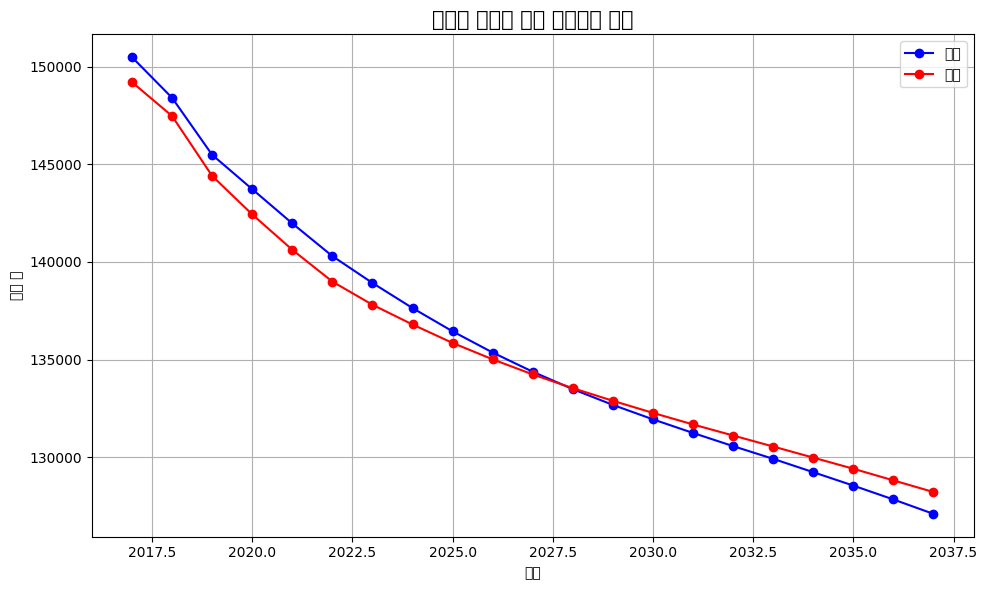

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# CSV 파일 불러오기
df = pd.read_csv('/content/sample_data/전북특별자치도_장래인구추계 시군별 남녀 인구_20201231.csv', encoding='euc-kr')

# 공백 제거 (혹시 몰라 전체적으로)
df['시군'] = df['시군'].str.strip()

# 익산시 포함된 행 추출
iksan_df = df[df['시군'].str.contains('익산')]

# 확인용 출력
print(iksan_df.head())

# 남녀 분리
male = iksan_df[iksan_df['성별'] == '남자']
female = iksan_df[iksan_df['성별'] == '여자']

# 문자열 숫자일 경우 쉼표 제거 후 정수 변환
male['연도'] = male['연도'].astype(int)
female['연도'] = female['연도'].astype(int)
male['인구'] = male['인구'].replace(',', '', regex=True).astype(int)
female['인구'] = female['인구'].replace(',', '', regex=True).astype(int)

# 시각화
plt.figure(figsize=(10, 6))
plt.plot(male['연도'], male['인구'], label='남자', marker='o', color='blue')
plt.plot(female['연도'], female['인구'], label='여자', marker='o', color='red')
plt.title('익산시 연도별 남녀 장래인구 추이', fontsize=15)
plt.xlabel('연도')
plt.ylabel('인구 수')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


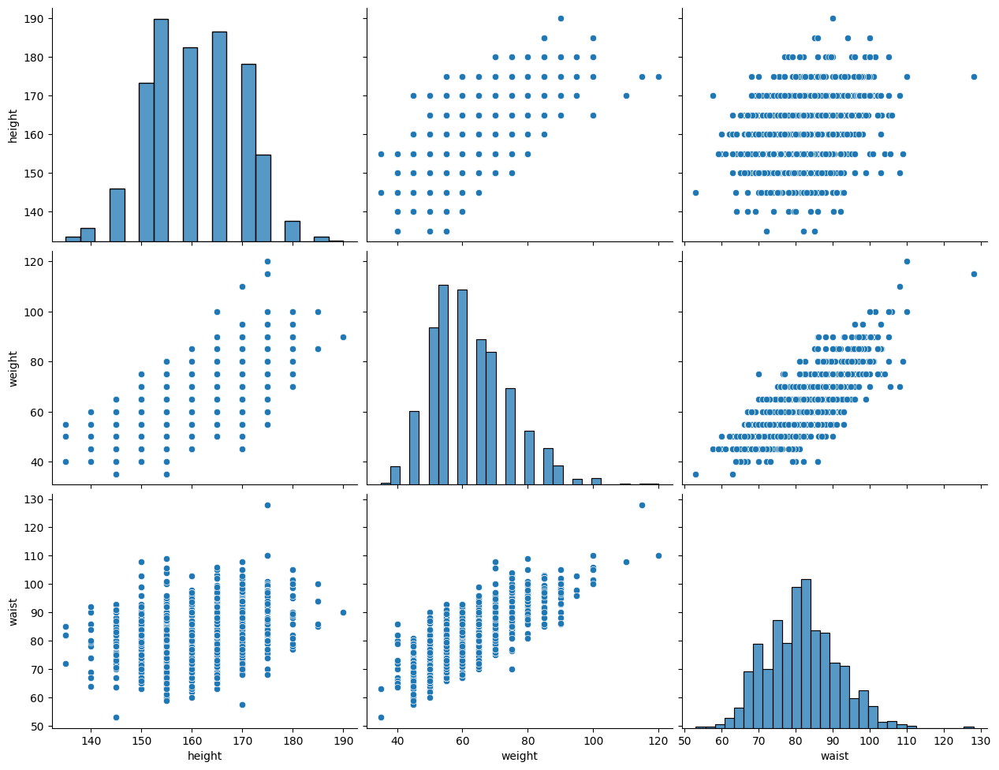

In [ ]:
sns.pairplot(data6,height=3.3,aspect=1.3)
plt.show()

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib

# 한글 폰트 설정
matplotlib.rc('font', family='Malgun Gothic')
plt.rcParams['axes.unicode_minus'] = False

# 파일 불러오기
file2 = '/content/sample_data/월별·원인별_발생건수_20250531181510.xlsx'
df2 = pd.read_excel(file2)

# 열 이름 문자열로 정리
df2.columns = df2.columns.astype(str)

# ✅ '2024'(합계 열) 제거
if '2024' in df2.columns:
    df2 = df2.drop(columns=['2024'])

# ✅ 데이터 정리: wide → long
df2_melted = df2.melt(id_vars='월별', var_name='월', value_name='건수')
df2_melted.rename(columns={'월별': '원인'}, inplace=True)
df2_melted['건수'] = pd.to_numeric(df2_melted['건수'], errors='coerce')
df2_melted.dropna(subset=['건수'], inplace=True)

# 📊 월별 막대그래프
plt.figure(figsize=(12, 6))
sns.barplot(data=df2_melted, x='월', y='건수', estimator='sum', ci=None)
plt.title('월별 산불 발생 건수')
plt.xlabel('월')
plt.ylabel('건수')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# 📊 원인별 파이그래프
원인별_합계 = df2_melted.groupby('원인')['건수'].sum()

plt.figure(figsize=(8, 8))
plt.pie(원인별_합계, labels=원인별_합계.index, autopct='%1.1f%%', startangle=140)
plt.title('원인별 산불 발생 비율')
plt.axis('equal')
plt.show()


FileNotFoundError: [Errno 2] No such file or directory: '/content/sample_data/월별·원인별_발생건수_20250531181510.xlsx'

In [ ]:
print(df2.columns)

Index(['월별', '2024', '2024.1', '2024.2', '2024.3', '2024.4', '2024.5',
       '2024.6', '2024.7', '2024.8'],
      dtype='object')


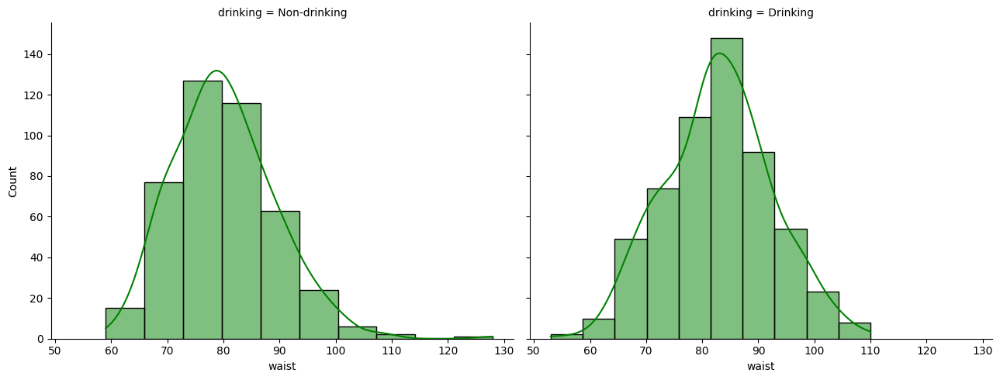

In [ ]:
fg = sns.FacetGrid(data6, col='drinking',height=5,aspect=1.3)
fg.map(sns.histplot,'waist',bins=10,color='g',kde=True)
plt.show()

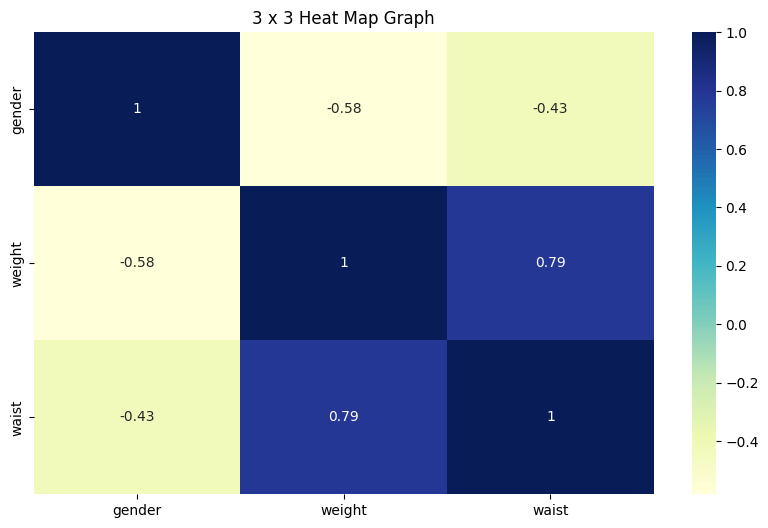

In [ ]:
data3 =data.loc[:,['gender','weight','waist']]
data8=data.loc[:,['gender','weight','waist','drinking','smoking','cholesterol','HDL','LDL']]
plt.figure(figsize=(10,6))
plt.title('3 x 3 Heat Map Graph')
correlation_data3=data3.corr()
sns.heatmap(correlation_data3,annot=True,cmap='YlGnBu')
plt.show()


In [ ]:
import seaborn as sns

# 데이터셋 로드
tips = sns.load_dataset("tips")

#total_bill을 오름차순으로 정렬한 후 상위 10개만 추려 출력함
sorted_tips = tips.sort_values(by="total_bill", ascending=True).head(10)
display(sorted_tips)


,total_bill,tip,sex,smoker,day,time,size
67,3.07,1.00,Female,Yes,Sat,Dinner,1
92,5.75,1.00,Female,Yes,Fri,Dinner,2
111,7.25,1.00,Female,No,Sat,Dinner,1
172,7.25,5.15,Male,Yes,Sun,Dinner,2
149,7.51,2.00,Male,No,Thur,Lunch,2
195,7.56,1.44,Male,No,Thur,Lunch,2
218,7.74,1.44,Male,Yes,Sat,Dinner,2
145,8.35,1.50,Female,No,Thur,Lunch,2
135,8.51,1.25,Female,No,Thur,Lunch,2
126,8.52,1.48,Male,No,Thur,Lunch,2


In [ ]:
import seaborn as sns

#seaborn에서 tips데이터셋을 불러와 tips변수에 저장
tips = sns.load_dataset("tips")

# by=["size","tip"]은 두개의 기준으로 정렬 ascending=[False,True]첫번째 기준으로 size는 내림차순, 두번째는 오름차순
# .head(10)상위 10개를 출력
sorted_tips = tips.sort_values(by=["size", "tip"], ascending=[False, True]).head(10)

# 실행 화면과 같게 출력됨
display(sorted_tips)

,total_bill,tip,sex,smoker,day,time,size
125,29.80,4.20,Female,No,Thur,Lunch,6
143,27.05,5.00,Female,No,Thur,Lunch,6
156,48.17,5.00,Male,No,Sun,Dinner,6
141,34.30,6.70,Male,No,Thur,Lunch,6
187,30.46,2.00,Male,Yes,Sun,Dinner,5
216,28.15,3.00,Male,Yes,Sat,Dinner,5
142,41.19,5.00,Male,No,Thur,Lunch,5
185,20.69,5.00,Male,No,Sun,Dinner,5
155,29.85,5.14,Female,No,Sun,Dinner,5
153,24.55,2.00,Male,No,Sun,Dinner,4


In [ ]:
import pandas as pd
import seaborn as sns


df = sns.load_dataset('titanic')

#성별로 데이터를 그룹화 함 그리고 생존률을 평균값을 계산후 그룹화 결과를 일반 데이터 프레임 형태로 되돌림
sex_survival = df.groupby('sex')['survived'].mean().reset_index()
display(sex_survival)

,sex,survived
0,female,0.742038
1,male,0.188908


In [ ]:
import pandas as pd
import seaborn as sns


tt = sns.load_dataset('titanic')
#타이타닉 데이터셋에서 부모자녀동반수(parch)의 생존 평균값을 계산 후 데이터 프레임형태로 되돌림
parch_survival = tt.groupby('parch')['survived'].mean().reset_index()
display(parch_survival)

,parch,survived
0,0,0.343658
1,1,0.550847
2,2,0.500000
3,3,0.600000
4,4,0.000000
5,5,0.200000
6,6,0.000000


In [ ]:
import numpy as np
import pandas as pd
import os
from tersorflow.keras.applications.resnet50 import ResNet50,preprocess_input
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense,Flatten,GlobalAveragePooling2D
from tensorflow.python.keras.proccessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam
#print(os.listdir("공부할 파일 출력")
train_dir ="/content/drive/MyDrive/인공지능데이터/CUB200/CUB200/train"
val_dir ="/content/drive/MyDrive/인공지능데이터/CUB200/CUB200/val"

data_generator_with_aug = ImageDataGenerator(preprocessing_function=preprocess_input,
                                             horizontal_flip= True,
                                             vertical_flip=True,
                                             rotation_range=30,
                                             width_shift_range=0.2,
                                             height_shift_range=0.2,)
data_generator_with_aug = ImageDataGenerator( preprocessing_function=preprocess_input)
image_size =224

train_generator = data_generator_with_aug.flow_from_directory(train_dir,
                                                            target_size=(image_size,image_size),
                                                            batch_size=24,
                                                            class_mode='categorical')
val_generator = data_generator_with_aug.flow_from_directory(val_dir,
                                                            target_size=(image_size,image_size),
                                                            batch_size=24,
                                                            class_mode='categorical')

num_classes = 20
base_model = ResNet50(weights='imagenet',include_top=False, input_shape=(224,224,3))

cnn = Sequential()
cnn.add(base_model)
cnn.add(GlobalAveragePooling2D())
cnn.add(Dense(num_classes,activation='softmax'))
cnn.compile(loss='categorical_crossentropy',optimizer=Adam(learning_rate=0.001),metrics=['accuracy'])
hist=cnn.fit_generator(
    train_generator,
    epochs =20,
    validation_data =val_generator,)

ModuleNotFoundError: No module named 'tersorflow'

1/1 [==============================] - 0s 16ms/step


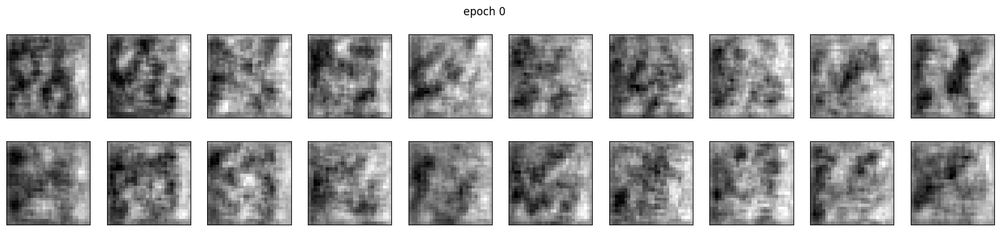

2/2 [==============================] - 0s 8ms/step


KeyboardInterrupt: 

In [ ]:
import numpy as np
from tensorflow.keras.datasets import fashion_mnist
from tensorflow.keras.layers import Input,Activation,Dense,Flatten,Reshape,Conv2D,Conv2DTranspose,Dropout,BatchNormalization,UpSampling2D
from tensorflow.keras.models import Model
from tensorflow.keras import backend as K
from tensorflow.keras.losses import mse
import matplotlib.pyplot as plt

(x_train,y_train),(x_test,y_test)=fashion_mnist.load_data()
x_train= x_train[np.isin(y_train,[9])]
x_train = (x_train.astype('float32')/255.0)*2.0-1.0 # [-1,1] 구간
x_test = (x_test.astype('float32')/255.0)*2.0-1.0
x_train = np.reshape(x_train, (len(x_train), 28, 28, 1))
x_test = np.reshape(x_test, (len(x_test), 28, 28, 1))

batch_siz=64
epochs=5000
dropout_rate=0.4
batch_norm=0.9
zdim=100 # 잠복 공간의 차원

discriminator_input=Input(shape=(28, 28, 1)) # 분별망 D 설계
x=Conv2D(64,(5,5),activation='relu',padding='same',strides=(2,2))(discriminator_input)
x=Dropout(dropout_rate)(x)
x=Conv2D(64,(5,5),activation='relu',padding='same',strides=(2,2))(x)
x=Dropout(dropout_rate)(x)
x=Conv2D(128,(5,5),activation='relu',padding='same',strides=(2,2))(x)
x=Dropout(dropout_rate)(x)
x=Conv2D(128,(5,5),activation='relu',padding='same',strides=(1,1))(x)
x=Dropout(dropout_rate)(x)
x=Flatten()(x)
discriminator_output=Dense(1,activation='sigmoid')(x)
discriminator=Model(discriminator_input,discriminator_output)

generator_input=Input(shape=(zdim,)) # 생성망 G 설계
x=Dense(3136)(generator_input)
x=BatchNormalization(momentum=batch_norm)(x)
x=Activation('relu')(x)
x=Reshape((7,7,64))(x)
x=UpSampling2D()(x)
x=Conv2D(128,(5,5),padding='same')(x)
x=BatchNormalization(momentum=batch_norm)(x)
x=Activation('relu')(x)
x=UpSampling2D()(x)
x=Conv2D(64,(5,5),padding='same')(x)
x=BatchNormalization(momentum=batch_norm)(x)
x=Activation('relu')(x)
x=Conv2D(64,(5,5),padding='same')(x)
x=BatchNormalization(momentum=batch_norm)(x)
x=Activation('relu')(x)
x=Conv2D(1,(5,5),activation='tanh',padding='same')(x)
generator_output=x
generator=Model(generator_input,generator_output)

discriminator.compile(optimizer='Adam',loss='binary_crossentropy',metrics=['accuracy'])

discriminator.trainable=False
gan_input=Input(shape=(zdim,))
gan_output=discriminator(generator(gan_input))
gan=Model(gan_input,gan_output)
gan.compile(optimizer='Adam',loss='binary_crossentropy',metrics=['accuracy'])

def train_discriminator(x_train):
    c=np.random.randint(0,x_train.shape[0],batch_siz)
    real=x_train[c]
    discriminator.train_on_batch(real,np.ones((batch_siz,1)))

    p=np.random.normal(0,1,(batch_siz,zdim))
    fake=generator.predict(p)
    discriminator.train_on_batch(fake,np.zeros((batch_siz,1)))

def train_generator():
    p=np.random.normal(0,1,(batch_siz,zdim))
    gan.train_on_batch(p,np.ones((batch_siz,1)))

for i in range(epochs+1): # 학습을 수행
    train_discriminator(x_train)
    train_generator()
    if(i%100==0): # 학습 도중 100세대마다 중간 상황 출력
        plt.figure(figsize=(20, 4))
        plt.suptitle('epoch '+str(i))
        for k in range(20):
            plt.subplot(2,10,k+1)
            img=generator.predict(np.random.normal(0,1,(1,zdim)))
            plt.imshow(img[0].reshape(28,28),cmap='gray')
            plt.xticks([]); plt.yticks([])
        plt.show()

imgs=generator.predict(np.random.normal(0,1,(50,zdim)))
plt.figure(figsize=(20,10)) # 학습을 마친 후 50개 샘플을 생성하여 출력
for i in range(50):
    plt.subplot(5,10,i+1)
    plt.imshow(imgs[i].reshape(28,28),cmap='gray')
    plt.xticks([]); plt.yticks([])

In [ ]:
!pip show tensorflow

Name: tensorflow
Version: 2.15.0
Summary: TensorFlow is an open source machine learning framework for everyone.
Home-page: https://www.tensorflow.org/
Author: Google Inc.
Author-email: packages@tensorflow.org
License: Apache 2.0
Location: /usr/local/lib/python3.10/dist-packages
Requires: absl-py, astunparse, flatbuffers, gast, google-pasta, grpcio, h5py, keras, libclang, ml-dtypes, numpy, opt-einsum, packaging, protobuf, setuptools, six, tensorboard, tensorflow-estimator, tensorflow-io-gcs-filesystem, termcolor, typing-extensions, wrapt
Required-by: dopamine_rl, tf_keras


['train', 'val']
Found 300 images belonging to 10 classes.
Found 243 images belonging to 10 classes.
94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/20
10/10 ━━━━━━━━━━━━━━━━━━━━ 324s 28s/step - accuracy: 0.1230 - loss: 2.4838 - val_accuracy: 0.2099 - val_loss: 2.1853
Epoch 2/20
10/10 ━━━━━━━━━━━━━━━━━━━━ 10s 1s/step - accuracy: 0.3457 - loss: 1.8112 - val_accuracy: 0.4198 - val_loss: 1.6739
Epoch 3/20
10/10 ━━━━━━━━━━━━━━━━━━━━ 10s 1s/step - accuracy: 0.6067 - loss: 1.3884 - val_accuracy: 0.5514 - val_loss: 1.3437
Epoch 4/20
10/10 ━━━━━━━━━━━━━━━━━━━━ 10s 976ms/step - accuracy: 0.8269 - loss: 0.9767 - val_accuracy: 0.6626 - val_loss: 1.0496
Epoch 5/20
10/10 ━━━━━━━━━━━━━━━━━━━━ 10s 942ms/step - accuracy: 0.8664 - loss: 0.7405 - val_accuracy: 0.7490 - val_loss: 0.8414
Epoch 6/20
10/10 ━━━━━━━━━━━━━━━━━━━━ 10s 1s/step - accuracy: 0.9251 - loss: 0.5345 - val_accuracy: 0.7695 - val_loss: 0.6944
Epoch 7/20
10/10 ━━━━━━━━━━━━━━━━━━━━ 10s 1s/step - accuracy: 0.9733 - loss: 0.4056 - val_accuracy: 0.7984 - val_loss: 0.5917
Epoch 8/20
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - accuracy: 0.9903 - loss: 0.3292 - val_accuracy: 0.8066 - v

UFuncTypeError: ufunc 'minimum' did not contain a loop with signature matching types (dtype('<U1'), dtype('<U1')) -> None

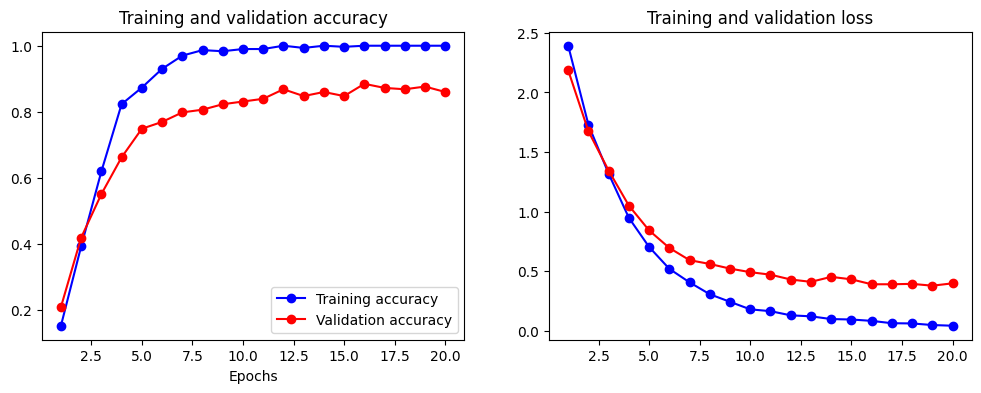

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import os
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam

# 데이터 디렉토리 확인
print(os.listdir("/content/drive/MyDrive/인공지능데이터/CUB200/CUB200"))
train_dir = "/content/drive/MyDrive/인공지능데이터/CUB200/CUB200/train"
val_dir = "/content/drive/MyDrive/인공지능데이터/CUB200/CUB200/val"

# 이미지 데이터 제너레이터 설정
data_generator_with_aug = ImageDataGenerator(
    preprocessing_function=preprocess_input,
    horizontal_flip=True,
    width_shift_range=0.2,
    height_shift_range=0.2
)

image_size = 224

# 훈련 데이터 제너레이터
train_generator = data_generator_with_aug.flow_from_directory(
    train_dir,
    target_size=(image_size, image_size),
    batch_size=32,
    class_mode='categorical'
)

# 검증 데이터 제너레이터
val_generator = data_generator_with_aug.flow_from_directory(
    val_dir,
    target_size=(image_size, image_size),
    batch_size=32,
    class_mode='categorical'
)

# 모델 정의
num_classes = train_generator.num_classes
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

cnn = Sequential()
cnn.add(base_model)
cnn.add(GlobalAveragePooling2D())
cnn.add(Dense(num_classes, activation='softmax'))

# 모델 컴파일
cnn.compile(loss='categorical_crossentropy', optimizer=Adam(0.00002), metrics=['accuracy'])

# 모델 훈련
hist = cnn.fit(
    train_generator,
    epochs=20,
    validation_data=val_generator
)
# 학습 결과 시각화
def plot_training_history(history):
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    epochs = range(1, len(acc) + 1)

    plt.figure(figsize=(12, 4))

    plt.subplot(1, 2, 1)
    plt.plot(epochs, acc, 'bo-', label='Training accuracy')
    plt.plot(epochs, val_acc, 'ro-', label='Validation accuracy')
    plt.title('Training and validation accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(epochs, loss, 'bo-', label='Training loss')
    plt.plot(epochs, val_loss, 'ro-', label='Validation loss')
    plt.title('Training and validation loss')
    plt.violinplot('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.show()

# 시각화 함수 호출
plot_training_history(hist)


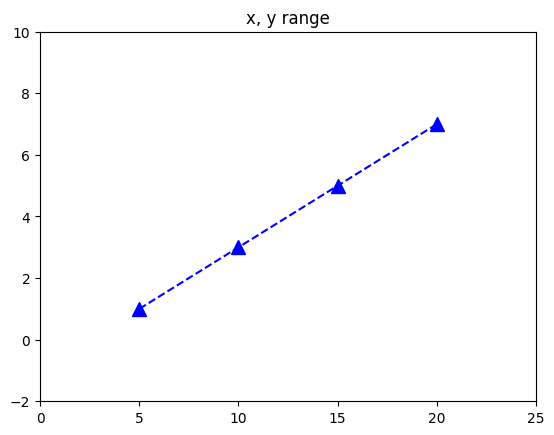

In [ ]:
import matplotlib.pyplot as plt
plt.title('x, y range')
xdata=[5,10,15,20]
ydata=[1,3,5,7]
plt.plot(xdata,ydata,color = 'b' ,linestyle = '--',marker='^',markersize = '10')
plt.xlim(0,25)
plt.ylim(-2,10)
plt.show()

<ipython-input-2-10dd5f0fae1f>:25: UserWarning: Glyph 49884 (\N{HANGUL SYLLABLE SI}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-2-10dd5f0fae1f>:25: UserWarning: Glyph 48516 (\N{HANGUL SYLLABLE BUN}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-2-10dd5f0fae1f>:25: UserWarning: Glyph 44036 (\N{HANGUL SYLLABLE GAN}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-2-10dd5f0fae1f>:25: UserWarning: Glyph 45824 (\N{HANGUL SYLLABLE DAE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-2-10dd5f0fae1f>:25: UserWarning: Glyph 54844 (\N{HANGUL SYLLABLE HON}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-2-10dd5f0fae1f>:25: UserWarning: Glyph 51105 (\N{HANGUL SYLLABLE JAB}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-2-10dd5f0fae1f>:25: UserWarning: Glyph 46020 (\N{HANGUL SYLLABLE DO}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-

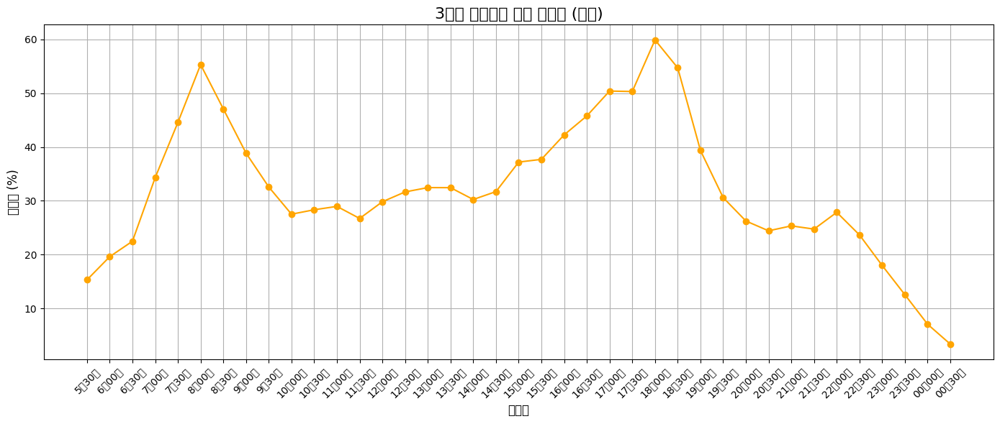

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# CSV 파일 경로 (파일명이 한글이면 경로에 주의 필요)
file_path = '/content/sample_data/서울교통공사_지하철혼잡도정보_20250331.csv'

# CSV 파일을 EUC-KR 인코딩으로 읽기
df = pd.read_csv(file_path, encoding='euc-kr')

# 3호선 평일 데이터만 필터링
line3_df = df[(df['호선'] == 3) & (df['요일구분'] == '평일')]

# 시간대 컬럼만 추출 (6번째 열부터 끝까지)
time_columns = df.columns[6:]
average_congestion = line3_df[time_columns].mean()

# 시각화
plt.figure(figsize=(14, 6))
plt.plot(time_columns, average_congestion, marker='o', color='orange')
plt.title('3호선 시간대별 평균 혼잡도 (평일)', fontsize=16)
plt.xlabel('시간대', fontsize=12)
plt.ylabel('혼잡도 (%)', fontsize=12)
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()


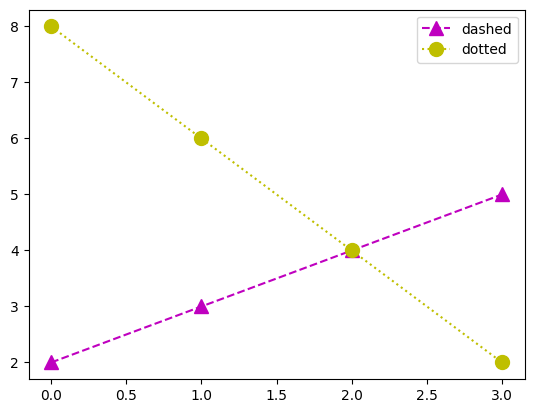

In [ ]:
import matplotlib.pyplot as plt

data1=[2,3,4,5]
data2=[8,6,4,2]
plt.plot(data1,color = 'm', label = 'dashed',linestyle = '--',marker='^',markersize = '10')
plt.plot(data2,color = 'y' ,label='dotted',linestyle = ':',marker='o',markersize = '10')
plt.legend()
plt.show()

In [ ]:
import numpy as np
import os
import matplotlib.pyplot as plt
from tensorflow.keras.applications.mobilenet_v2 import MobileNetV2, preprocess_input
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam

# 데이터 디렉토리 확인
print(os.listdir("/content/drive/MyDrive/인공지능데이터/hymenoptera_data/hymenoptera_data"))
train_dir = "/content/drive/MyDrive/인공지능데이터/hymenoptera_data/hymenoptera_data/train"
val_dir = "/content/drive/MyDrive/인공지능데이터/hymenoptera_data/hymenoptera_data/val"

# 이미지 데이터 제너레이터 설정
data_generator_with_aug = ImageDataGenerator(
    preprocessing_function=preprocess_input,
    horizontal_flip=True,
    width_shift_range=0.2,
    height_shift_range=0.2
)

image_size = 224

# 훈련 데이터 제너레이터
train_generator = data_generator_with_aug.flow_from_directory(
    train_dir,
    target_size=(image_size, image_size),
    batch_size=32,
    class_mode='categorical'
)

# 검증 데이터 제너레이터
val_generator = data_generator_with_aug.flow_from_directory(
    val_dir,
    target_size=(image_size, image_size),
    batch_size=32,
    class_mode='categorical'
)

# 모델 정의
num_classes = train_generator.num_classes
base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

cnn = Sequential()
cnn.add(base_model)
cnn.add(GlobalAveragePooling2D())
cnn.add(Dense(num_classes, activation='softmax'))

# 모델 컴파일
cnn.compile(loss='categorical_crossentropy', optimizer=Adam(0.00002), metrics=['accuracy'])

# 모델 훈련
hist = cnn.fit(
    train_generator,
    epochs=20,
    validation_data=val_generator
)

# 학습 결과 시각화
def plot_training_history(history):
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    epochs = range(1, len(acc) + 1)

    plt.figure(figsize=(12, 4))

    plt.subplot(1, 2, 1)
    plt.plot(epochs, acc, 'bo-', label='Training accuracy')
    plt.plot(epochs, val_acc, 'ro-', label='Validation accuracy')
    plt.title('Training and validation 정확률')
    plt.xlabel('Epochs')
    plt.ylabel('정확률')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(epochs, loss, 'bo-', label='Training loss')
    plt.plot(epochs, val_loss, 'ro-', label='Validation loss')
    plt.title('Training and validation 손실률')
    plt.xlabel('Epochs')
    plt.ylabel('손실률')
    plt.legend()

    plt.show()

# 시각화 함수 호출
plot_training_history(hist)

['train', 'val']
Found 244 images belonging to 2 classes.
Found 153 images belonging to 2 classes.
9406464/9406464 [==============================] - 1s 0us/step


KeyboardInterrupt: 

['hymenoptera_data']
Found 244 images belonging to 2 classes.
Found 153 images belonging to 2 classes.
Epoch 1/2
8/8 [==============================] - 349s 39s/step - loss: 0.5612 - accuracy: 0.7131 - val_loss: 0.6876 - val_accuracy: 0.6405
Epoch 2/2
8/8 [==============================] - 239s 32s/step - loss: 0.3564 - accuracy: 0.8525 - val_loss: 0.5633 - val_accuracy: 0.7255


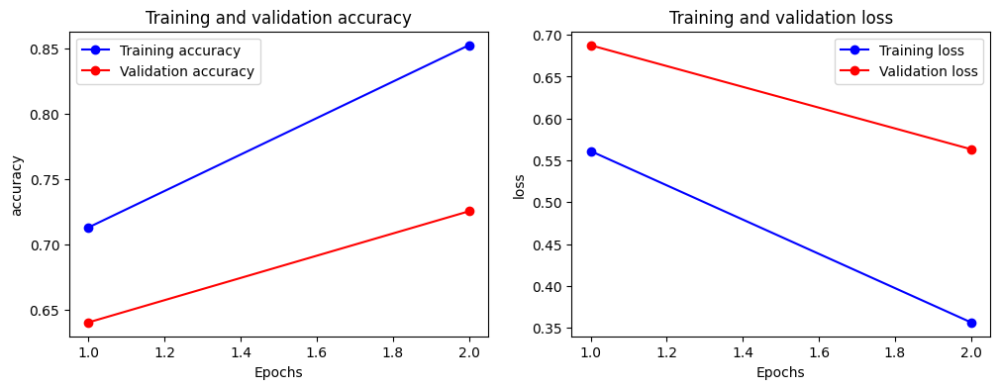

In [ ]:
import numpy as np
import os
import matplotlib.pyplot as plt
from tensorflow.keras.applications.densenet import DenseNet121, preprocess_input
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam

# 데이터 디렉토리 확인
print(os.listdir("/content/drive/MyDrive/인공지능데이터/hymenoptera_data"))
train_dir = "/content/drive/MyDrive/인공지능데이터/hymenoptera_data/hymenoptera_data/train"
val_dir = "/content/drive/MyDrive/인공지능데이터/hymenoptera_data/hymenoptera_data/val"

# 이미지 데이터 제너레이터 설정
data_generator_with_aug = ImageDataGenerator(
    preprocessing_function=preprocess_input,
    horizontal_flip=True,
    width_shift_range=0.2,
    height_shift_range=0.2
)

image_size = 224

# 훈련 데이터 제너레이터
train_generator = data_generator_with_aug.flow_from_directory(
    train_dir,
    target_size=(image_size, image_size),
    batch_size=32,
    class_mode='categorical'
)

# 검증 데이터 제너레이터
val_generator = data_generator_with_aug.flow_from_directory(
    val_dir,
    target_size=(image_size, image_size),
    batch_size=32,
    class_mode='categorical'
)

# 모델 정의
num_classes = train_generator.num_classes
base_model = DenseNet121(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

cnn = Sequential()
cnn.add(base_model)
cnn.add(GlobalAveragePooling2D())
cnn.add(Dense(num_classes, activation='softmax'))

# 모델 컴파일
cnn.compile(loss='categorical_crossentropy', optimizer=Adam(0.00002), metrics=['accuracy'])

# 모델 훈련
hist = cnn.fit(
    train_generator,
    epochs=2,
    validation_data=val_generator
)

# 학습 결과 시각화
def plot_training_history(history):
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    epochs = range(1, len(acc) + 1)

    plt.figure(figsize=(12, 4))

    plt.subplot(1, 2, 1)
    plt.plot(epochs, acc, 'bo-', label='Training accuracy')
    plt.plot(epochs, val_acc, 'ro-', label='Validation accuracy')
    plt.title('Training and validation accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('accuracy')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(epochs, loss, 'bo-', label='Training loss')
    plt.plot(epochs, val_loss, 'ro-', label='Validation loss')
    plt.title('Training and validation loss')
    plt.xlabel('Epochs')
    plt.ylabel('loss')
    plt.legend()

    plt.show()

# 시각화 함수 호출
plot_training_history(hist)

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.datasets import fashion_mnist

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam
# 구글 드라이브에 인공지능 자료를 파일에 저장하여 이 코드에 추가한다.
(x_train, y_train),(x_test,y_test) =fashion_mnist.load_data()
x_train = x_train.reshape(60000,784)
x_test = x_test.reshape(10000,784)
x_train=x_train.astype(np.float32)/255.0
x_test = x_test.astype(np.float32)/255.0
y_train =tf.keras.utils.to_categorical(y_train,10)
y_test=tf.keras.utils.to_categorical(y_test,10)

n_input=784
n_hidden =1024
n2 =512
n3=512
n4=512
n_output =10

mlp=Sequential()
mlp.add(Dense(units=n_hidden,activation ='tanh',input_shape=(n_input,),kernel_initializer='random_uniform',bias_initializer ='zeros'))
# mlp.add(Dense(units=n2,activation ='tanh',input_shape=(n_input,),kernel_initializer='random_uniform',))
# mlp.add(Dense(units=n3,activation ='tanh',input_shape=(n_input,),kernel_initializer='random_uniform',))
# mlp.add(Dense(units=n4,activation ='tanh',input_shape=(n_input,),kernel_initializer='random_uniform',))
mlp.add(Dense(units=n_output,activation ='tanh',kernel_initializer='random_uniform',bias_initializer ='zeros'))
mlp.compile(loss='mean_squared_error',optimizer=Adam(learning_rate=0.001),metrics=['accuracy'])
hist=mlp.fit(x_train,y_train,batch_size=128,epochs=30,validation_data =(x_test,y_test),verbose=2)
res =mlp.evaluate(x_test,y_test,verbose=0)
print("정확률은",res[1]*100)

4422102/4422102 [==============================] - 0s 0us/step
Epoch 1/30
469/469 - 4s - loss: 0.0653 - accuracy: 0.6916 - val_loss: 0.0337 - val_accuracy: 0.8242 - 4s/epoch - 9ms/step
Epoch 2/30
469/469 - 2s - loss: 0.0302 - accuracy: 0.8444 - val_loss: 0.0311 - val_accuracy: 0.8368 - 2s/epoch - 4ms/step
Epoch 3/30


KeyboardInterrupt: 

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_7 (InputLayer)        [(None, 28, 28, 1)]       0         
                                                                 
 conv2d_24 (Conv2D)          (None, 28, 28, 32)        320       
                                                                 
 conv2d_25 (Conv2D)          (None, 14, 14, 64)        18496     
                                                                 
 conv2d_26 (Conv2D)          (None, 7, 7, 64)          36928     
                                                                 
 conv2d_27 (Conv2D)          (None, 7, 7, 64)          36928     
                                                                 
 flatten_4 (Flatten)         (None, 3136)              0         
                                                                 
 dense_3 (Dense)             (None, 32)                1003

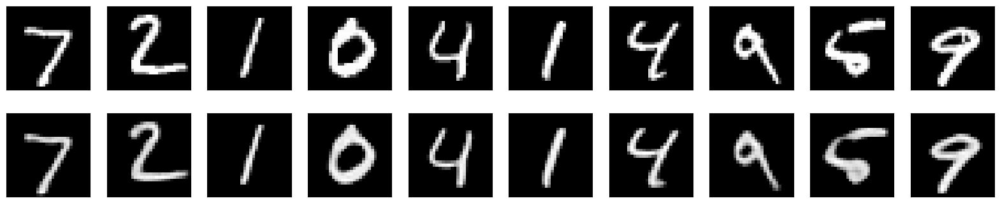

In [ ]:
import numpy as np
from tensorflow.keras.datasets import mnist
from tensorflow.keras.layers import Input,Dense,Flatten,Reshape,Conv2D,Conv2DTranspose
from tensorflow.keras.models import Model
from tensorflow.keras import backend as K


#MNIST 데이터를 읽고 신경망에 입력할 준비
(x_train,y_train),(x_test,y_test) =mnist.load_data()
x_train =x_train.astype('float32')/255.
x_test =x_test.astype('float32')/255.
x_train =np.reshape(x_train,(len(x_train),28,28,1))
x_test =np.reshape(x_test,(len(x_test),28,28,1))
zdim =32 #잠복공간의 자원

#오토인코더의 인코더 부분 설계
encoder_input=Input(shape=(28,28,1))
x=Conv2D(32,(3,3),activation='relu',padding='same',strides=(1,1))(encoder_input)
x=Conv2D(64,(3,3),activation='relu',padding='same',strides=(2,2))(x)
x=Conv2D(64,(3,3),activation='relu',padding='same',strides=(2,2))(x)
x=Conv2D(64,(3,3),activation='relu',padding='same',strides=(1,1))(x)
x=Flatten()(x)
encoder_output=Dense(zdim)(x)
model_encoder=Model(encoder_input,encoder_output)
model_encoder.summary()
#오토한코디의 다코더 부분 설계
decoder_input=Input(shape=(zdim,))
x= Dense(3136)(decoder_input)
x=Reshape((7,7,64))(x)
x=Conv2DTranspose(64, (3,3),activation= 'relu',padding='same',strides=(1,1))(x)
x= Conv2DTranspose(64,(3,3),activation='relu',padding='same',strides=(2,2))(x)
x = Conv2DTranspose(32,(3, 3),activation='relu',padding='same',strides=(2,2))(x)
x =Conv2DTranspose(1,(3, 3),activation='relu',padding='same',strides=(1,1))(x)

decoder_output =x
model_decoder =Model(decoder_input,decoder_output)
model_decoder.summary()

model_input = encoder_input
model_output =model_decoder(encoder_output)
model = Model(model_input,model_output)
#오토인코더 학습
model.compile(optimizer = 'Adam',loss='mse')
model.fit(x_train,x_train,epochs =5,batch_size =128,shuffle=True,validation_data=(x_test,x_test))

#복원 실험  1: x_test를 복원하는 예측실험
decoded_img= model.predict(x_test)
import matplotlib.pyplot as plt
n = 10
plt.figure(figsize =(20,4))
for  i in range(n):
  plt.subplot(2,n,i+1)
  plt.imshow(x_test[i].reshape(28,28),cmap='gray')
  plt.xticks([]); plt.yticks([])
  plt.subplot(2,n,i+n+1)
  plt.imshow(decoded_img[i].reshape(28,28),cmap='gray')
  plt.xticks([]); plt.yticks([])
plt.show()



In [ ]:
base_model =DenseNet

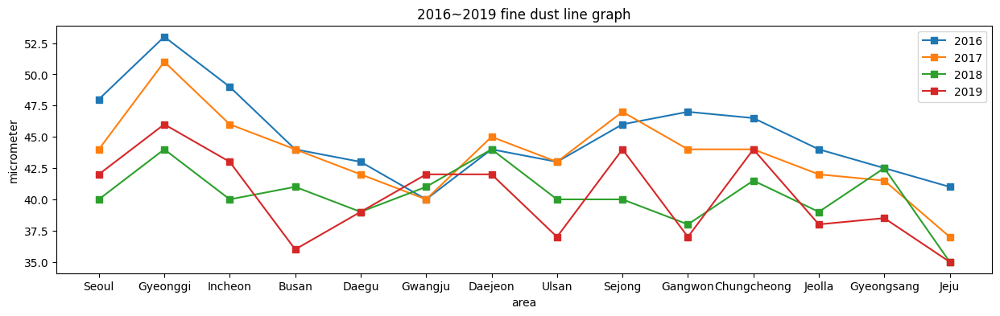

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
plt.figure(figsize =(15,4))
data = pd.read_excel('/content/sample_data/fine_dust.xlsx',index_col = 'area')
for year in range(2016,2020):
  chartdata = data[year]
  plt.plot(chartdata, marker = 's', label  = year)
  plt.xlabel('area')
  plt.ylabel('micrometer')
  plt.title('2016~2019 fine dust line graph')
  plt.legend()
  plt.grid()
plt.show()

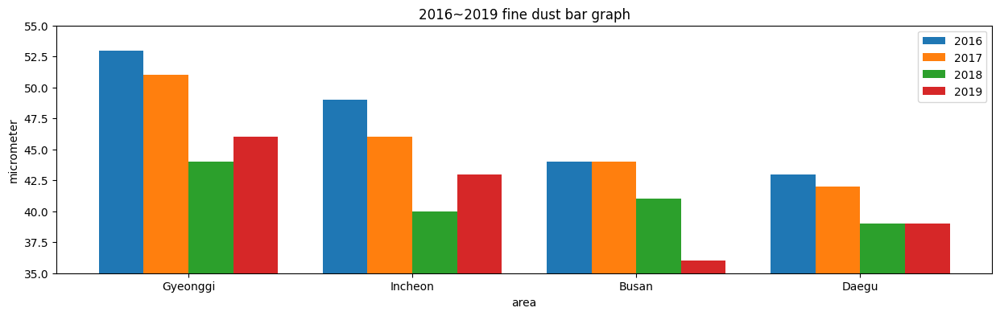

In [ ]:
import numpy as np
index =np.arange(4)
plt.figure(figsize =(15,4))
data = pd.read_excel('/content/sample_data/fine_dust.xlsx',index_col = 'area')
data4 = data.loc['Gyeonggi':'Daegu',2016:2019]
for year in range(2016,2020):
  chartdata = data4[year]
  plt.bar(index,chartdata,width =0.2,label = year)
  index = index +0.2

  plt.ylim(35,55)
  plt.xlabel('area')
  plt.ylabel('micrometer')
  plt.xticks(index-0.5,['Gyeonggi','Incheon','Busan','Daegu'])
  plt.title('2016~2019 fine dust bar graph')
  plt.legend()
  plt.grid()
plt.show()

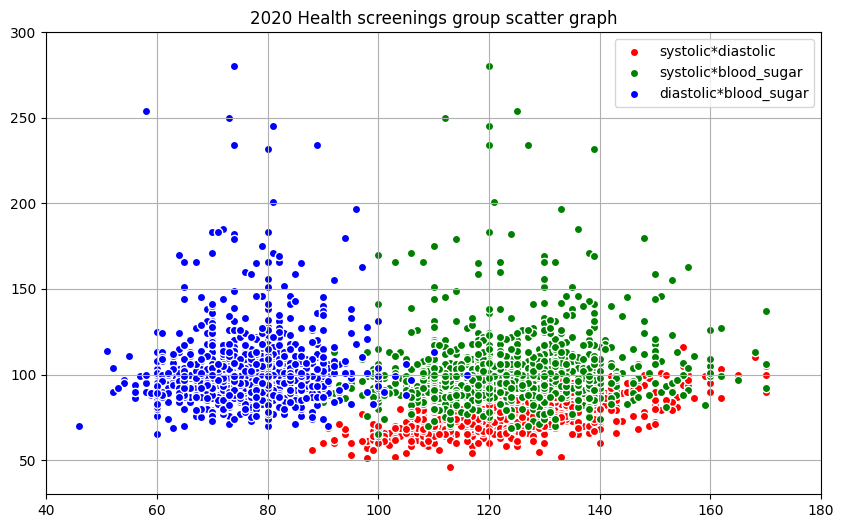

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
data = pd.read_excel('/content/sample_data/health_screenings_2020_1000ea.xlsx')
systolic_data = data['systolic']
diastolic_data = data['diastolic']
blood_sugar_data = data['blood_sugar']

plt.figure(figsize=(10,6))
plt.scatter(systolic_data,diastolic_data,color = 'r',edgecolor = 'w',label='systolic*diastolic')
plt.scatter(systolic_data,blood_sugar_data,color = 'g',edgecolor = 'w',label = 'systolic*blood_sugar')
plt.scatter(diastolic_data,blood_sugar_data,color = 'b',edgecolor = 'w',label = 'diastolic*blood_sugar')
plt.xlim(40,180)
plt.ylim(30,300)
plt.title('2020 Health screenings group scatter graph')
plt.legend()
plt.grid()
plt.show()





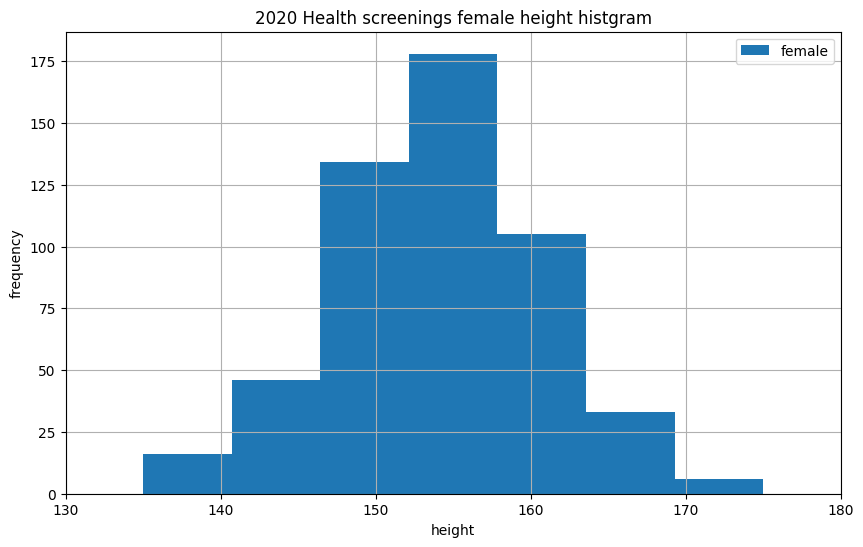

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
data = pd.read_excel('/content/sample_data/health_screenings_2020_1000ea.xlsx')
female_data = data.loc[data.gender ==2 ,[ 'gender','height']]
plt.figure(figsize=(10,6))
plt.hist(female_data['height'],bins = 7 , label= 'female')
plt.xlim(130,180)
plt.xlabel('height')
plt.ylabel('frequency')
plt.title('2020 Health screenings female height histgram')
plt.legend()
plt.grid()
plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
data = pd.read_excel('/content/sample_data/health_screenings_2020_1000ea.xlsx')
height = np.array([male_data['height'],female_data['height']],dtype =object)
plt.figure(figsize=(10,6))
plt.hist(height, bins=6, label=['male','female'],stacked = True)
plt.xlim(130,195)
plt.xlabel('height')
plt.ylabel('frequency')
plt.title('2020 Health screenings male & female height histgram')
plt.legend()
plt.show()

NameError: name 'male_data' is not defined

In [ ]:
mlp.save("my mlp.h5")

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
net = tf.keras.models.load_model("my mlp.h5")
net.summary()
(x_train, y_train), (x_test, y_test)=cifar10.laod_data()
x_train =x_train.astype(np.float32)/255.0
x_test =x_test.astype(np.float32)/255.0
y_train = tf.keras.utils.to_categorical(y_train, 10)
y_test =tf.keras.to_categorical(y_test,10)

res =mlp.evalate(x_test, y_test, verbose =0)
print(res[1]*100)

In [ ]:
# cifar10을 이용하여 자연 영상인식을 하는 법
# gpu 연산 런타임, 런타임 유형변경
import numpy as np
import tensorflow as tf
from tensorflow.keras.datasets import cifar10

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D,MaxPooling2D,Flatten,Dense,Dropout
from tensorflow.keras.optimizers import Adam

(x_train, y_train),(x_test,y_test) =cifar10.load_data()
x_train=x_train.astype(np.float32)/255.0
x_test = x_test.astype(np.float32)/255.0
y_train =tf.keras.utils.to_categorical(y_train,10)
y_test=tf.keras.utils.to_categorical(y_test,10)
n_input=784
n_hidden =1024
n2 =512
n3=512
n4=512
n_output =10
cnn=Sequential()
cnn.add(Conv2D(64,(3,3),activation='relu',input_shape(32,32,3)))
cnn.add(Conv2D(64,(3,3),activation='relu'))
cnn.add(MaxPooling2D(pool_size=(2,2)))
cnn.add(Dropout(0.25))
cnn.add(Conv2D(64,(3,3),activation='relu'))
cnn.add(Conv2D(64,(3,3),activation='relu'))
cnn.add(MaxPooling2D(pool_size=(2,2)))
cnn.add(Dropout(0.25))
cnn.add(Dropout(0.25))
cnn.add(Flatten())
cnn.add(Dense(512,activation ='relu'))
cnn.add(Dropout(0.5))
cnn.add(Dense(10,activation ='softmax'))


# 신경말 모델 학습(영상 증대기 활용)
cnn.compile(loss='categorical_crossentropy',optimizer=Adam().metrics=('accuracy'))
batch_size=128
generator =ImageDataGenerator(width_shift_range=0.1,height_shift_range=0.1,horizontal_flip=True)
hist =cnn.fit_generator(generator.flow(x_train,y_train,batch_size=batch_size),epochs=50,validation_data=(x_test,y_test),verbose=2)
# 신경망 모델 정확률 평가
res =cnn.evaluate(x_test,y_test,verbose=0)
print("정확률은",res[1]*100)


SyntaxError: positional argument follows keyword argument (<ipython-input-8-8df6491c7936>, line 23)

In [ ]:
from sklearn.datasets import fetch_openml
from sklearn import datasets
from sklearn.neural_network import MLPClassifier
import matplotlib.pyplot as plt
import numpy as np

# #데이터셋을 읽고 훈련 집합과 테스트 집합으로 분할
# digit = datasets.load_digits()
# x_train,x_test,y_train,y_test = train_test_split(digit.data,digit.target,train_size=0.6)

# #MLP 분류기 모델을 학습
# mlp = MLPClassifier(hidden_layer_sizes=(100),learning_rate_init=0.001,batch_size=32,max_iter=300,solver='sgd',verbose=True)
# mlp.fit(x_train,y_train)

# res=mlp.predict(x_test)

#MNIST 데이터셋을 읽고 훈련 집합과 테스트 집합으로 분할

mnist = fetch_openml('mnist_784')
mnist.data =mnist.data/255.0
x_train = mnist.data[:60000]; x_test=mnist.data[60000:]
y_train =np.int16(mnist.target[:60000]); y_test = np.int16(mnist.target[60000:])

#MLP 분류기 모델을 학습
mlp = MLPClassifier(hidden_layer_sizes=(100),learning_rate_init = 0.001,batch_size=512,max_iter=300,solver='adam',verbose =True)
mlp.fit (x_train,y_train)
#테스트 집합으로 예측
res = mlp.predict(x_test)



/usr/local/lib/python3.10/dist-packages/sklearn/datasets/_openml.py:968: FutureWarning: The default value of `parser` will change from `'liac-arff'` to `'auto'` in 1.4. You can set `parser='auto'` to silence this warning. Therefore, an `ImportError` will be raised from 1.4 if the dataset is dense and pandas is not installed. Note that the pandas parser may return different data types. See the Notes Section in fetch_openml's API doc for details.
  warn(


KeyboardInterrupt: 

In [ ]:
import numpy as np

miles = np.array([1,2,3])

result = miles *1.6
print(result)

[1.6 3.2 4.8]


In [ ]:
import numpy as np
ages =np.array([18,19,25,30,28])



print(ages[ages>29])

a = np.array([[11,3,2],[3,14,100],[33,7,28]])
print(a[1:3,1:3])
print(a[1])
a[1:3,0]
np.max(a)
np.sum(a[0,:])

[30]
[[ 14 100]
 [  7  28]]
[  3  14 100]


16

In [ ]:
from sklearn.linear_model import Perceptron # 나중에 이해하는 걸로 하자 2024_04_17 week7-2
#훈련집합 구축
X=[[0,0],[0,1],[1,0],[1,1]]
y =[-1,1,1,-1]
#fit 함수로 Perceptron 학습
p = Perceptron()
p.fit(X,y)

print("학습된 퍼셉트론의 매개변수:",p.coef_,p.intercept_) #p.coef_ 매개변수가 뜬다.
print("훈련집합에대한 예측:",p.predict(X))
print("정확률 측정:",p.score(X,y)*100,"%")

학습된 퍼셉트론의 매개변수: [[ 2. -3.]] [-1.]
훈련집합에대한 예측: [-1 -1  1 -1]
정확률 측정: 100.0 %


In [ ]:
import numpy as np
a =np.array([[0,1,2],[3,4,5],[6,7,8]])
print(a.shape)#배열의 형상
print(a.ndim)#배열의 차원 개수
print(a.dtype)# 요소의 자료형
print(a.itemsize)# 요소한개의 크기
print(a.size)#전체 요소의 개수

(3, 3)
2
int64
8
9


In [ ]:
import numpy as np
print(np.zeros((3,4))) # 3,4는 배열의 형상
print(np.ones((3,4)))
print(np.eye(3))

[[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]
[[1. 1. 1. 1.]
 [1. 1. 1. 1.]
 [1. 1. 1. 1.]]
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]


In [ ]:
import numpy as np

x = np.array([[1,2],[3,4]])
y = np.array([[5,6],[7,8]])
np.concatenate((x,y),axis=1)

array([[1, 2, 5, 6],
       [3, 4, 7, 8]])

In [ ]:
a =np.arange(20)
#print(a.reshape(3,4))
print(a.reshape(4,5))


[[ 0  1  2  3  4]
 [ 5  6  7  8  9]
 [10 11 12 13 14]
 [15 16 17 18 19]]


In [ ]:
a= np.arange(1,7)

print(a.reshape(2,3))

[[1 2 3]
 [4 5 6]]


In [ ]:
array = np.arange(30).reshape(-1,10)
print(array)
arr1,arr2 =np.split(array,[3],axis=1)
print(arr1)
print(arr2)

[[ 0  1  2  3  4  5  6  7  8  9]
 [10 11 12 13 14 15 16 17 18 19]
 [20 21 22 23 24 25 26 27 28 29]]
[[ 0  1  2]
 [10 11 12]
 [20 21 22]]
[[ 3  4  5  6  7  8  9]
 [13 14 15 16 17 18 19]
 [23 24 25 26 27 28 29]]


In [ ]:
import numpy as np

ages =np.array([18,19,25,30,28])
print(ages[1:3])#인덱스 1에서 인덱스 2까지
print(ages[:2])#인덱스 0에서 1까지

#논리적인 인덱싱(logical indexing)
y = ages >20
print(y)
ages[ages>20]
# print(array([False,False,True,True,True]))
# print(array([25,30,28]))


[19 25]
[18 19]
[False False  True  True  True]


array([25, 30, 28])

In [ ]:
import numpy as np
a = np.array([[1,2,3],[4,5,6],[7,8,9]])
print(a[0,2])
a[0,0]=12




SyntaxError: invalid syntax (<ipython-input-58-18867942ada2>, line 5)

In [ ]:
arr1 = np.array([[1,2],[3,4],[5,6]])
arr2 = np.array([[1,1],[1,1],[1,1]])
result = arr1 + arr2 # 넘파이 배열에 + 연산이 적용된다.
print(result)


[[2 3]
 [4 5]
 [6 7]]


In [ ]:
miles = np.array([1,2,3])
result = miles *1.6
print(result)

[1.6 3.2 4.8]


SyntaxError: invalid syntax (<ipython-input-57-220e9de2807f>, line 1)

In [ ]:
 a =np.array([[1,2,3],[4,5,6],[7,8,9]])
 a[0:2,1:3]

array([[2, 3],
       [5, 6]])

In [ ]:
temp =-10
if temp <0:
  print("영하입니다.") #들여쓰기 주의
else:
  print("영상입니다.")

영하입니다.


In [ ]:
for i in [1,2,3,4,5]: #i는 반복되는 바구니 혹은 객체
  if i%3==0:
    print(end="짝\n")
  else:
    print(i)


1
2
짝
4
5


In [ ]:
for i in range(0,10, 1):
  print(i)

0
1
2
3
4
5
6
7
8
9


In [ ]:
def sayHello(name):# 함수(함수에 "name"이라는 인자를 넣어 함수에 "name"을 저장)
  print(end= " "+name)
  return name
def sayHello_2():
  print("Hello! hyeonjun!")
sayHello_2()
sayHello("Moon")


Hello! hyeonjun!
 Moon

'Moon'

In [ ]:
class Person: # ducks in a row
  def __init__(self, name, age):
    self.name = name
    self.age = age
  def sayHello(self):
    print("Hello",end=" " +self.name)
p1 = Person("John",36)
p2 = Person("kim",22)
p1.sayHello()
p2.sayHello()



Hello JohnHello kim

**케라스(고수준의 딥러닝의 라이브러리), 텐서플로우(딥러닝을 지원하는 라이브러리),넘파이(효율적인 행렬 연산 라이브러리), 사이킷런(전통적인 머신러닝 라이브러리)**

type("10")

In [ ]:
type(20)

int

**linspace** 함수

In [ ]:
import numpy as np
x = np.array([[1,2],[3,4]])
y = np.array([[5,6],[7,8]])
print("2개의 배열 합치기 함수")
np.concatenate((x,y),axis=1)

out = np.vstack((x,y))
print(out)
a = np.ones((1,10,5,5))
b = np.zeros((1,10,5,5))
pro =np.concatenate((a,b), axis=0).shape
print(pro)
np.arange(5)
# 인공지능에서 concatenate함수를 많이 쓴다


2개의 배열 합치기 함수
[[1 2]
 [3 4]
 [5 6]
 [7 8]]
(2, 10, 5, 5)


'concatenate'

In [ ]:
a = np.arange(12)
a.reshape(3,4)
# 1차원 배열이 2차원 배열로 바뀌게 된다.

array([[ 0,  1,  2,  3],
       [ 4,  5,  6,  7],
       [ 8,  9, 10, 11]])

In [ ]:
#인덱싱 슬라이싱 시험 문제*****
ages  =np.array([18,19,25,30,28])
years  =np.array([18,19,25,30,28])
print(ages[1:3]) # 인덱스 1에서 인덱스 2까지
print(ages[:2])

#논리적인 인덱싱(logical indexing)
y = ages >20
print(y)

years[years>20]=0
years[years>20].mean()
#인공지능은 다 배열로 이루어져있다 슬라이싱과 인덱싱이 정말 중요하다.





[19 25]
[18 19]
[False False  True  True  True]


<ipython-input-37-b2e0298e8c1c>:12: RuntimeWarning: Mean of empty slice.
  years[years>20].mean()


nan

In [ ]:
arr1 = np.array([[1,2],[3,4],[5,6]])
arr2 = np.array([[1,1],[1,1],[1,1]])
result = arr1+arr2
print(result)
result2 =arr1*1.6 # 스칼라는 축이 안맞아도 가능하다
print(result2)

[[2 3]
 [4 5]
 [6 7]]
[[1.6 3.2]
 [4.8 6.4]
 [8.  9.6]]


In [ ]:
import numpy as np
scores  = np.array([[99,93,60],[98,82,93],[93,65,81],[78,82,81]])
scores.mean(axis=0)

array([92.  , 80.5 , 78.75])

In [ ]:
import numpy as np
np.random.seed(100)
np.random.rand(5)



array([0.54340494, 0.27836939, 0.42451759, 0.84477613, 0.00471886])

In [ ]:
x =np.array([[1,2,3,4],[5,6,7,8],[9,10,11,12]])
x.flatten()

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12])

In [ ]:
from sklearn import datasets
iris = datasets.load_iris()
print(iris)

{'data': array([[5.1, 3.5, 1.4, 0.2],
       [4.9, 3. , 1.4, 0.2],
       [4.7, 3.2, 1.3, 0.2],
       [4.6, 3.1, 1.5, 0.2],
       [5. , 3.6, 1.4, 0.2],
       [5.4, 3.9, 1.7, 0.4],
       [4.6, 3.4, 1.4, 0.3],
       [5. , 3.4, 1.5, 0.2],
       [4.4, 2.9, 1.4, 0.2],
       [4.9, 3.1, 1.5, 0.1],
       [5.4, 3.7, 1.5, 0.2],
       [4.8, 3.4, 1.6, 0.2],
       [4.8, 3. , 1.4, 0.1],
       [4.3, 3. , 1.1, 0.1],
       [5.8, 4. , 1.2, 0.2],
       [5.7, 4.4, 1.5, 0.4],
       [5.4, 3.9, 1.3, 0.4],
       [5.1, 3.5, 1.4, 0.3],
       [5.7, 3.8, 1.7, 0.3],
       [5.1, 3.8, 1.5, 0.3],
       [5.4, 3.4, 1.7, 0.2],
       [5.1, 3.7, 1.5, 0.4],
       [4.6, 3.6, 1. , 0.2],
       [5.1, 3.3, 1.7, 0.5],
       [4.8, 3.4, 1.9, 0.2],
       [5. , 3. , 1.6, 0.2],
       [5. , 3.4, 1.6, 0.4],
       [5.2, 3.5, 1.5, 0.2],
       [5.2, 3.4, 1.4, 0.2],
       [4.7, 3.2, 1.6, 0.2],
       [4.8, 3.1, 1.6, 0.2],
       [5.4, 3.4, 1.5, 0.4],
       [5.2, 4.1, 1.5, 0.1],
       [5.5, 4.2, 1.4, 0.2],
     

In [ ]:
from sklearn.model_selection import train_test_split
X = iris.data
y = iris.target
#(80,20)으로 분할한다.
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=4)
print(X_train.shape)
print(X_test.shape)

(120, 4)
(30, 4)


In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn import metrics
knn =KNeighborsClassifier(n_neighbors=6)
knn.fit(X_train, y_train)
y_pred =knn.predict(X_test)
scores =metrics.accuracy_score(y_test,y_pred)
print(scores)

0.9666666666666667


In [ ]:
from sklearn import  datasets
from sklearn.model_selection import train_test_split

iris = datasets.load_iris()
X = iris.data
y = iris.target

X_train , X_test, y_train, y_test = train_test_split(X,y, test_size=0.2)
from sklearn.neighbors import KNeighborsClassifier

knn = KNeighborsClassifier(n_neighbors =6)#머신러닝 코드
knn.fit(X_train, y_train) # 머신러닝 코드

y_pred = knn.predict(X_test)# 머신러닝 코드
from sklearn import metrics

score = metrics.accuracy_score(y_test, y_pred)
print(score)


0.9333333333333333


ModuleNotFoundError: No module named 'mathplotlib'

In [ ]:
X_train.shape

(120, 4)

In [ ]:
y_pred #30개의 배열

array([2, 1, 0, 2, 1, 1, 2, 0, 2, 0, 0, 0, 2, 2, 2, 2, 0, 2, 2, 1, 2, 0,
       1, 1, 2, 1, 1, 0, 2, 0])

In [ ]:
y_pred==y_test # 확률 확인

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True])

In [ ]:
X_train[100]


array([7.7, 3. , 6.1, 2.3])

In [ ]:
import numpy as np
xtest_ = np.array([[3,4,5,6]])
out  = knn.predict(xtest_)
out

array([2])

In [ ]:
xtest_.shape

(1, 4)

In [ ]:
import numpy as np
xtest_ = np.array([[1,6,1,8]])
out  = knn.predict(xtest_)
out # 데이터는 벨런스가 좋아야한다. (inbalance XXXX안됨 )

array([0])

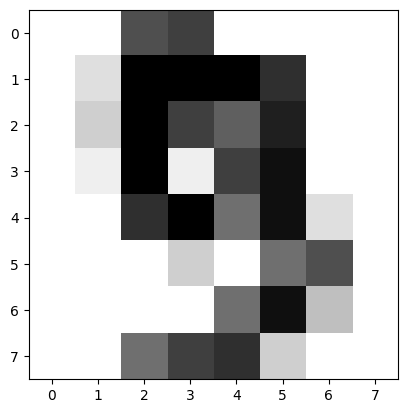

In [ ]:
import matplotlib.pyplot as plt
from sklearn import datasets, metrics
from sklearn.model_selection import train_test_split

digits = datasets.load_digits()
plt.imshow(digits.images[9],cmap =plt.cm.gray_r,interpolation ='nearest')

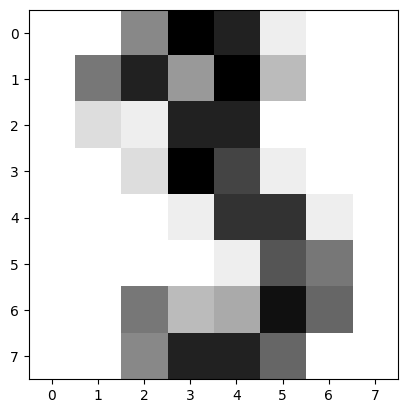

In [ ]:
import matplotlib.pyplot as plt
from sklearn import datasets, metrics
from sklearn.model_selection import train_test_split

digits = datasets.load_digits()
plt.imshow(digits.images[3], cmap=plt.cm.gray_r, interpolation ='nearest')

In [ ]:
digits.images.shape#n_sample이 1797개 있다.

(1797, 8, 8)

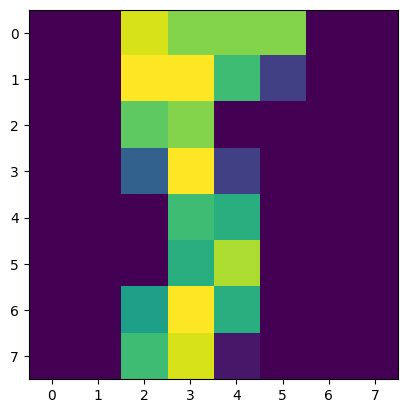

In [ ]:
plt.imshow(digits.images[1650])

In [ ]:
from sklearn import datasets # 수정 2024_04_17 week7-2 퍼셉트론 추가
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

digits = datasets.load_digits()
data = digits.images.reshape((len(digits.images),64))
X_train , x_test, y_train, y_test = train_test_split(data,digits.target, test_size =0.2)#훈련데이터와 테스트 데이터
#from sklearn.neighbors import KNeighborsClassifier #svm 모델
from sklearn.linear_model import Perceptron #퍼셉트론 모델

#knn = KNeighborsClassifier(n_neighbors= 6) #svm 모델
p = Perceptron(max_iter=100,eta0=0.001,verbose=0) #퍼셉트론 모델
p.fit(X_train, y_train)
y_pred = p.predict(x_test)
# knn.fit(X_train, y_train) #svm 모델
# y_pred = knn.predict(x_test)# svm모델

from sklearn import metrics

score =metrics.accuracy_score(y_test, y_pred)
print(score)

0.9472222222222222


In [ ]:
plt.imshow(x_test[100].reshape(8,8))

NameError: name 'x_test' is not defined

In [ ]:
knn.predict(x_test[[101,100]])

array([4, 8])

In [ ]:
from sklearn import datasets
import pandas as pd

# iris 데이터셋 로드
d = datasets.load_iris()

# 데이터를 DataFrame으로 변환
df = pd.DataFrame(data=d.data, columns=d.feature_names)

# DataFrame 정보 출력
print(df.info())

# 데이터셋 설명 출력
print(d.DESCR)


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 150 entries, 0 to 149
Data columns (total 4 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   sepal length (cm)  150 non-null    float64
 1   sepal width (cm)   150 non-null    float64
 2   petal length (cm)  150 non-null    float64
 3   petal width (cm)   150 non-null    float64
dtypes: float64(4)
memory usage: 4.8 KB
None
.. _iris_dataset:

Iris plants dataset
--------------------

**Data Set Characteristics:**

:Number of Instances: 150 (50 in each of three classes)
:Number of Attributes: 4 numeric, predictive attributes and the class
:Attribute Information:
    - sepal length in cm
    - sepal width in cm
    - petal length in cm
    - petal width in cm
    - class:
            - Iris-Setosa
            - Iris-Versicolour
            - Iris-Virginica

:Summary Statistics:

============== ==== ==== ======= ===== ====================
                Min  Max   Mean    SD   C

In [ ]:
from sklearn import svm

s = svm.SVC(gamma=0.1, C=10) #C 변수는 margin 마진 svm 분류 모델 SVC 객체 생성하고
s.fit(d.data, d.target) # iris 데이터로 학습
new_d =[[6.4,3.2,6.0,2.5],[7.1,3.1,4.7,1.35]] # 101번째와 51번쨰 샘플을 변형하여 새로운 데이터 생성
res = s.predict(new_d)
print("새로운 2개 샘플의 부류는",res)

새로운 2개 샘플의 부류는 [2 1]


# 비선형 분류기 사용
# 과잉 적합 회피
# 1) 과잉 적합은 아웃라이어를 맞히려고 과다하게 복잡한 결정 경계를 만드는 현상
# 2) 훈련 집합에 대한 성능은 높지만 테스트 지합에 대해서는 형편없는 성능(낮은 일반화)
# 3)원인과 대처법은 5,6,2항에서 설명

In [ ]:
from sklearn import datasets
from sklearn import svm

digit = datasets.load_digits()
# svm의 분류기 모델 SC를 학습
s = svm.SVC(gamma=0.1,C=10) #학습 모델 구축
s.fit(digit.data,digit.target) # digit 데이터로 모델링
# 훈련 집합의 앞에 있는 샘플 3개를 새로운 샘플로 간주하고 인식해봄
new_d =[digit.data[0],digit.data[1],digit.data[2]]
res = s.predict(new_d)
print("예측값은 ",res)
print("참값은 ",digit.target[0],digit.target[1],digit.target[2])
#훈련 집합을 테스트 집합으로 간주하여 인식해보고 정확률을 측정
res = s.predict(digit.data)
correct=[i for i in range(len(res)) if res[i]==digit.target[i]]
accuracy= len(correct)/len(res)
print("화소 특징을 사용했을 때 정확률=",accuracy*100, "%")

예측값은  [0 1 2]
참값은  0 1 2
화소 특징을 사용했을 때 정확률= 100.0 %


In [ ]:
from sklearn import datasets
from sklearn import svm
from sklearn.model_selection import train_test_split
import numpy as np

digit = datasets.load_digits()
x_train,x_test,y_train,y_test = train_test_split(digit.data,digit.target,train_size=0.6)

#svm의 분류 모델 svc를 학습
#중간고사 문제 나옴 외울 것~!@~!@~!@~!@~!@~!######################
s =svm.SVC(gamma=0.001)
s.fit(x_train, y_train)
res = s.predict(x_test)
s = svm.SVC(gamma=0.001)
s.fit(x_train, y_train)
res = s.predict(x_test)
s= svm.SVC(gamma=0.001)
############################################################
#혼동 행렬 구함
conf =np.zeros((10,10))
for i in range(len(res)):
  conf[res[i]][y_test[i]]+=1
print(conf)

no_correct=0
for i in range(10):
  no_correct+=conf[i][i]
accuracy =no_correct/len(res)
print("테스트 집합에 대한 정확률은",accuracy*100,"%입니다.")

[[67.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0. 59.  0.  0.  0.  0.  1.  0.  3.  0.]
 [ 0.  0. 64.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0. 68.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0. 82.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0. 69.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0. 81.  0.  0.  0.]
 [ 0.  0.  0.  1.  0.  0.  0. 78.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0. 71.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0. 75.]]
테스트 집합에 대한 정확률은 99.30458970792768 %입니다.


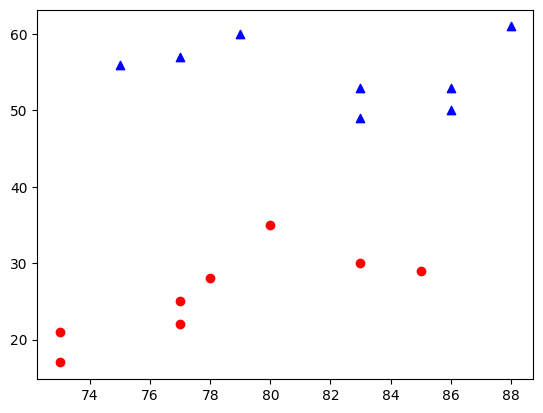

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

dach_length = [77,78,85,83,73,77,73,80]
dach_height = [25,28,29,30,21,22,17,35]

samo_length = [75,77,86,86,79,83,83,88]
samo_height = [56,57,50,53,60,53,49,61]

plt.scatter(dach_length, dach_height, c='red', label ='dachshund')
plt.scatter(samo_length, samo_height,c='blue',marker='^',label='Samoyed')

plt.show()


In [ ]:
import PIL.Image as pilimg
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import MeanShift,KMeans
from sklearn.mixture import GaussianMixture

#Read image
im = pilimg.open('img.jpg')
im = im.resize((100,100))
x = np.array(im)
plt.imshow(x)
vec = x.reshape((x.shape[0]*x.shape[1],x.shape[2])) #2차원 벡터 변환(h*w, channel)

clustering = MeanShift(bandwidth=50).fit (vec)#클러스터 개수 지정
print("Class num: ",clustering.labels_.max())
c_vec =vec.copy()
rand_color = np.random.rand(clustering.labels_.max()+1, 3)
for k in range(0,x.shape[0]*x.shape[1]):
  c_vec[k,:]=rand_color [clustering.labels_[k],: ]
  vis_cluster = c_vec.reshape((x.shape[0],x.shape[1],x.shape[2]))
  plt.imshow(vis_cluster)

FileNotFoundError: [Errno 2] No such file or directory: 'img.jpg'